In [1]:
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene
library(clusterProfiler)
library(ggplot2)
library(ReactomePA)



ChIPseeker v1.34.1  For help: https://guangchuangyu.github.io/software/ChIPseeker

If you use ChIPseeker in published research, please cite:
Qianwen Wang, Ming Li, Tianzhi Wu, Li Zhan, Lin Li, Meijun Chen, Wenqin Xie, Zijing Xie, Erqiang Hu, Shuangbin Xu, Guangchuang Yu. Exploring epigenomic datasets by ChIPseeker. Current Protocols 2022, 2(10): e585

Loading required package: GenomicFeatures

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, whic

# Nanopore

In [2]:
files <- list(
    "barcode09_rev" = "data/stranded/barcode09.breaks.rev.bed.gz",
    "barcode09_fwd" = "data/stranded/barcode09.breaks.fwd.bed.gz",
    "barcode07_rev" = "data/stranded/barcode07.breaks.rev.bed.gz",
    "barcode07_fwd" = "data/stranded/barcode07.breaks.fwd.bed.gz",
    "barcode04_rev" = "data/stranded/barcode04.breaks.rev.bed.gz",
    "barcode04_fwd" = "data/stranded/barcode04.breaks.fwd.bed.gz",
    "barcode03_rev" = "data/stranded/barcode03.breaks.rev.bed.gz",
    "barcode03_fwd" = "data/stranded/barcode03.breaks.fwd.bed.gz",
    "barcode02_rev" = "data/stranded/barcode02.breaks.rev.bed.gz",
    "barcode02_fwd" = "data/stranded/barcode02.breaks.fwd.bed.gz",
    "barcode01_rev" = "data/stranded/barcode01.breaks.rev.bed.gz",
    "barcode01_fwd" = "data/stranded/barcode01.breaks.fwd.bed.gz"

)

chrY dosen't contain signal higher than 1



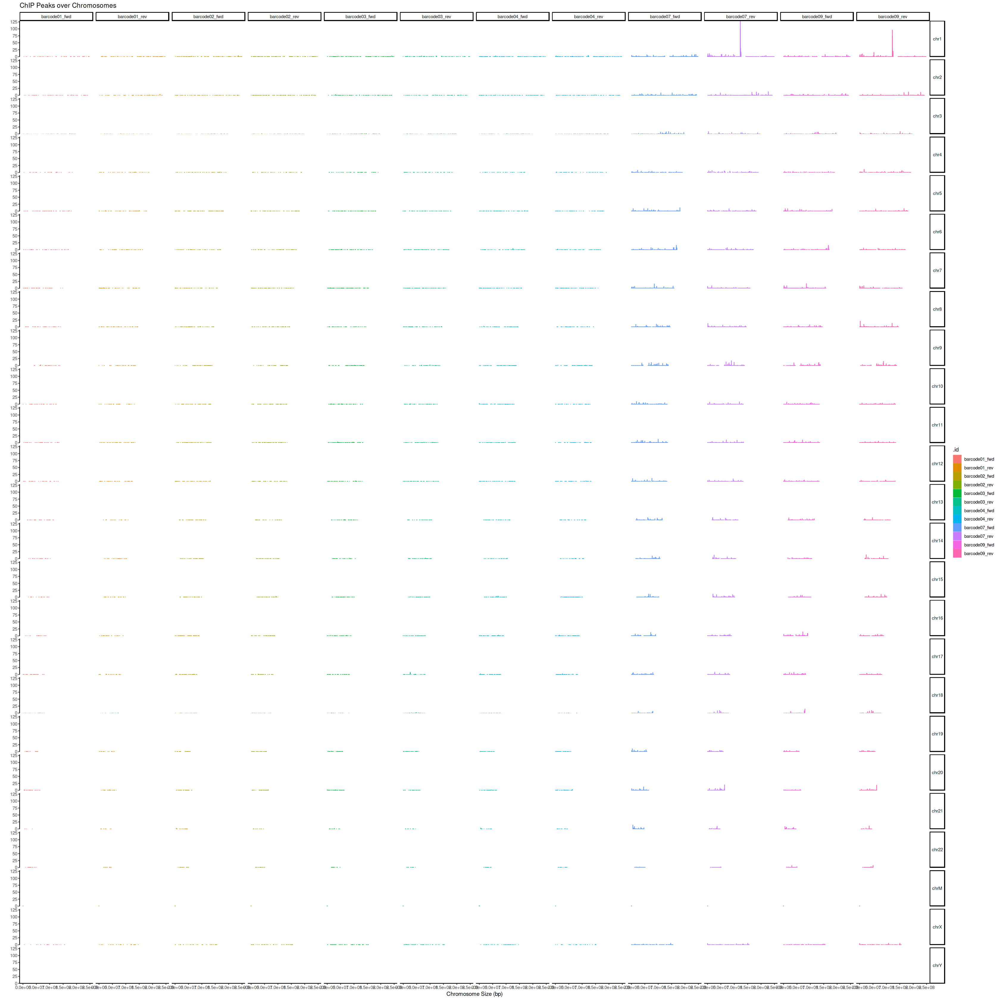

In [3]:
options(repr.plot.height=28, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id)

## Barcode01

chrY dosen't contain signal higher than 1



>> preparing start_site regions by gene... 2024-06-28 03:30:54 PM
>> preparing tag matrix...  2024-06-28 03:30:54 PM 
>> preparing start_site regions by gene... 2024-06-28 03:31:02 PM
>> preparing tag matrix...  2024-06-28 03:31:02 PM 
>> plotting figure...			 2024-06-28 03:31:07 PM 


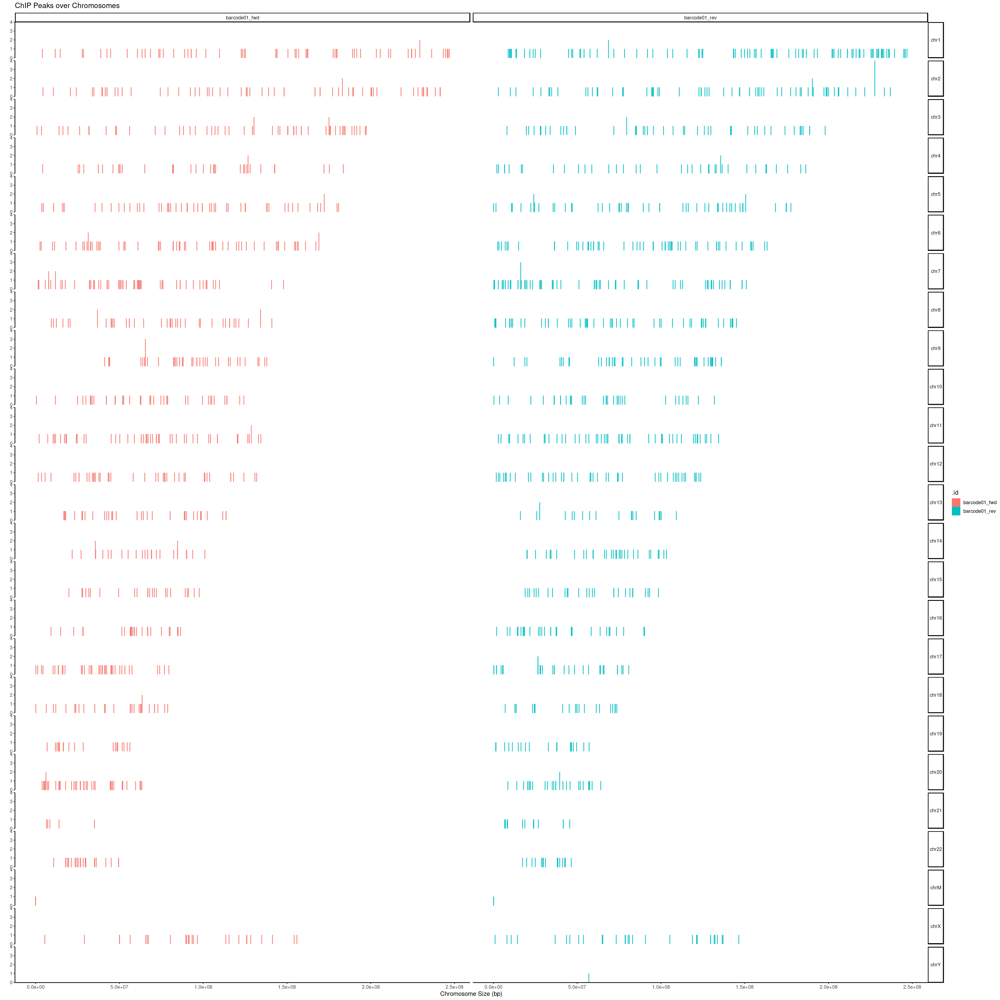

>> plotting figure...			 2024-06-28 03:31:08 PM 
>> Running bootstrapping for tag matrix...		 2024-06-28 03:31:08 PM 
>> Running bootstrapping for tag matrix...		 2024-06-28 03:31:09 PM 


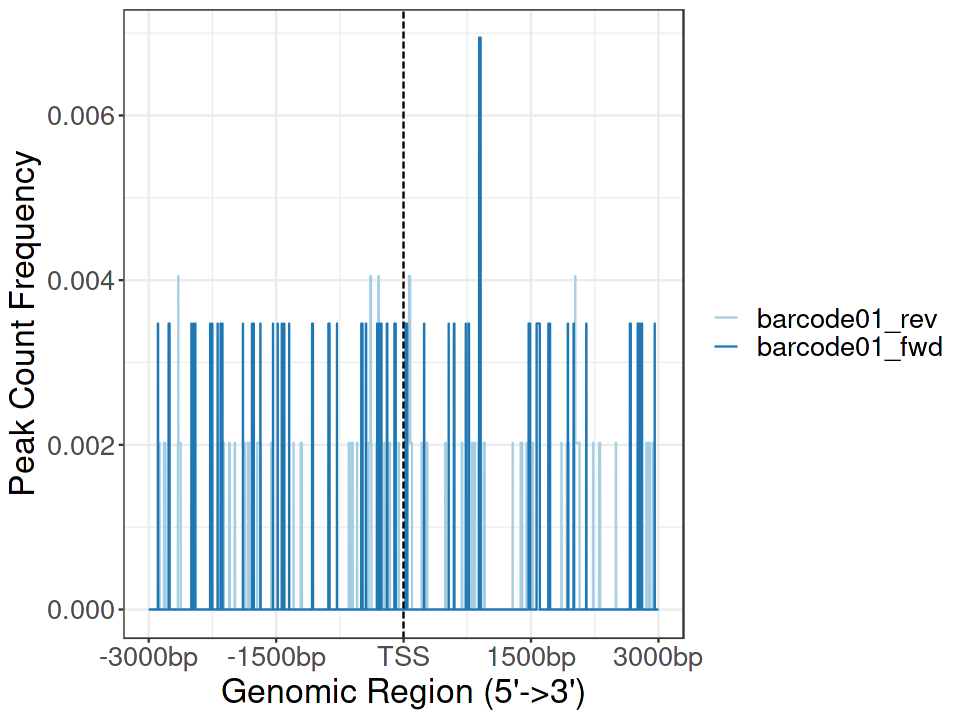

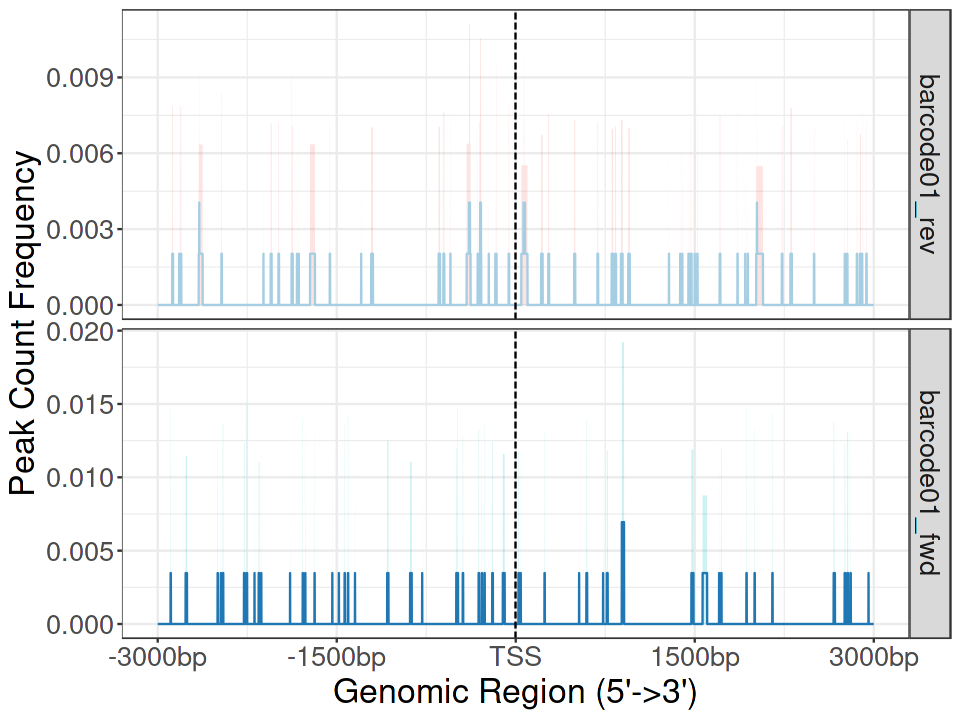

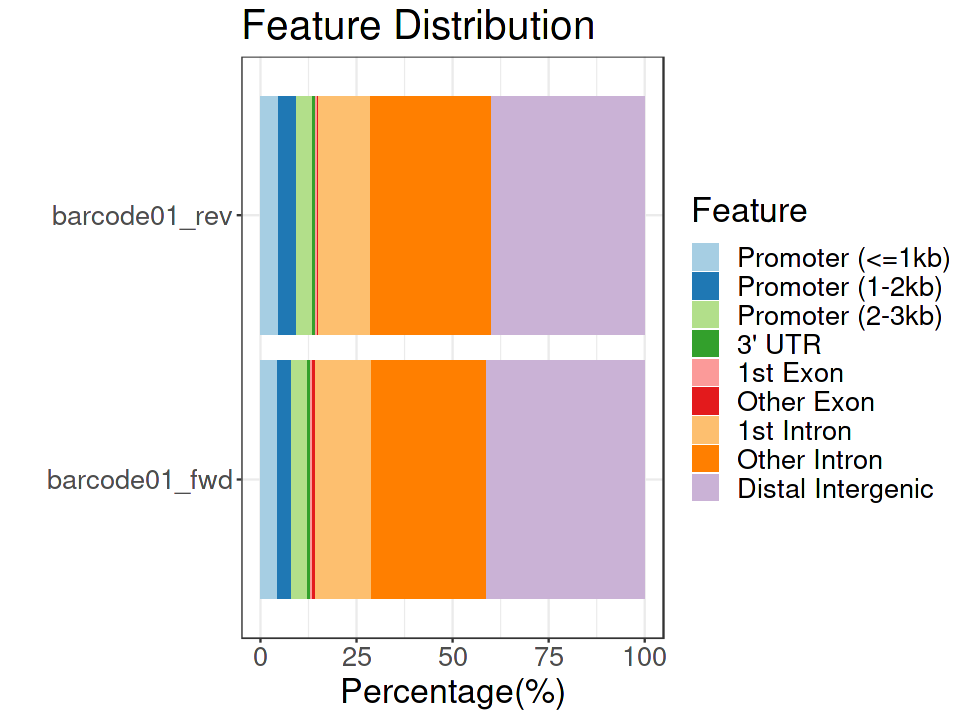

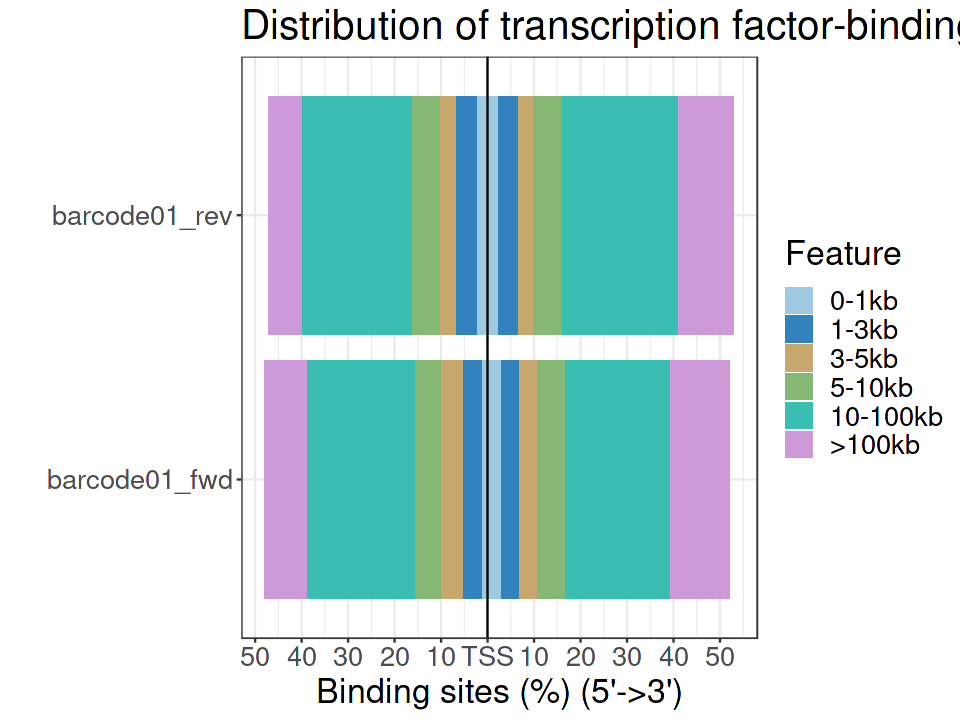

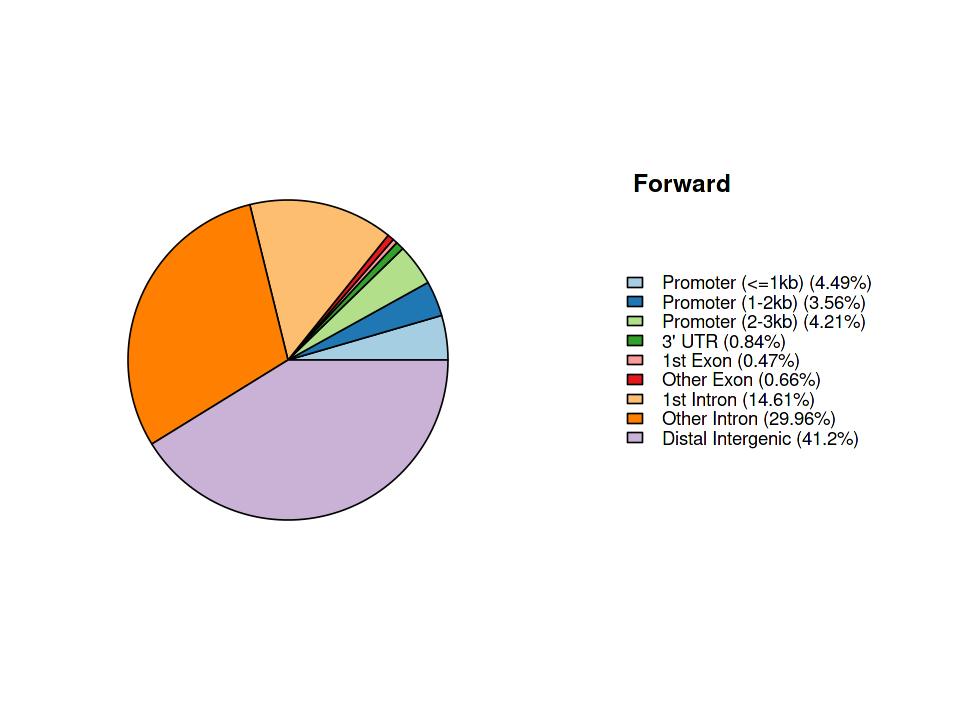

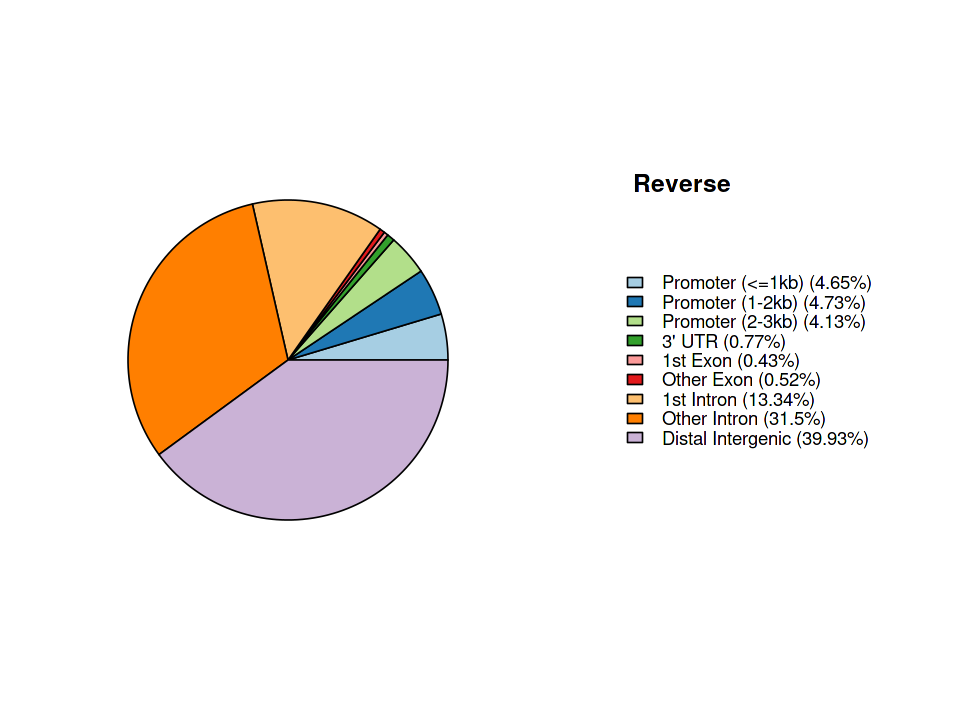

NULL

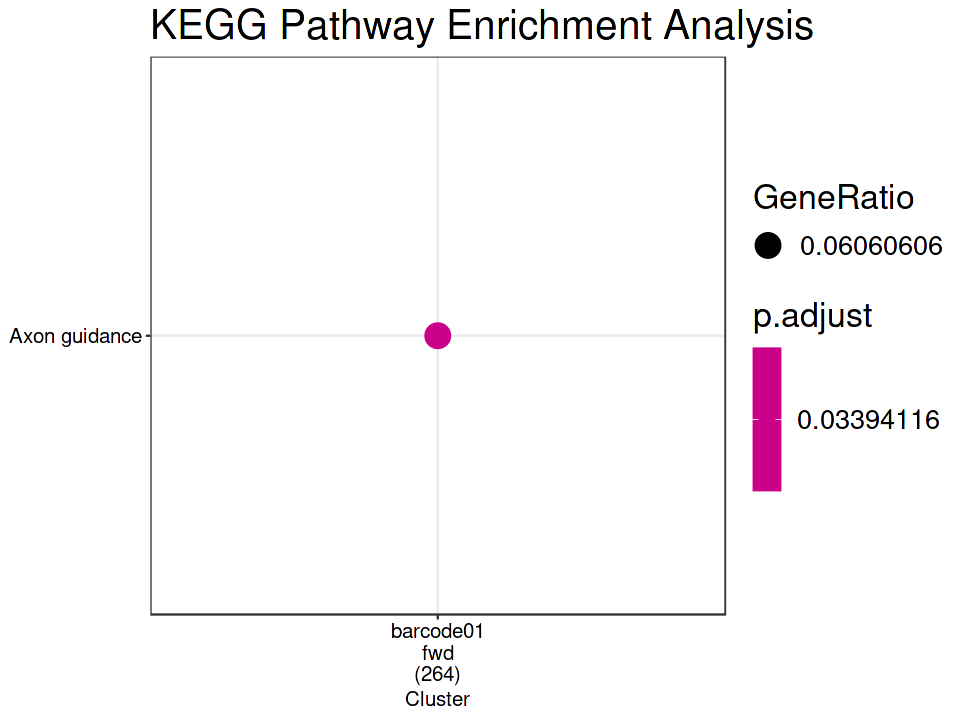

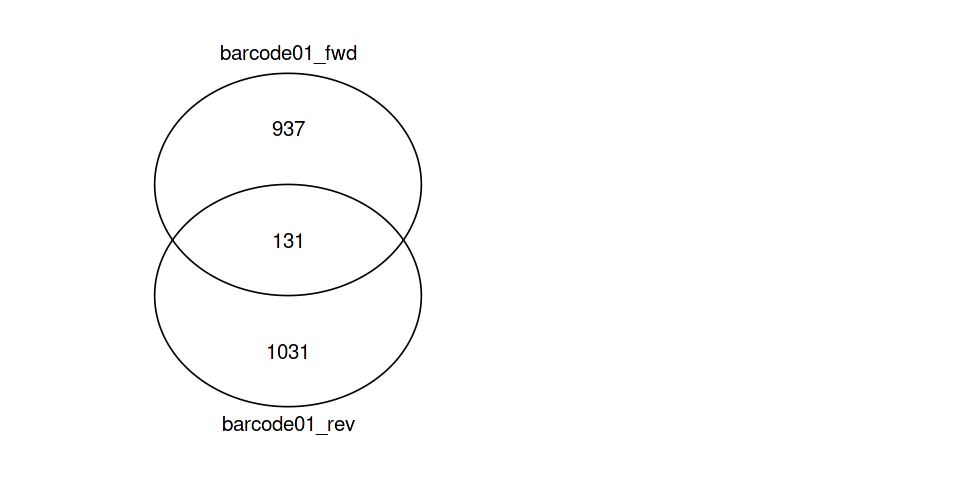

In [4]:
files <- list(
    "barcode01_rev" = "data/stranded/barcode01.breaks.rev.bed.gz",
    "barcode01_fwd" = "data/stranded/barcode01.breaks.fwd.bed.gz"
)
options(repr.plot.height=28, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=12))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$barcode01_fwd
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$barcode01_rev
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=6, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

In [7]:
peakAnnoList$barcode01_rev



Annotated peaks generated by ChIPseeker
1162/1164  peaks were annotated
Genomic Annotation Summary:
            Feature  Frequency
7  Promoter (<=1kb)  4.6471601
8  Promoter (1-2kb)  4.7332186
9  Promoter (2-3kb)  4.1308090
3            3' UTR  0.7745267
1          1st Exon  0.4302926
5        Other Exon  0.5163511
2        1st Intron 13.3390706
6      Other Intron 31.4974182
4 Distal Intergenic 39.9311532

## Barcode02

>> preparing start_site regions by gene... 2024-05-24 08:56:07 PM
>> preparing tag matrix...  2024-05-24 08:56:07 PM 
>> preparing start_site regions by gene... 2024-05-24 08:56:13 PM
>> preparing tag matrix...  2024-05-24 08:56:13 PM 
>> plotting figure...			 2024-05-24 08:56:20 PM 


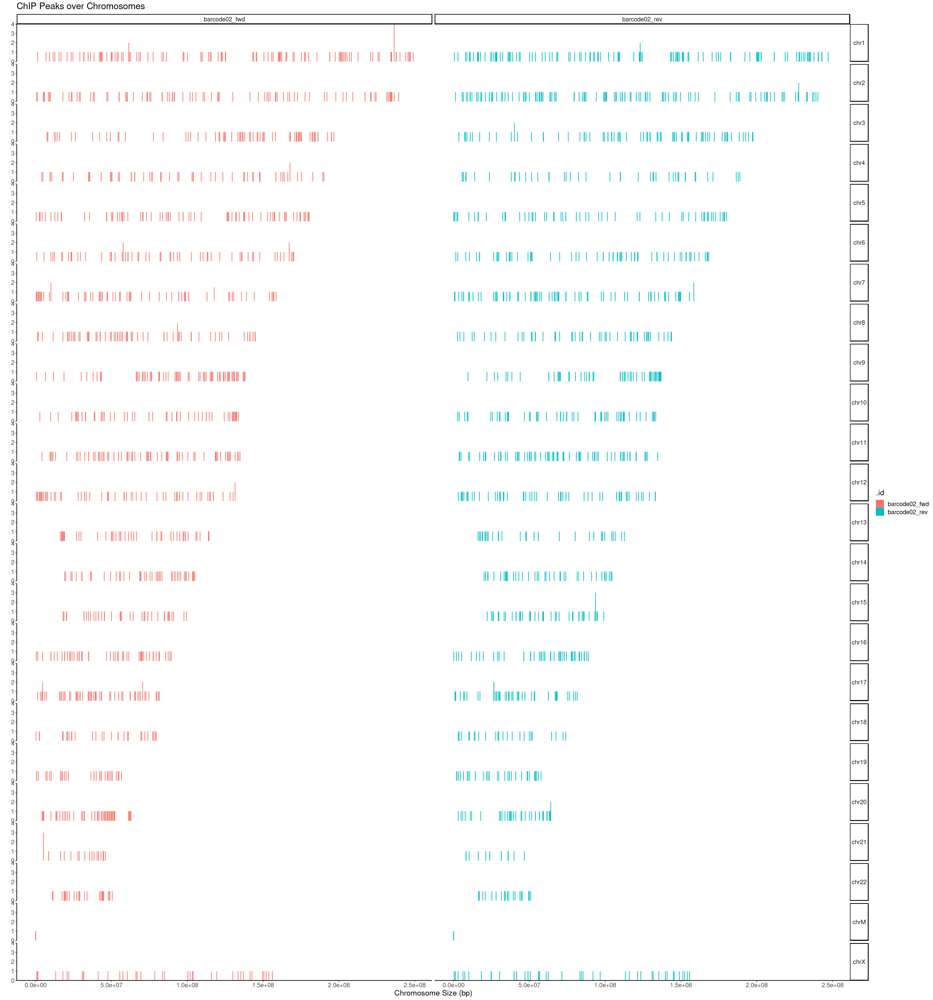

>> plotting figure...			 2024-05-24 08:56:21 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:56:21 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:56:23 PM 


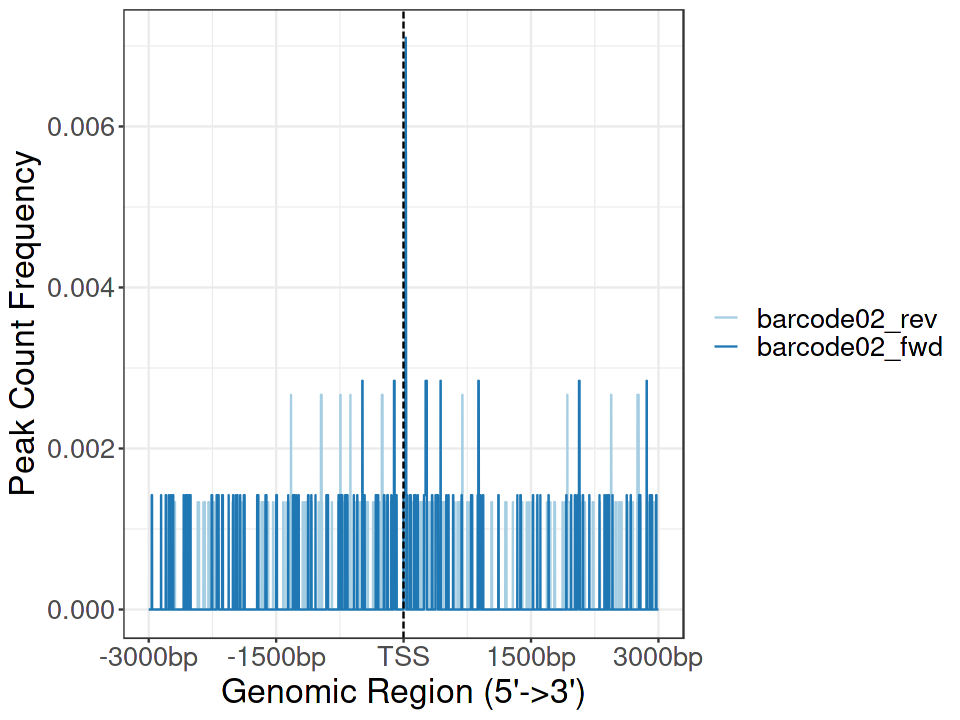

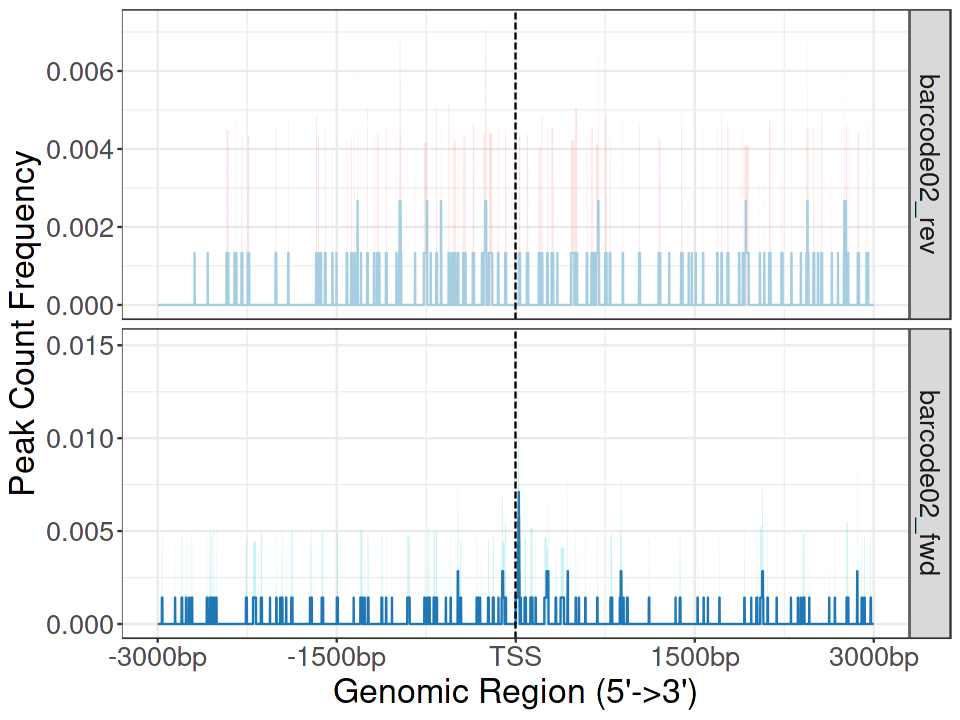

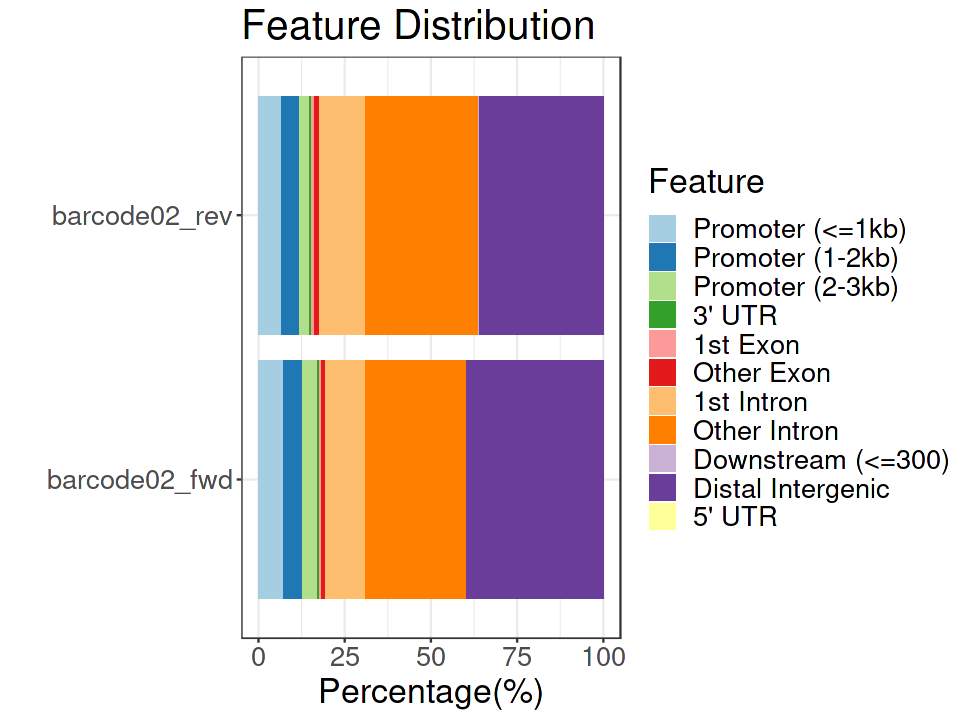

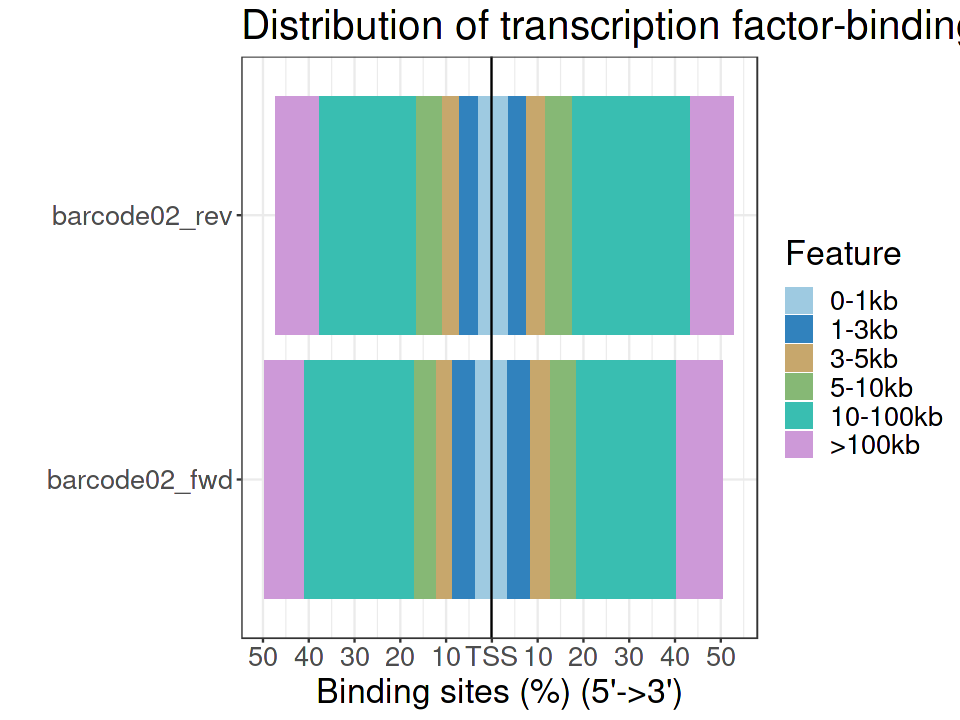

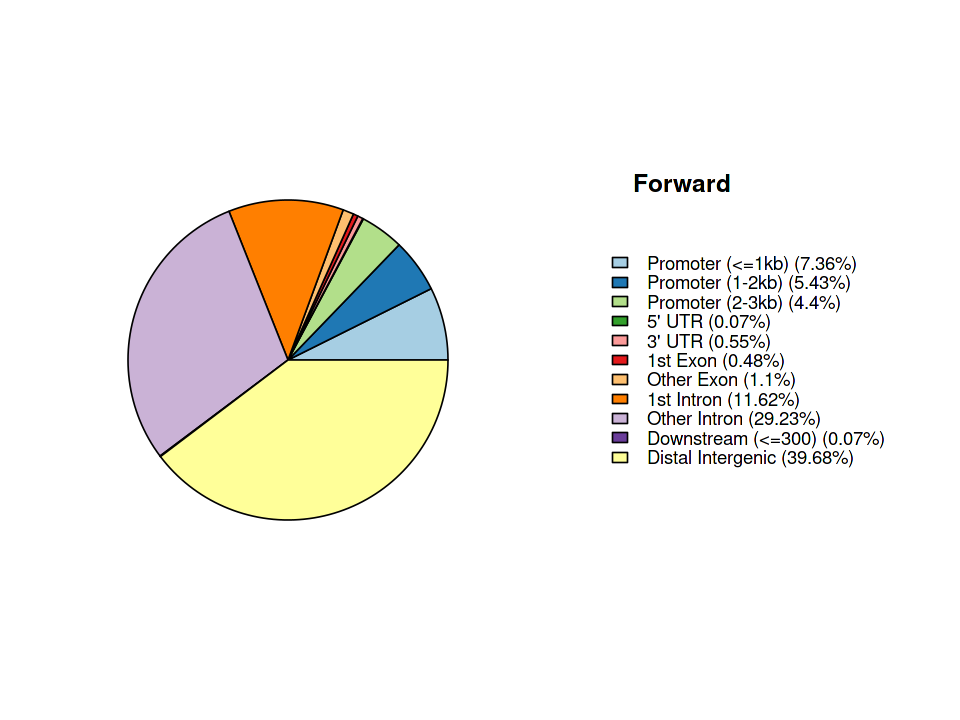

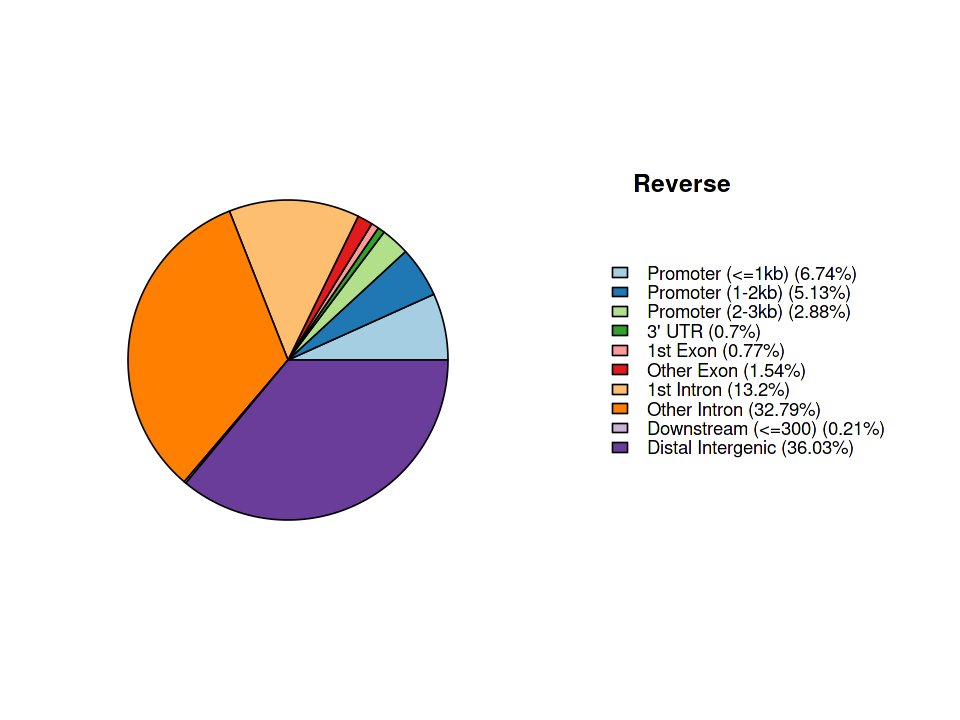

NULL

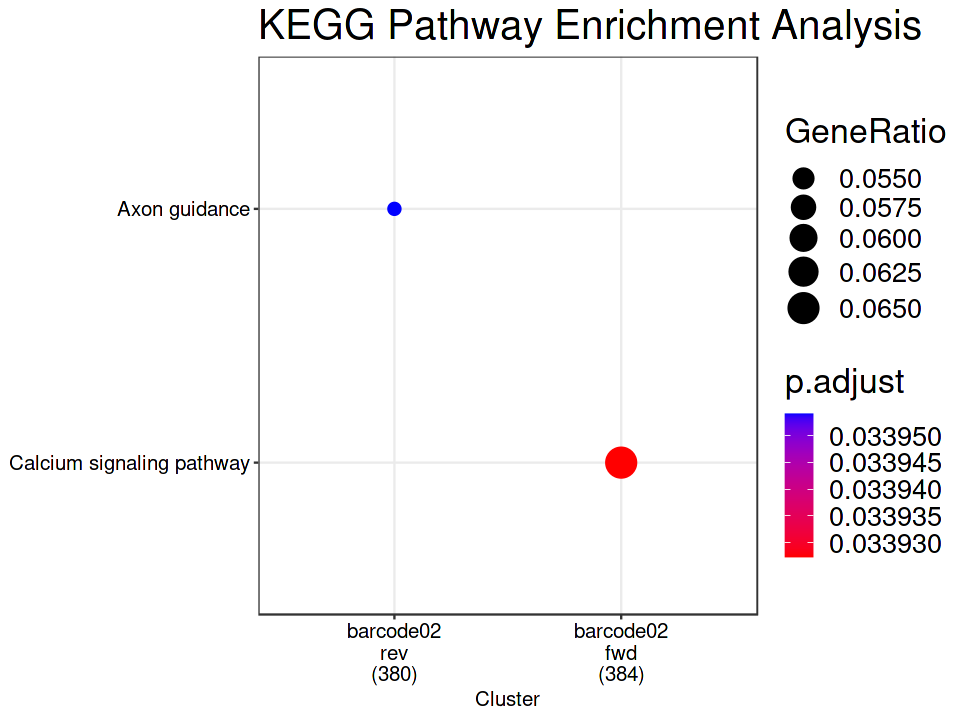

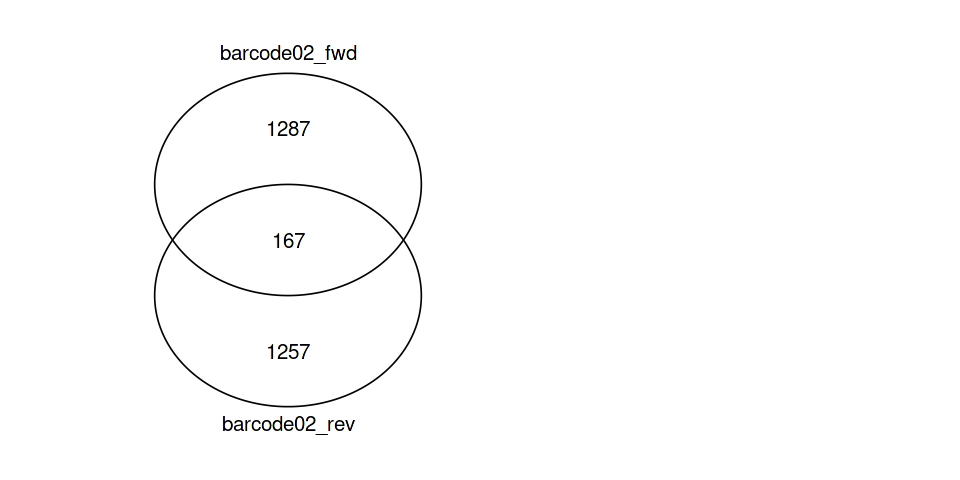

In [59]:
files <- list(
    "barcode02_rev" = "data/stranded/barcode02.breaks.rev.bed.gz",
    "barcode02_fwd" = "data/stranded/barcode02.breaks.fwd.bed.gz"
    )
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$barcode02_fwd
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$barcode02_rev
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=6, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## Barcode03

>> preparing start_site regions by gene... 2024-05-24 08:56:38 PM
>> preparing tag matrix...  2024-05-24 08:56:38 PM 
>> preparing start_site regions by gene... 2024-05-24 08:56:45 PM
>> preparing tag matrix...  2024-05-24 08:56:45 PM 
>> plotting figure...			 2024-05-24 08:56:52 PM 


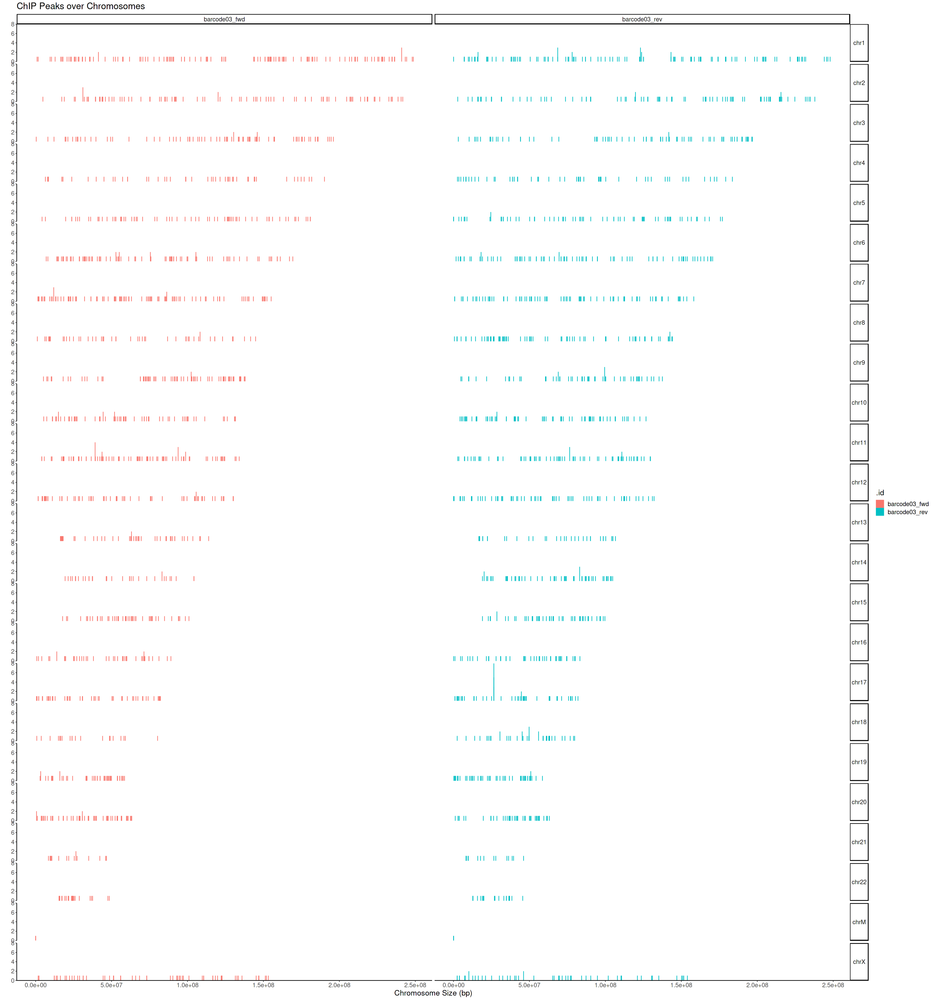

>> plotting figure...			 2024-05-24 08:56:52 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:56:53 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:56:54 PM 


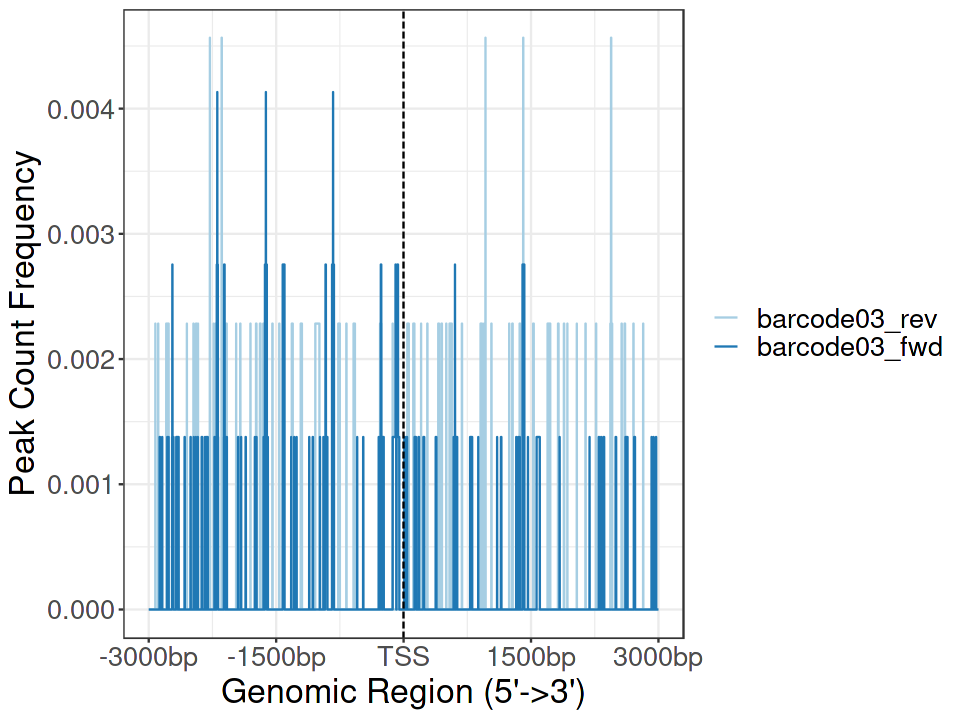

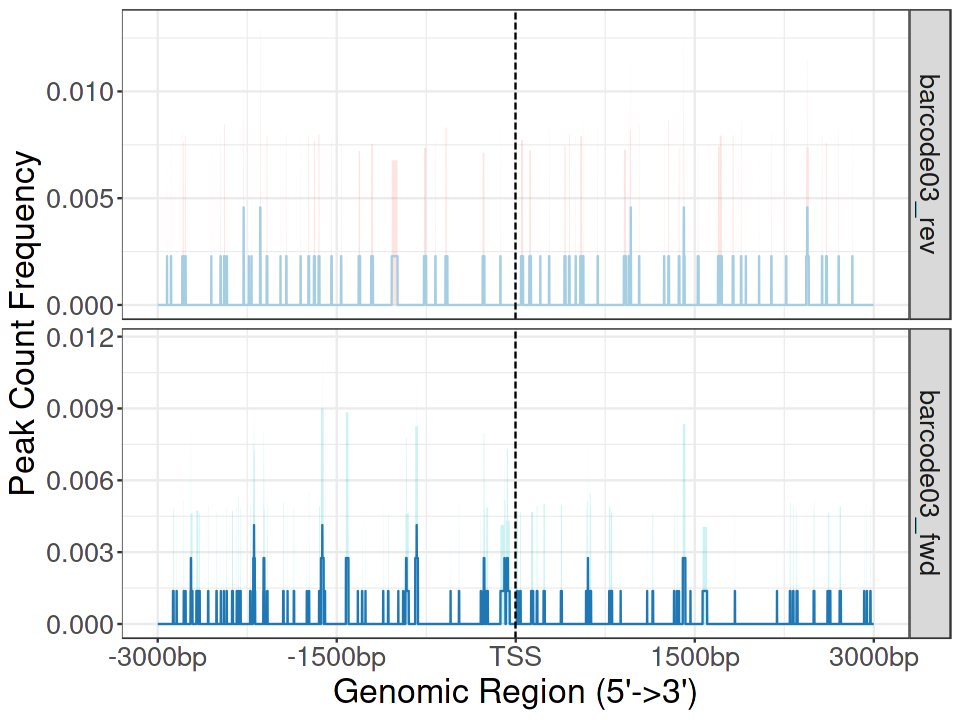

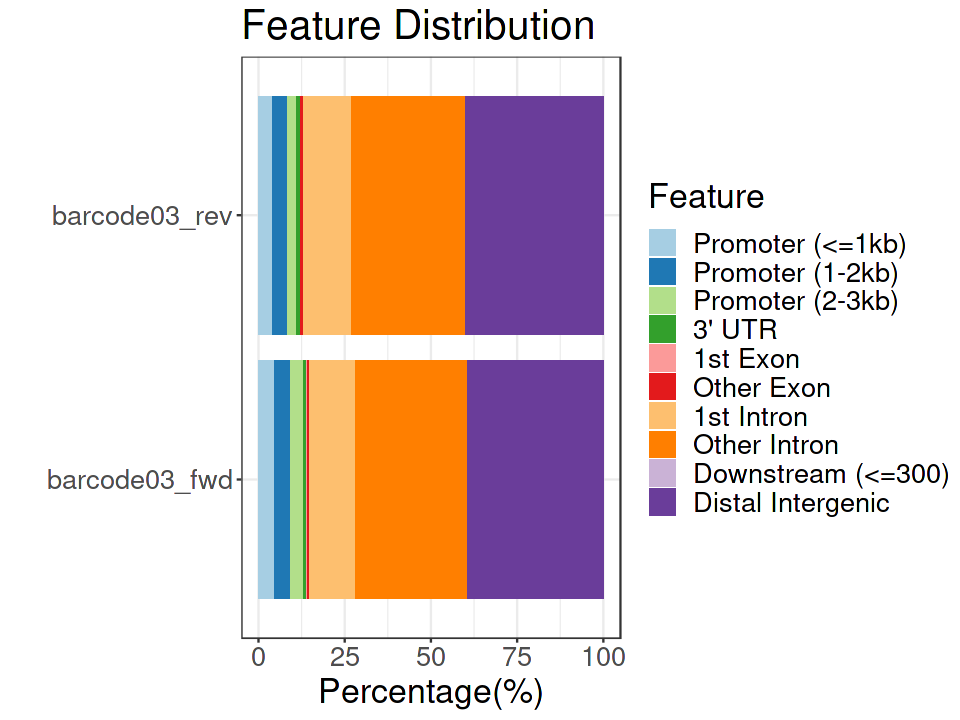

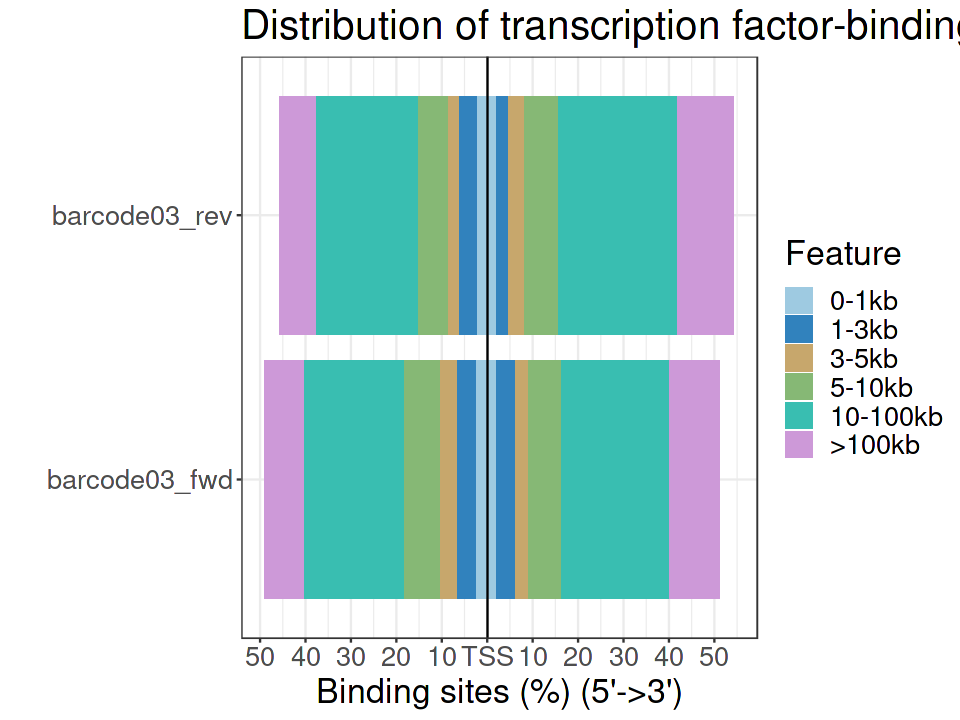

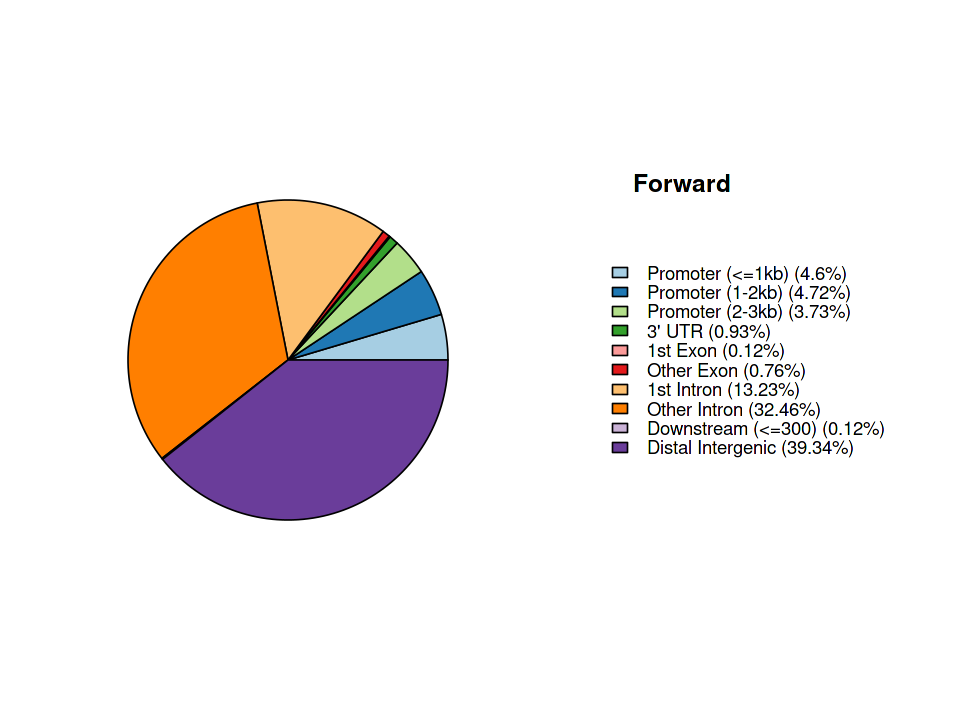

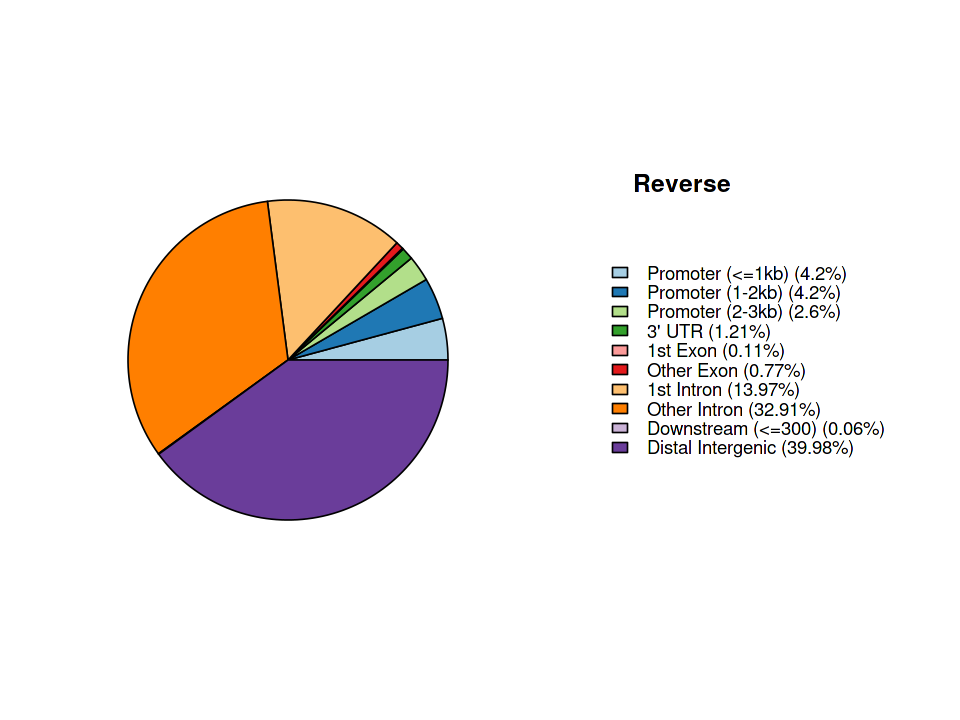

NULL

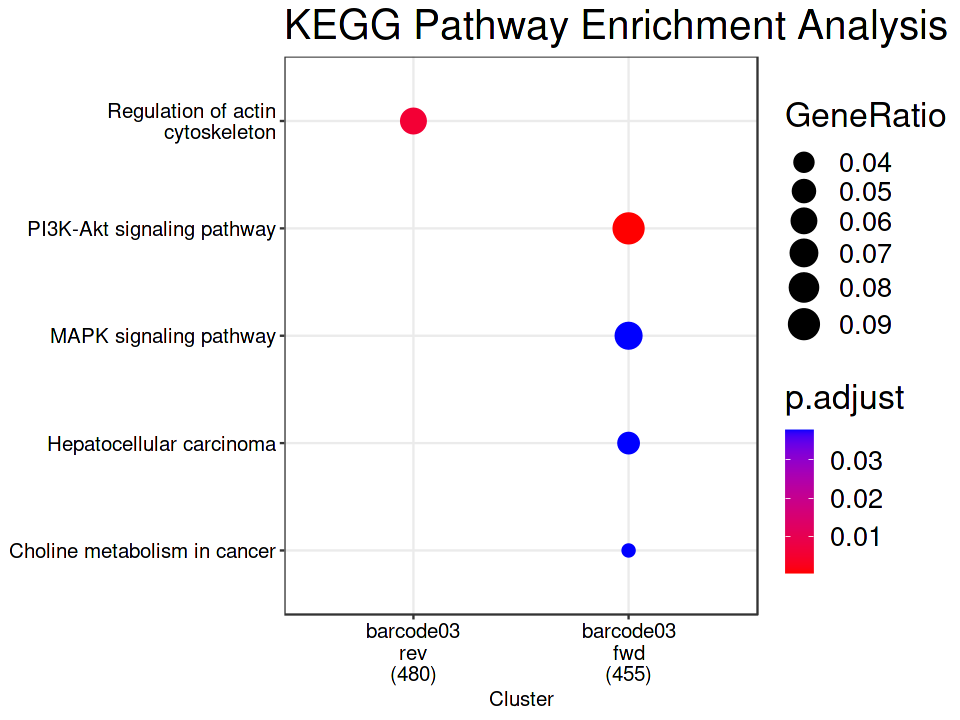

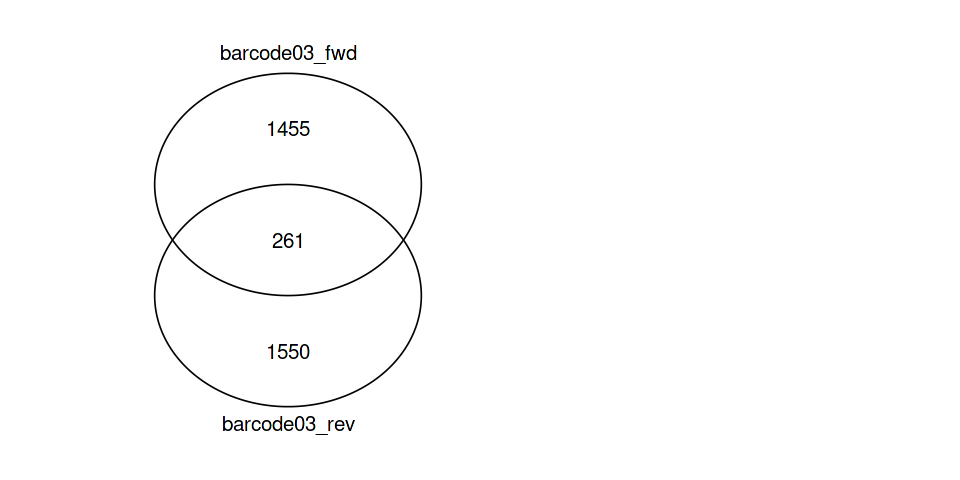

In [60]:
files <- list(
    "barcode03_rev" = "data/stranded/barcode03.breaks.rev.bed.gz",
    "barcode03_fwd" = "data/stranded/barcode03.breaks.fwd.bed.gz"
    )
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$barcode03_fwd
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$barcode03_rev
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=6, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## Barcode04

>> preparing start_site regions by gene... 2024-05-24 08:57:11 PM
>> preparing tag matrix...  2024-05-24 08:57:11 PM 
>> preparing start_site regions by gene... 2024-05-24 08:57:17 PM
>> preparing tag matrix...  2024-05-24 08:57:17 PM 
>> plotting figure...			 2024-05-24 08:57:23 PM 


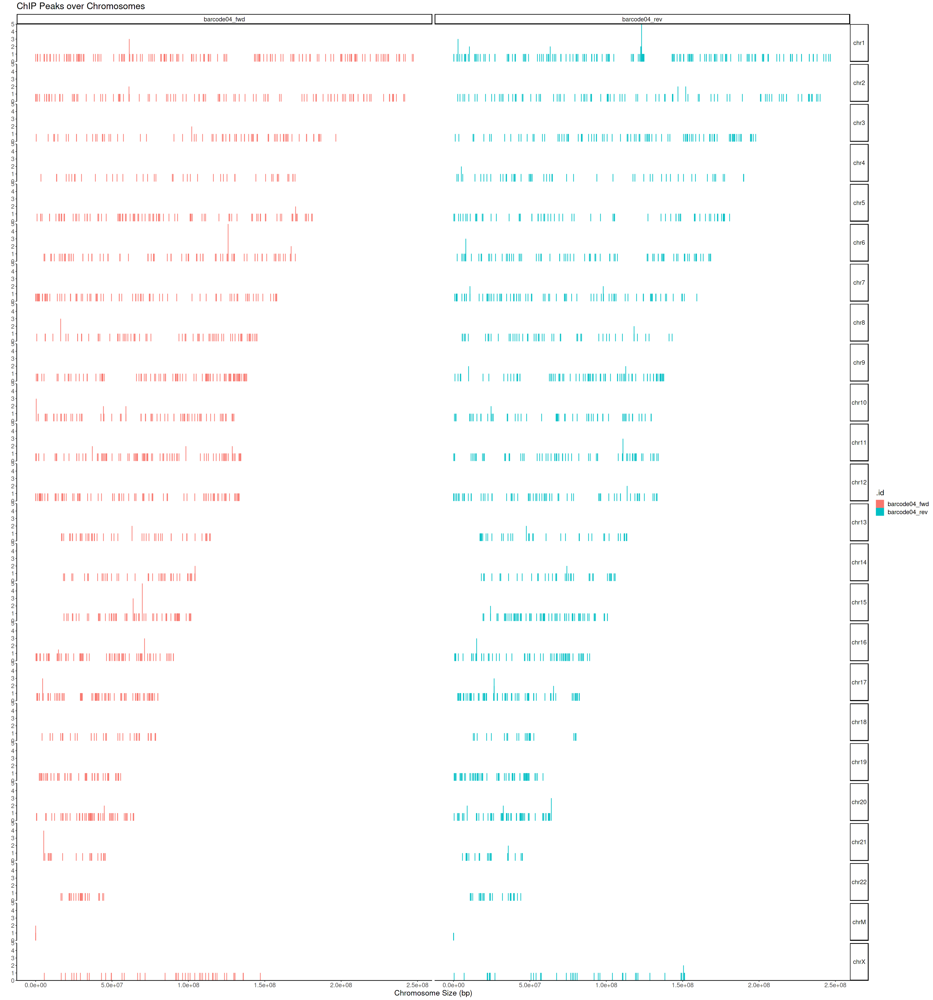

>> plotting figure...			 2024-05-24 08:57:24 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:57:24 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:57:26 PM 


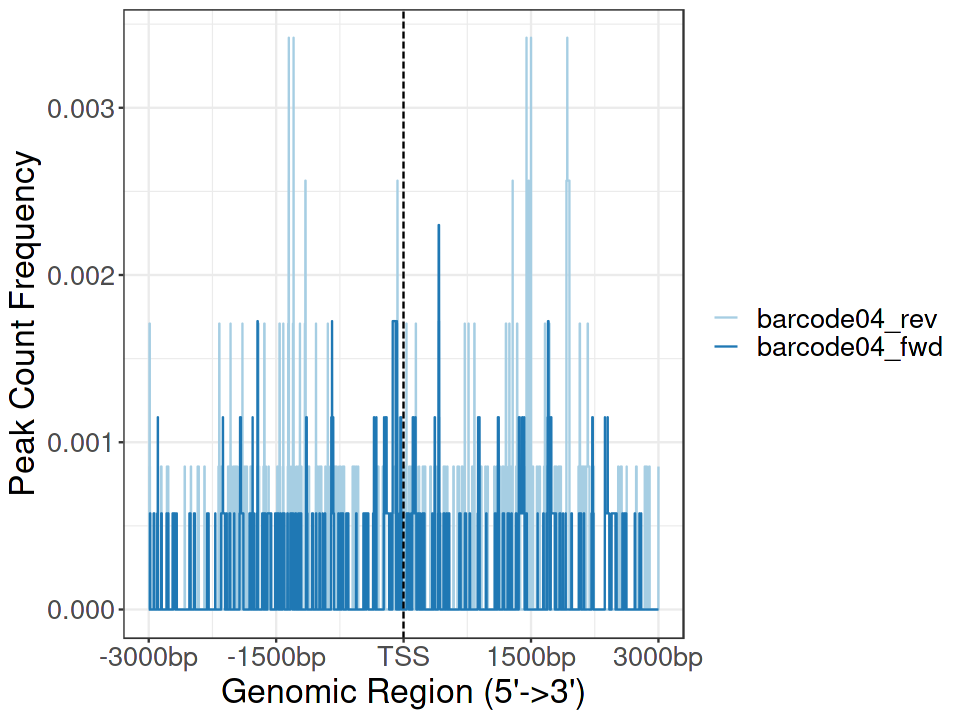

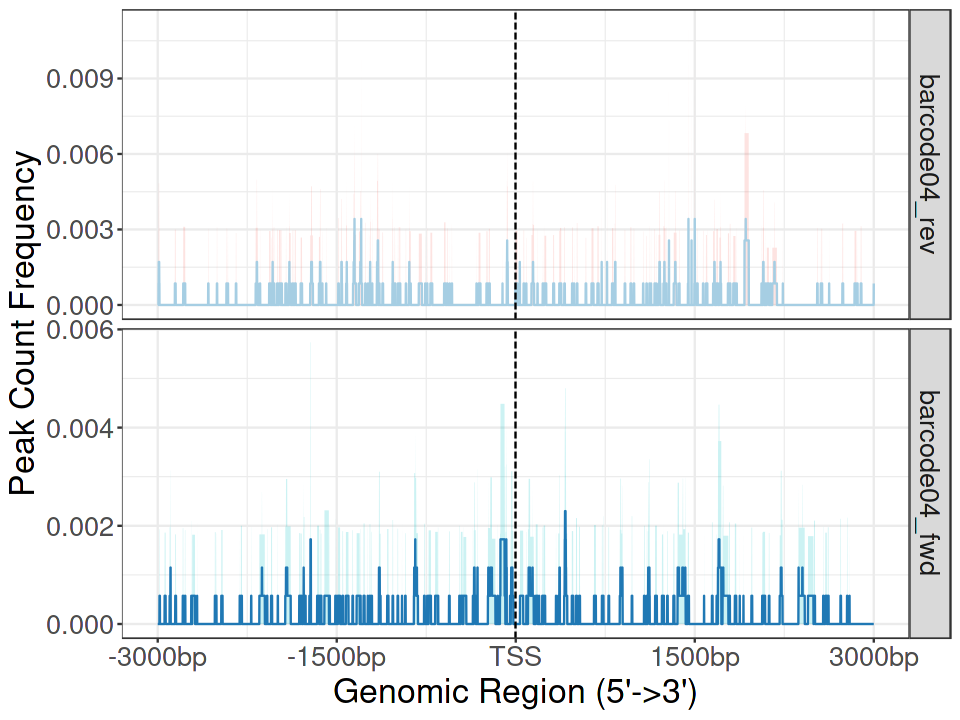

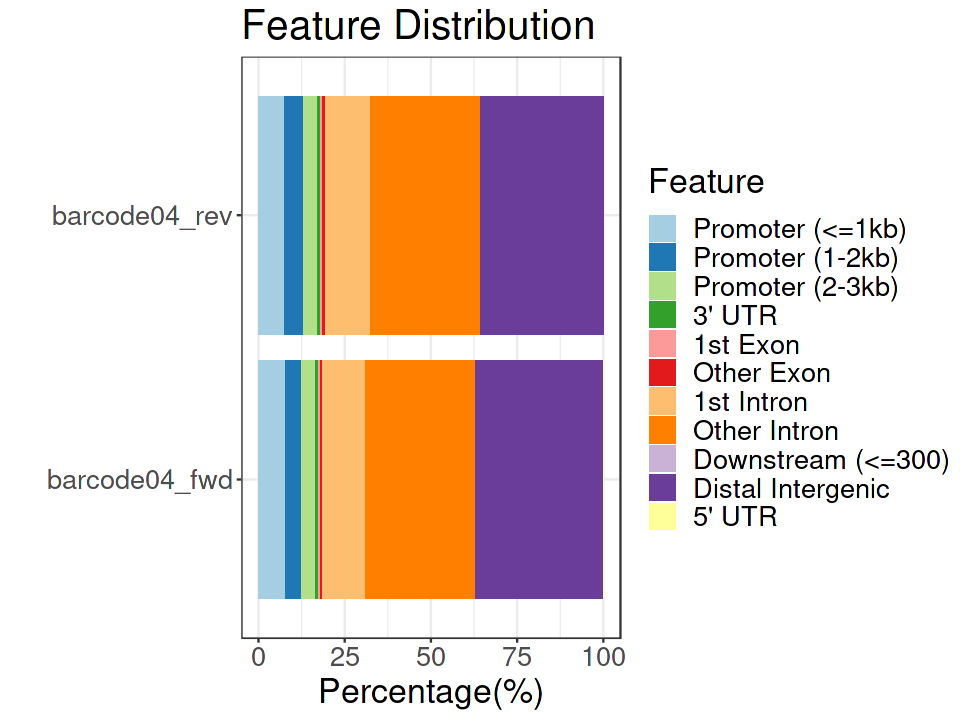

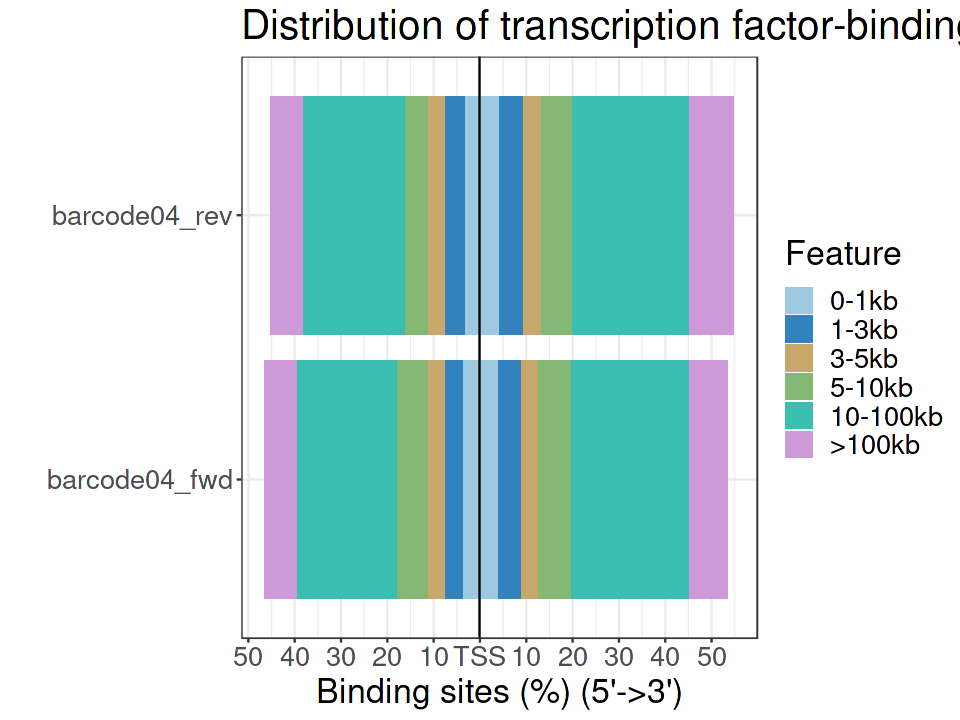

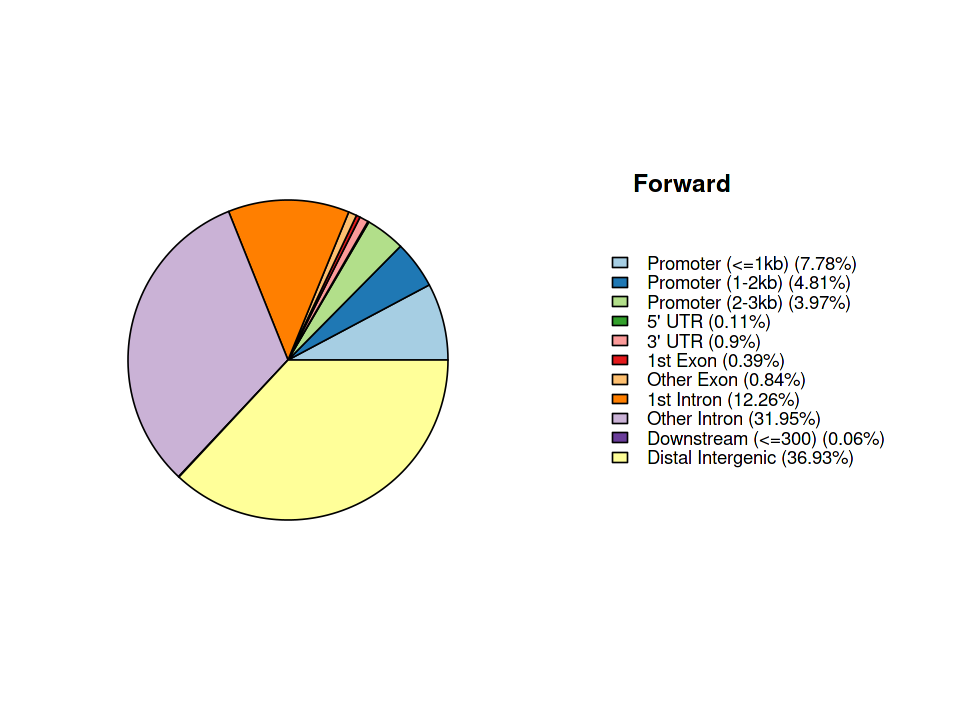

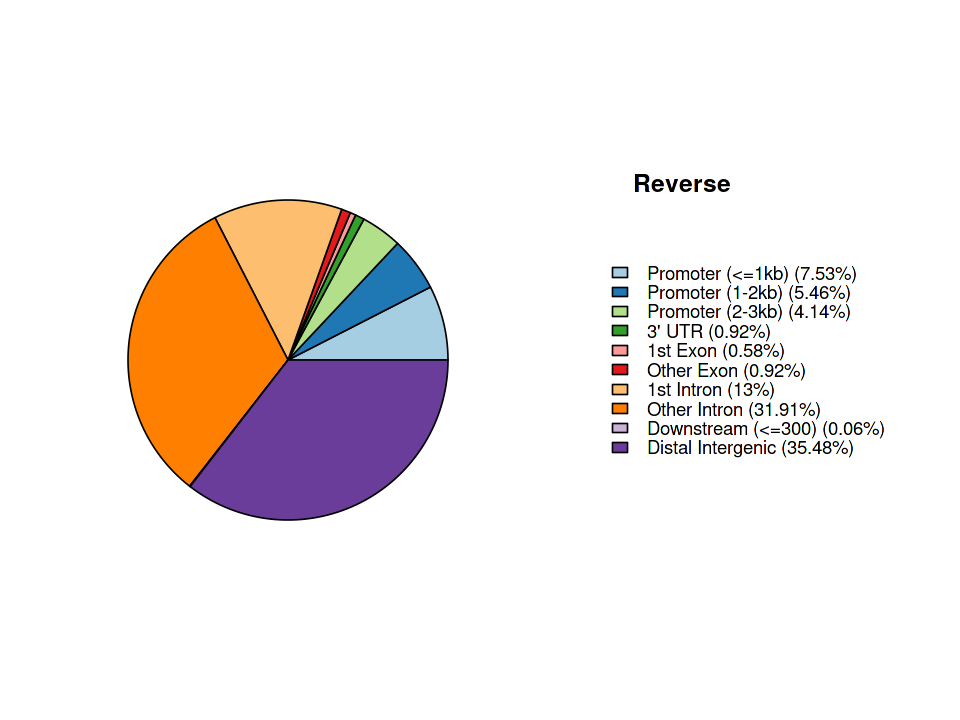

NULL

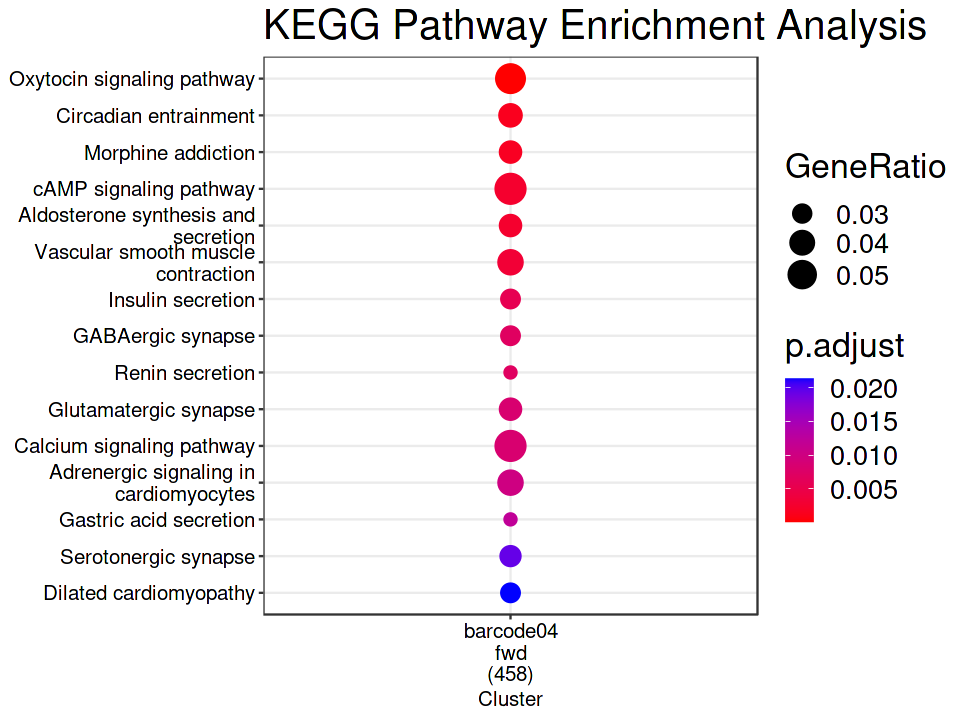

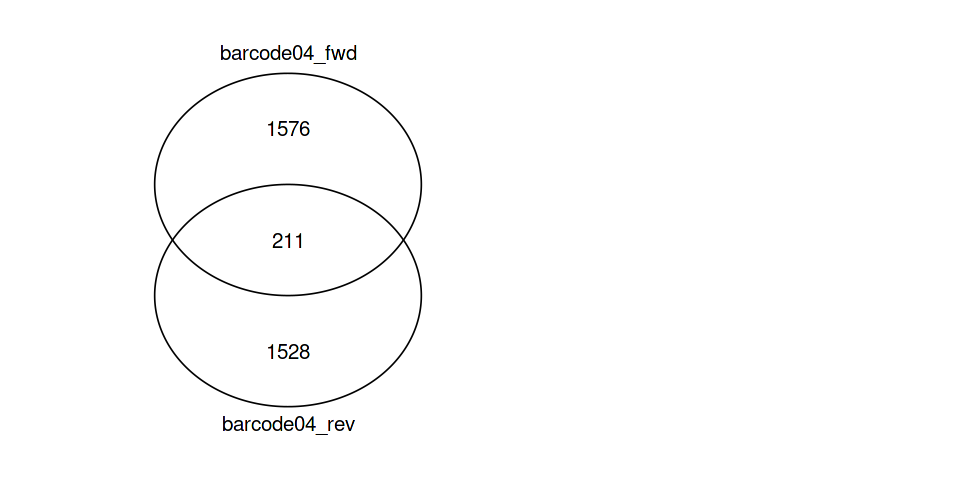

In [61]:
files <- list(
    "barcode04_rev" = "data/stranded/barcode04.breaks.rev.bed.gz",
    "barcode04_fwd" = "data/stranded/barcode04.breaks.fwd.bed.gz"
    
    )
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$barcode04_fwd
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$barcode04_rev
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=6, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## Barcode07

>> preparing start_site regions by gene... 2024-05-24 08:57:57 PM
>> preparing tag matrix...  2024-05-24 08:57:57 PM 
>> preparing start_site regions by gene... 2024-05-24 08:58:04 PM
>> preparing tag matrix...  2024-05-24 08:58:04 PM 
>> plotting figure...			 2024-05-24 08:58:11 PM 


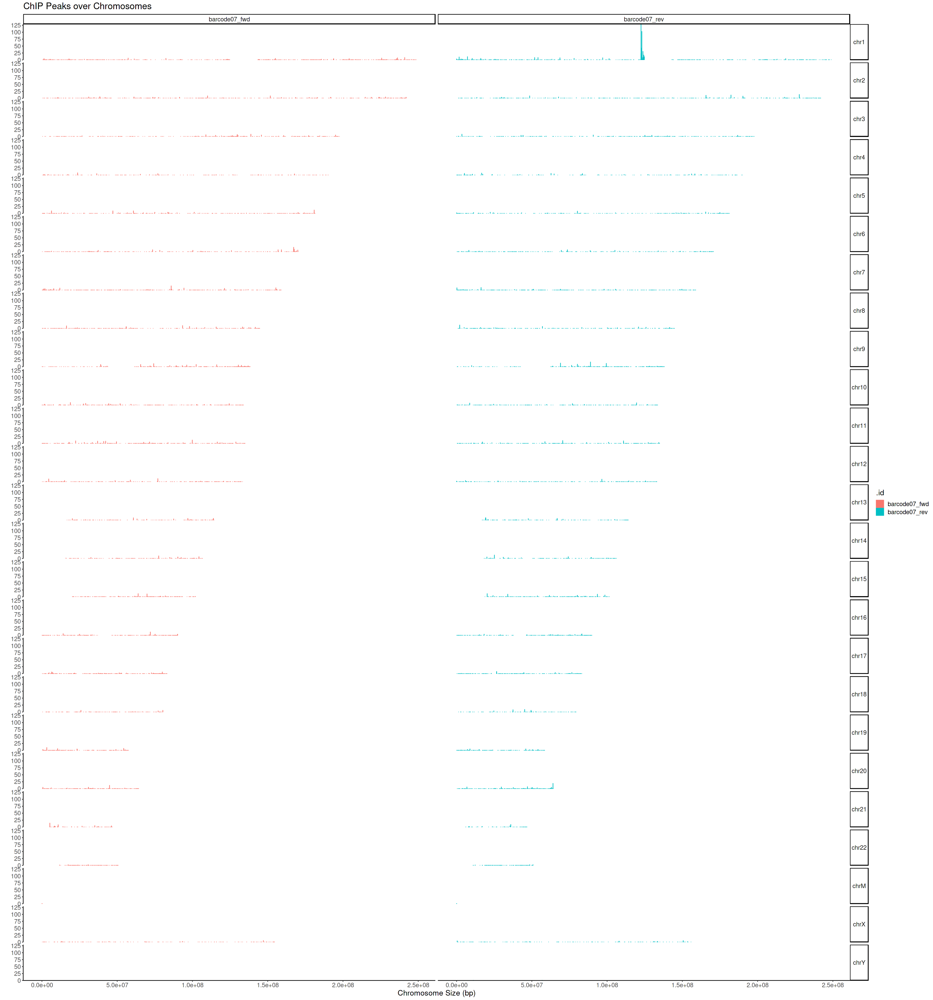

>> plotting figure...			 2024-05-24 08:58:12 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:58:15 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:58:18 PM 


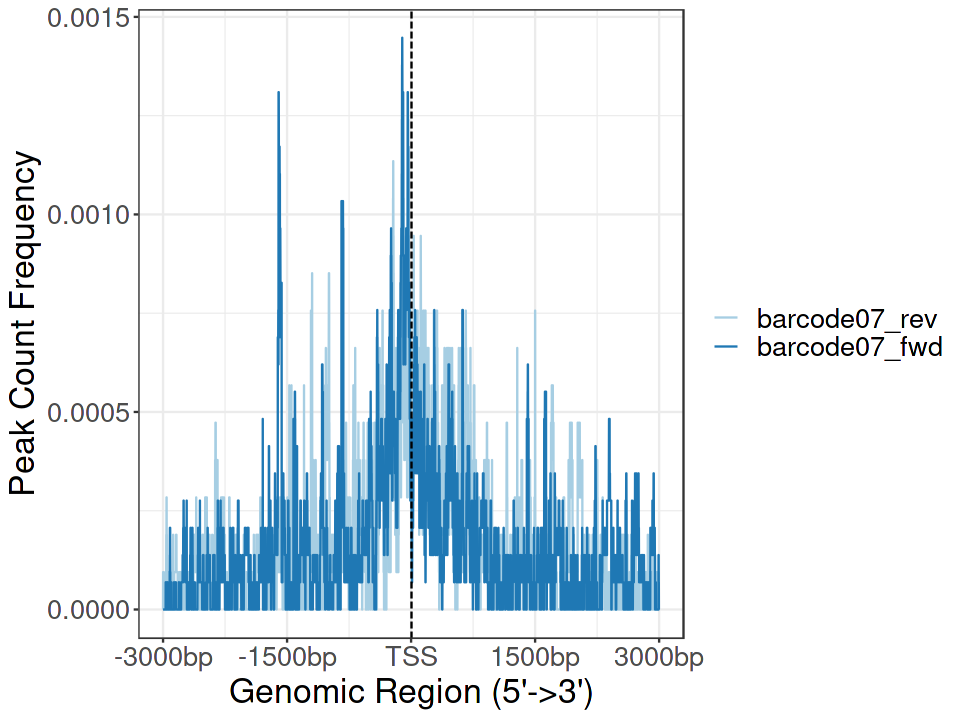

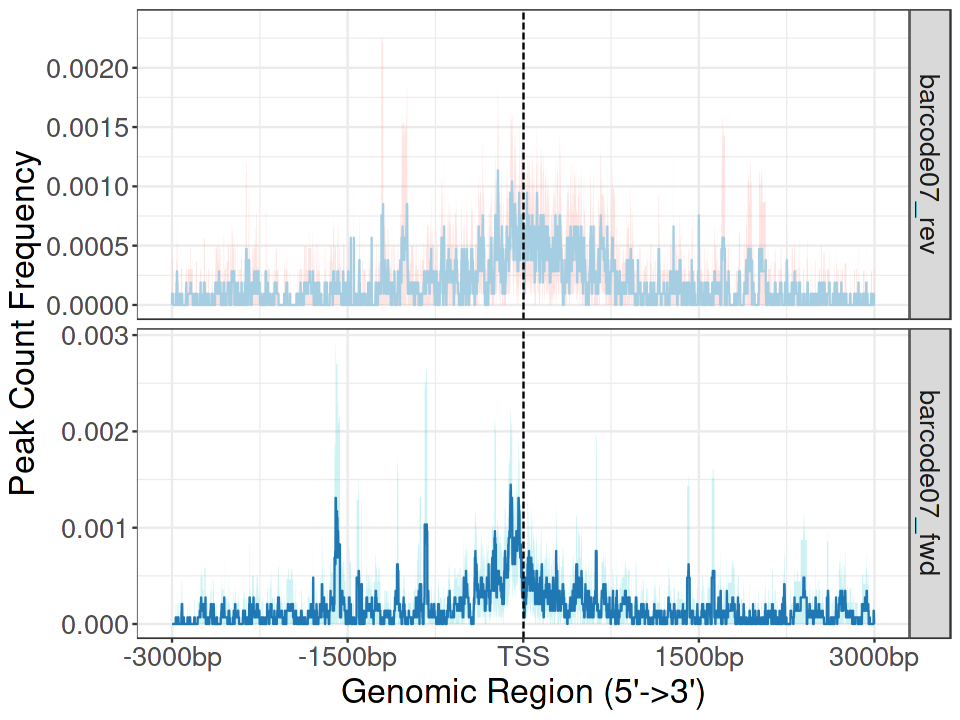

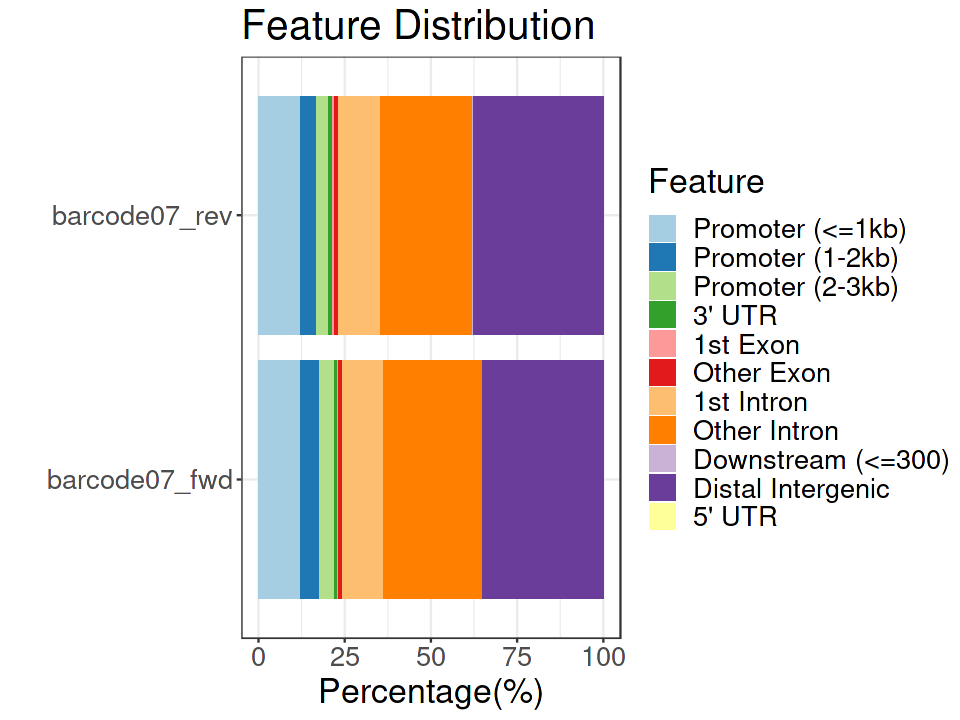

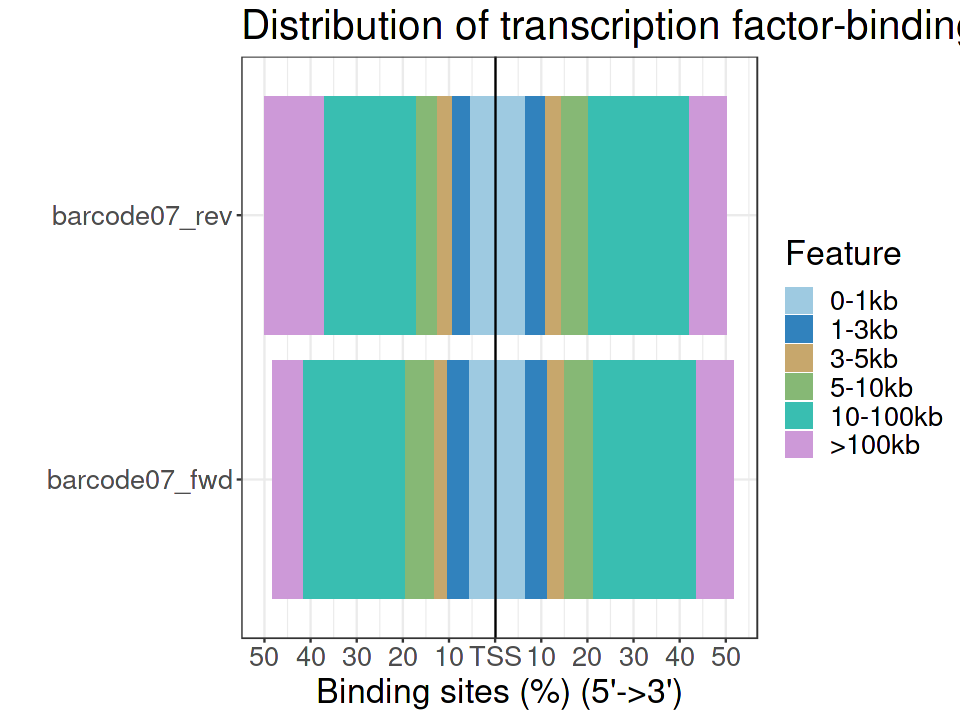

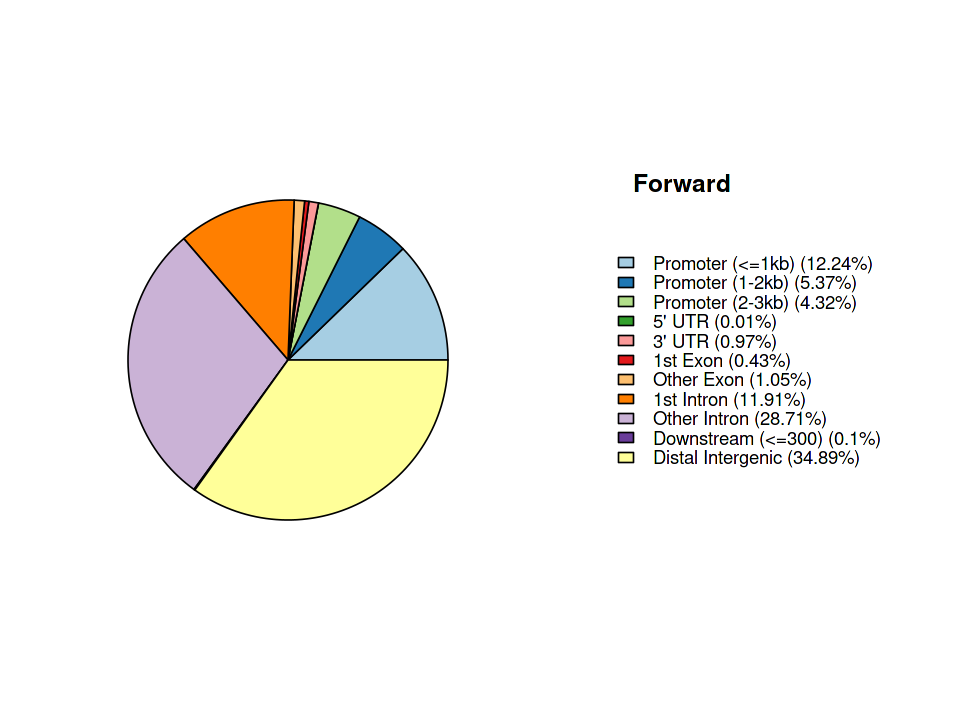

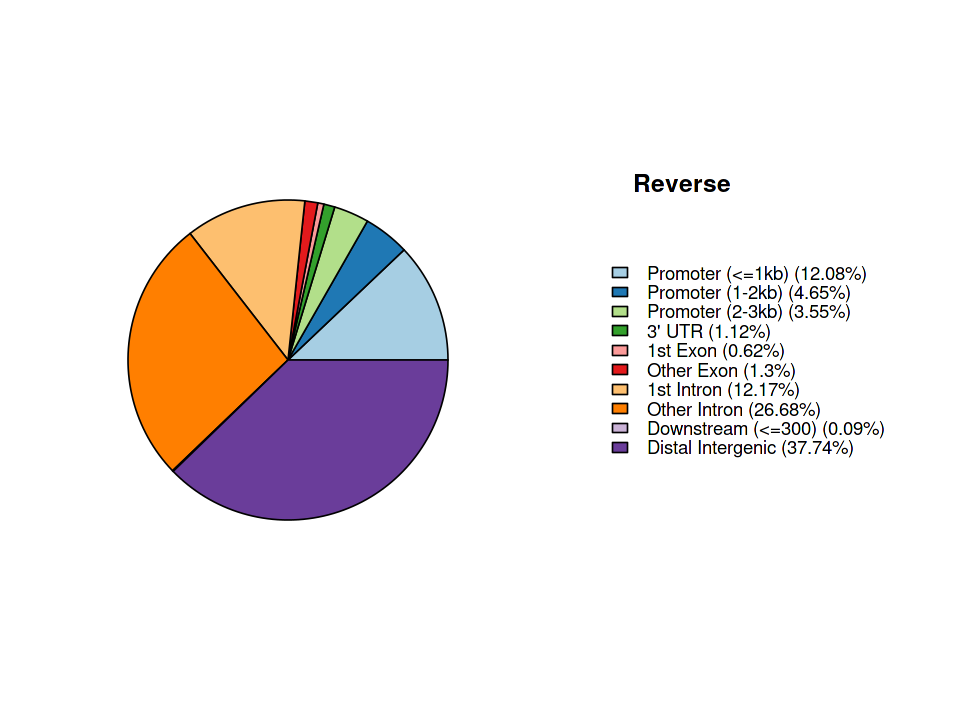

NULL

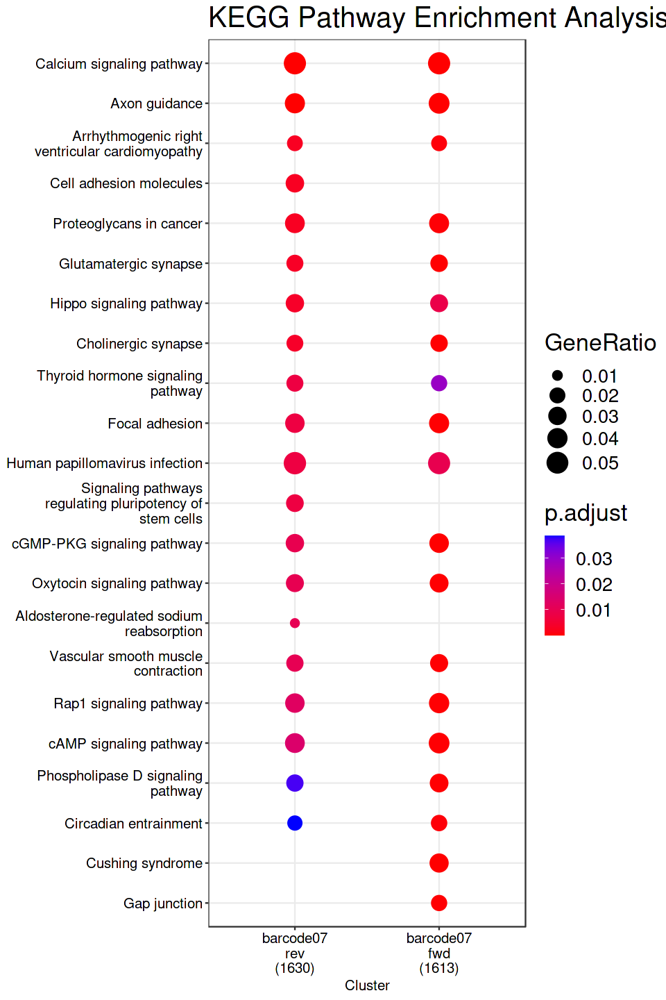

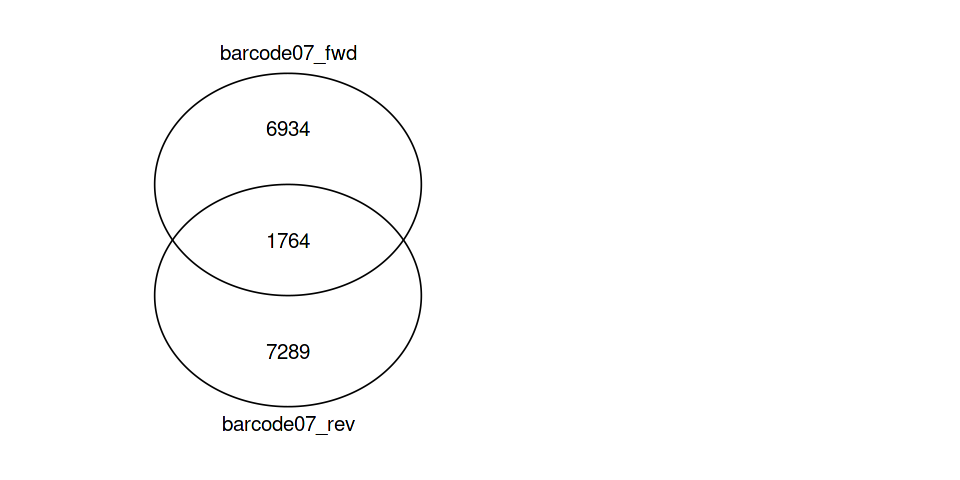

In [62]:
files <- list(
    "barcode07_rev" = "data/stranded/barcode07.breaks.rev.bed.gz",
    "barcode07_fwd" = "data/stranded/barcode07.breaks.fwd.bed.gz"
    
    )
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$barcode07_fwd
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$barcode07_rev
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=12, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## Barcode09

>> preparing start_site regions by gene... 2024-05-24 08:58:46 PM
>> preparing tag matrix...  2024-05-24 08:58:46 PM 
>> preparing start_site regions by gene... 2024-05-24 08:58:52 PM
>> preparing tag matrix...  2024-05-24 08:58:52 PM 
>> plotting figure...			 2024-05-24 08:58:59 PM 


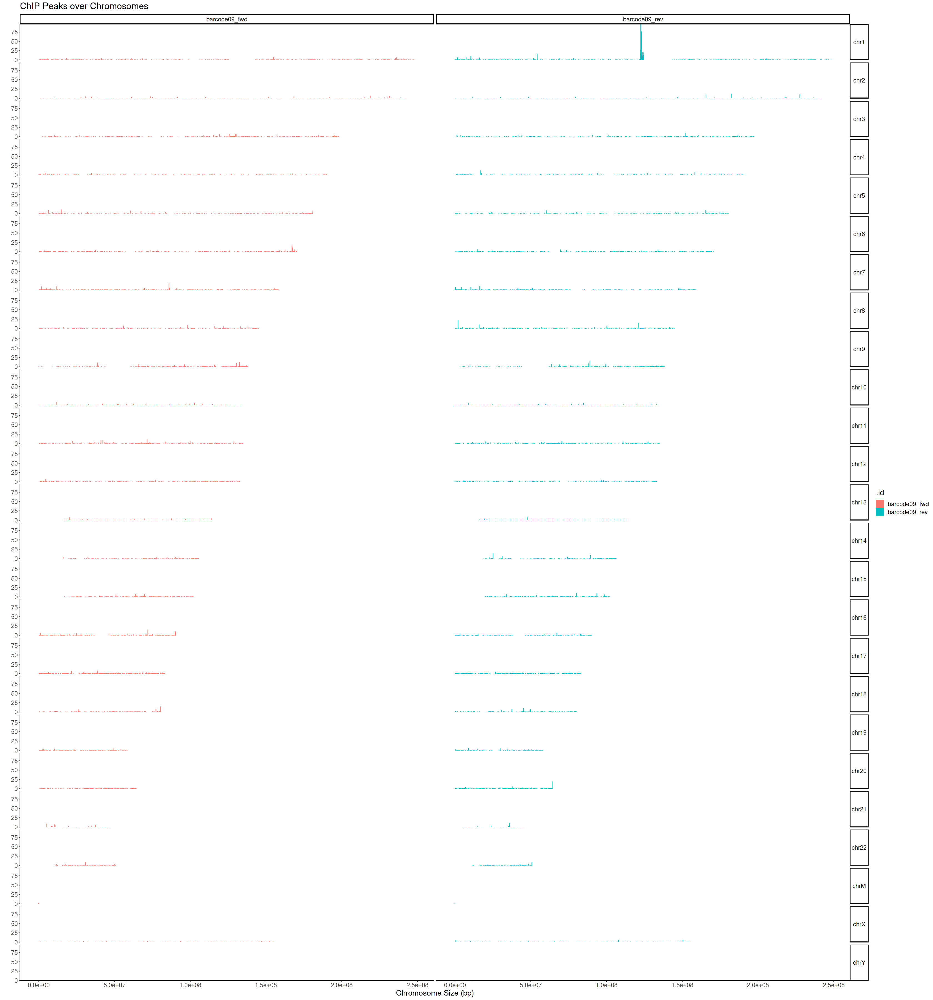

>> plotting figure...			 2024-05-24 08:59:00 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:59:02 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 08:59:05 PM 


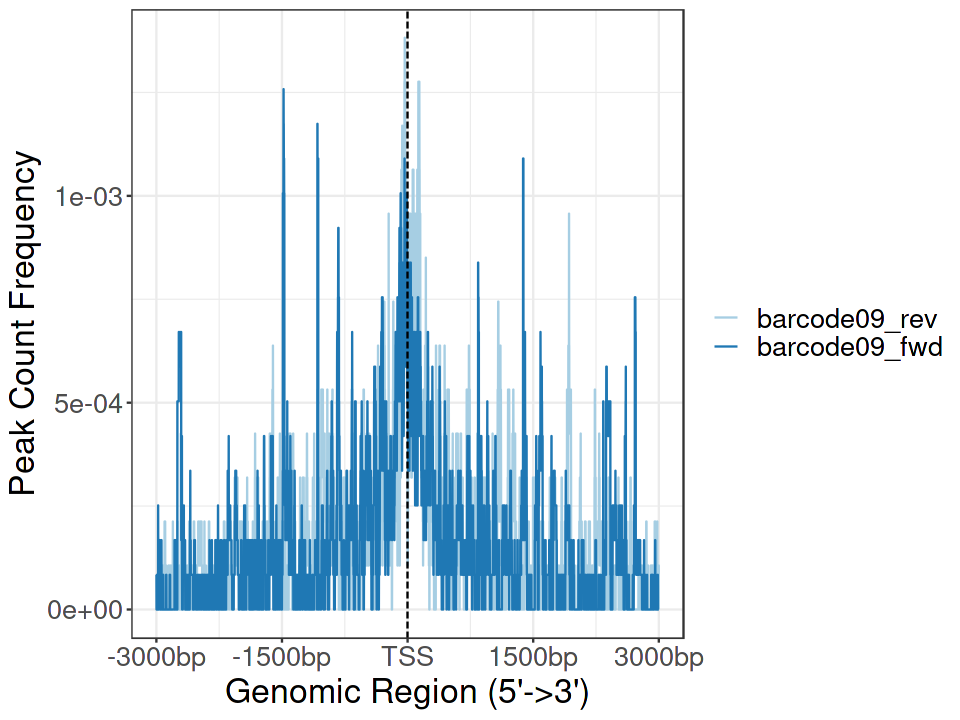

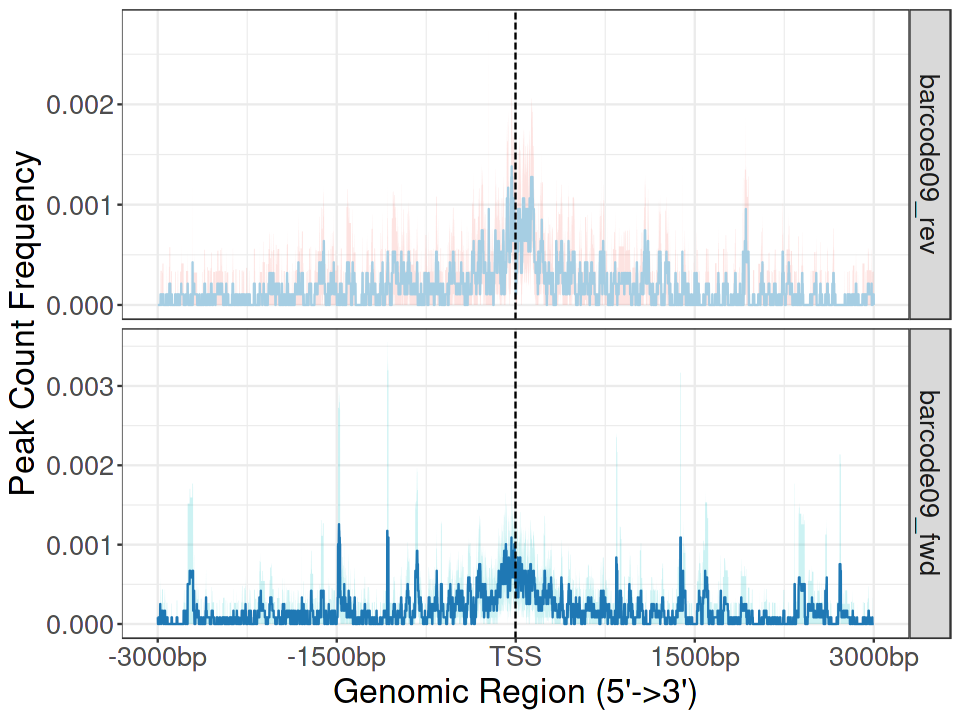

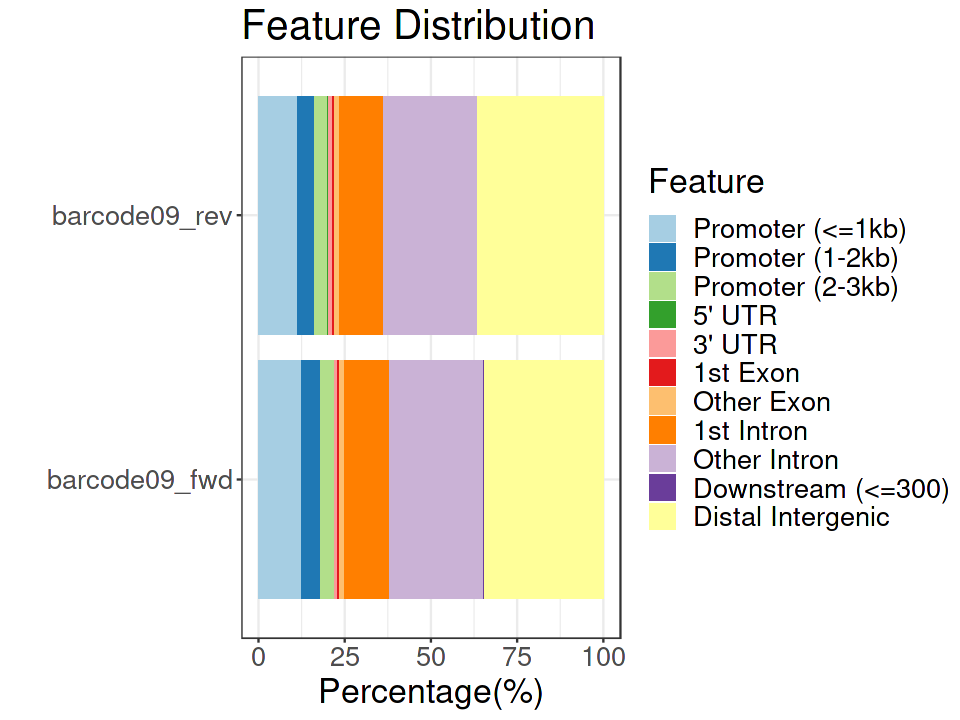

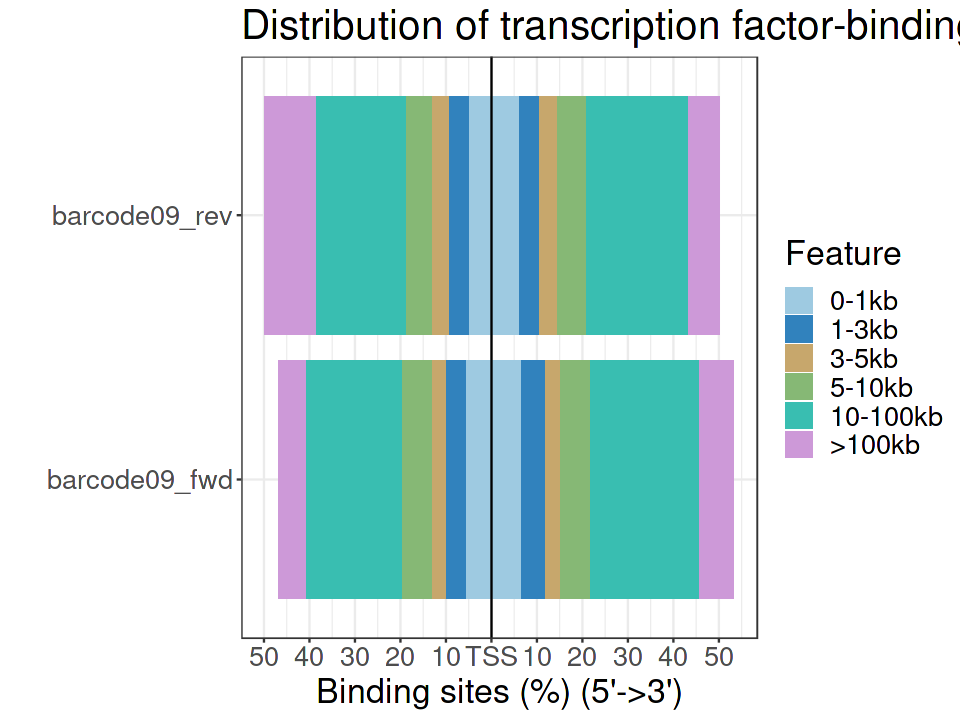

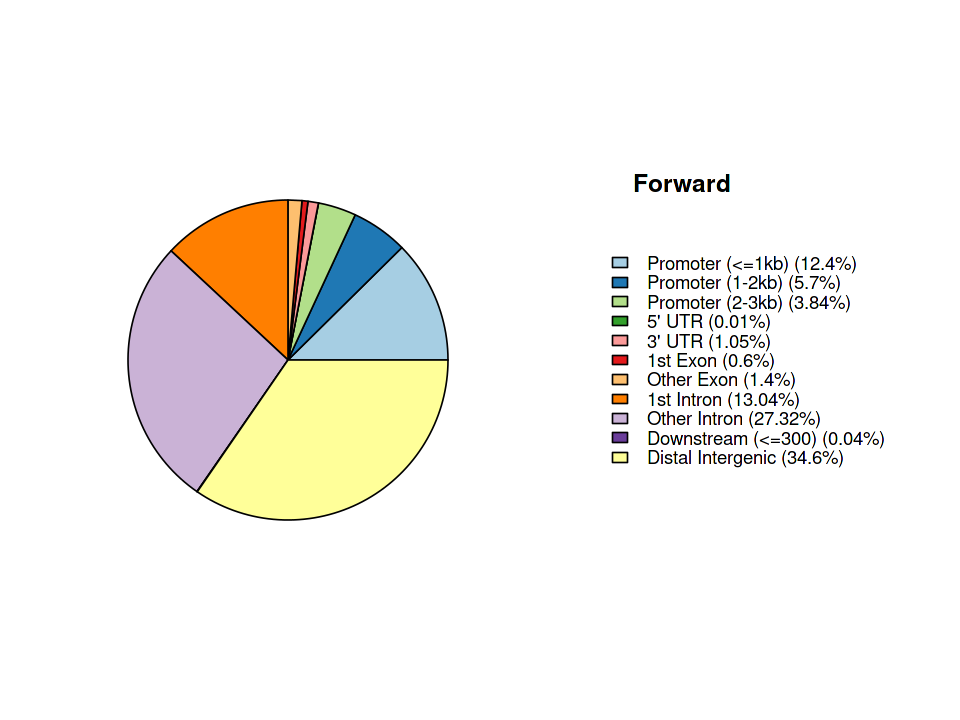

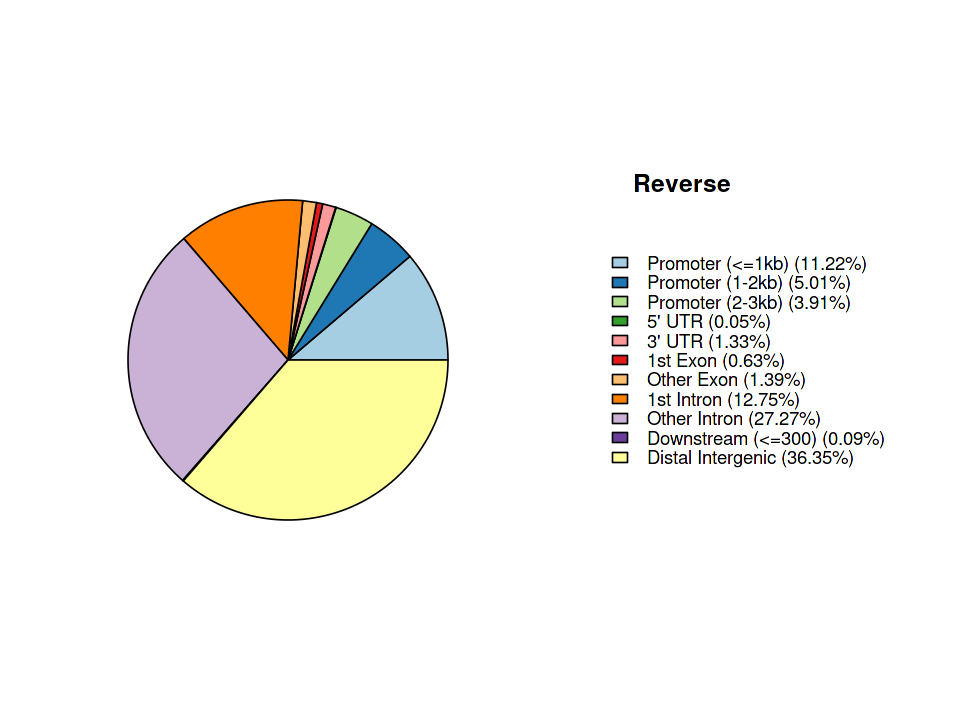

NULL

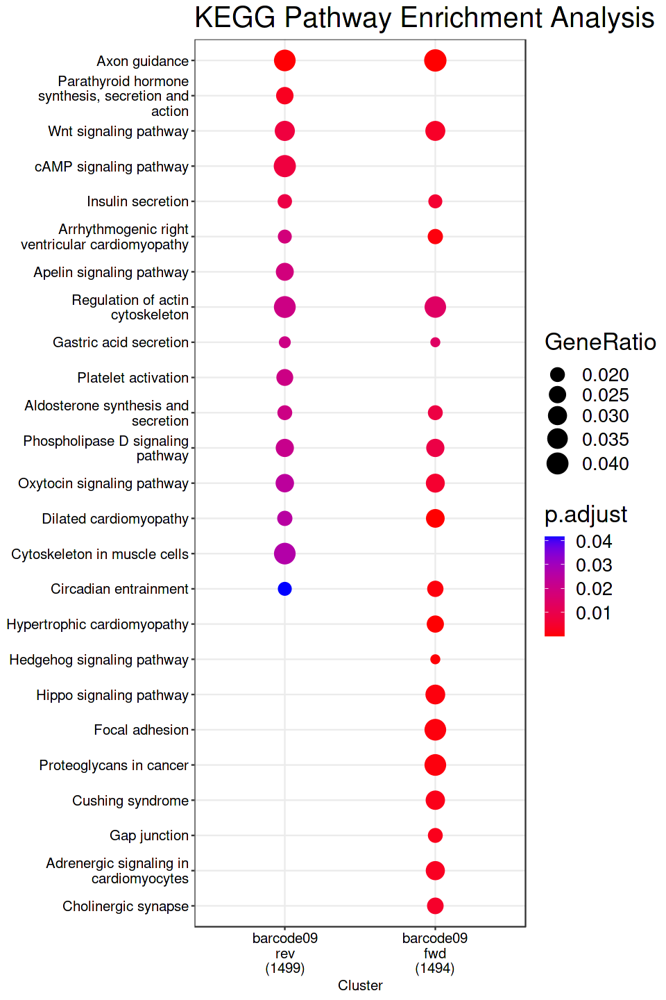

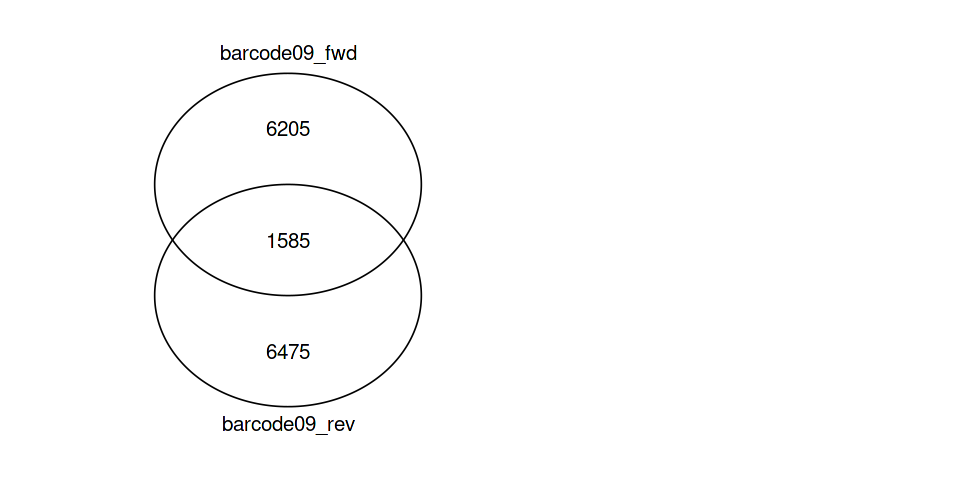

In [63]:
files <- list(
    "barcode09_rev" = "data/stranded/barcode09.breaks.rev.bed.gz",
    "barcode09_fwd" = "data/stranded/barcode09.breaks.fwd.bed.gz"
    )
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$barcode09_fwd
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$barcode09_rev
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=12, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

# Illumina

In [64]:
files <- list(
    "TK-2746-1_rev" = "data/stranded/TK-2746-1_S7.breaks.dedup.rev.bed.gz",
    "TK-2746-1_fwd" = "data/stranded/TK-2746-1_S7.breaks.dedup.fwd.bed.gz",
    "TK-2746-2_rev" = "data/stranded/TK-2746-2_S8.breaks.dedup.rev.bed.gz",
    "TK-2746-2_fwd" = "data/stranded/TK-2746-2_S8.breaks.dedup.fwd.bed.gz",
    "TK-2746-5_rev" = "data/stranded/TK-2746-5_S11.breaks.dedup.rev.bed.gz",
    "TK-2746-5_fwd" = "data/stranded/TK-2746-5_S11.breaks.dedup.fwd.bed.gz",
    "TK-2746-6_rev" = "data/stranded/TK-2746-6_S12.breaks.dedup.rev.bed.gz",
    "TK-2746-6_fwd" = "data/stranded/TK-2746-6_S12.breaks.dedup.fwd.bed.gz",
    "TK-2746-7_rev" = "data/stranded/TK-2746-7_S13.breaks.dedup.rev.bed.gz",
    "TK-2746-7_fwd" = "data/stranded/TK-2746-7_S13.breaks.dedup.fwd.bed.gz",
    "TK-2746-8_rev" = "data/stranded/TK-2746-8_S14.breaks.dedup.rev.bed.gz",
    "TK-2746-8_fwd" = "data/stranded/TK-2746-8_S14.breaks.dedup.fwd.bed.gz"
)

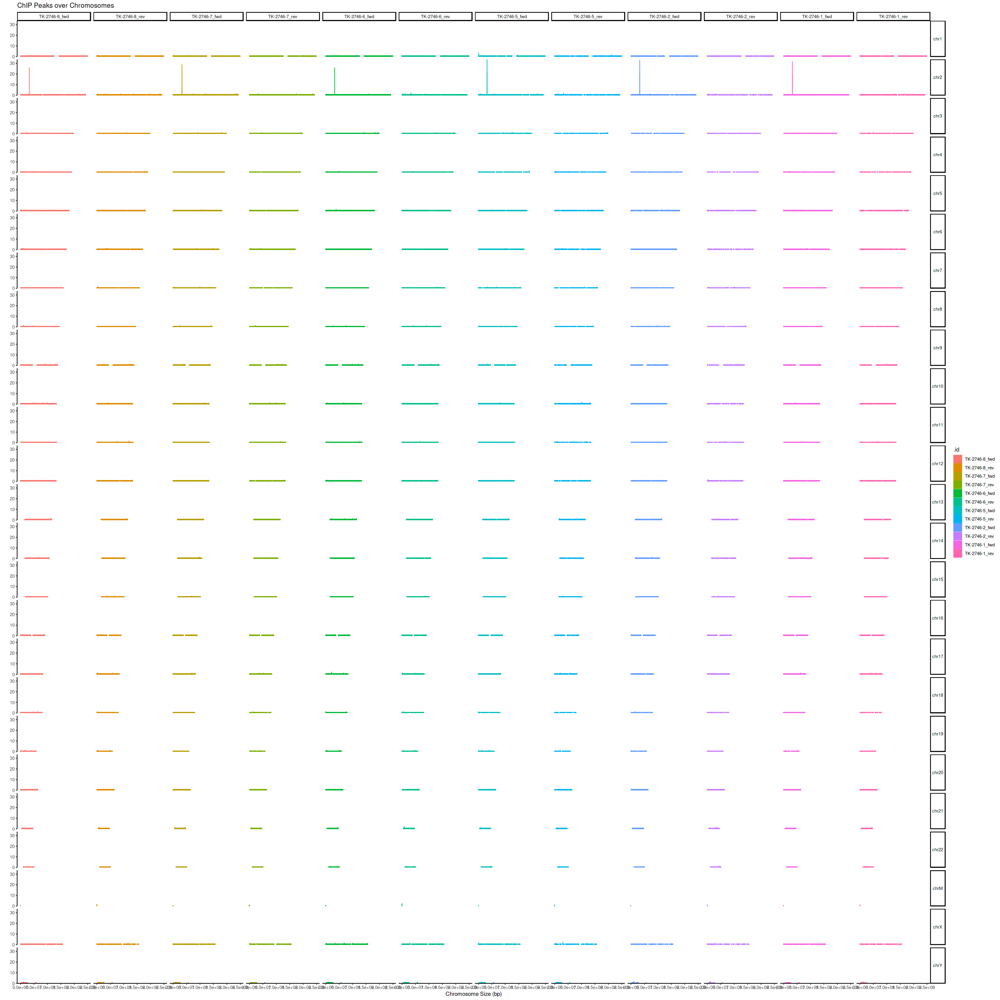

In [65]:
options(repr.plot.height=28, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id)

## TK-2746-1

>> preparing start_site regions by gene... 2024-05-24 09:06:13 PM
>> preparing tag matrix...  2024-05-24 09:06:13 PM 
>> preparing start_site regions by gene... 2024-05-24 09:06:20 PM
>> preparing tag matrix...  2024-05-24 09:06:20 PM 
>> plotting figure...			 2024-05-24 09:06:27 PM 


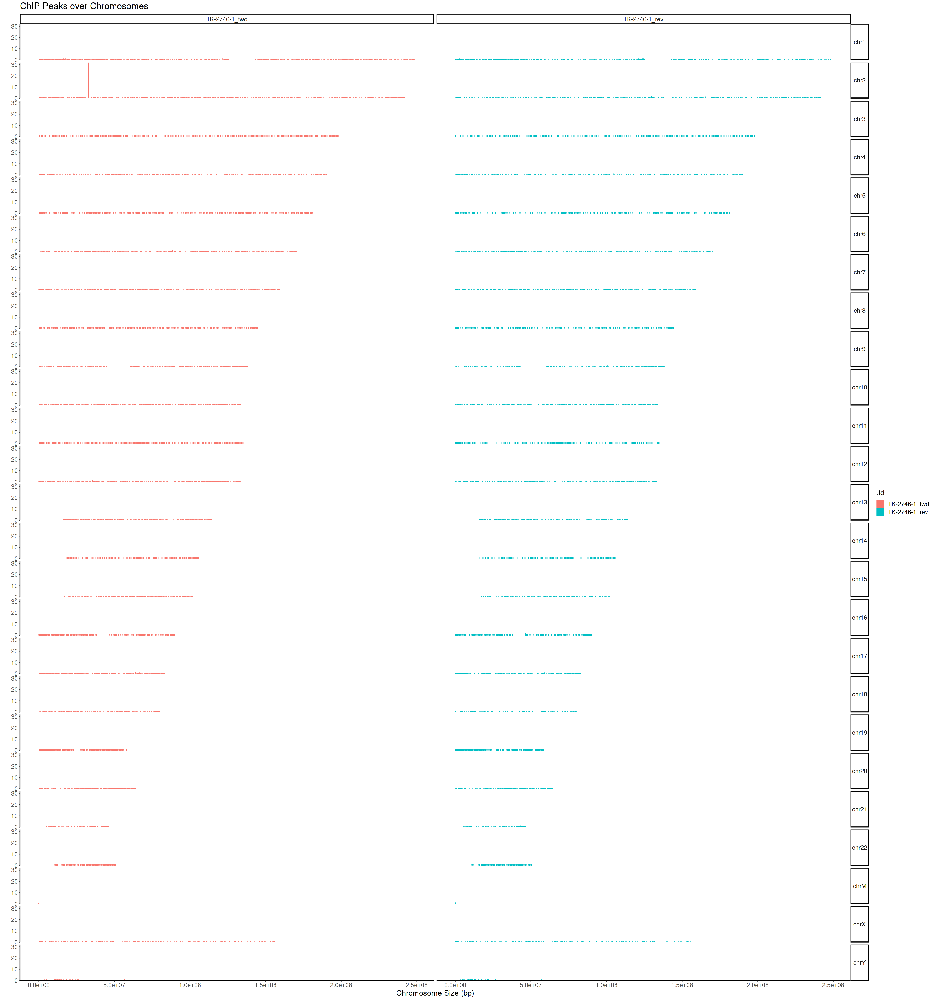

>> plotting figure...			 2024-05-24 09:06:28 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:06:30 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:06:34 PM 


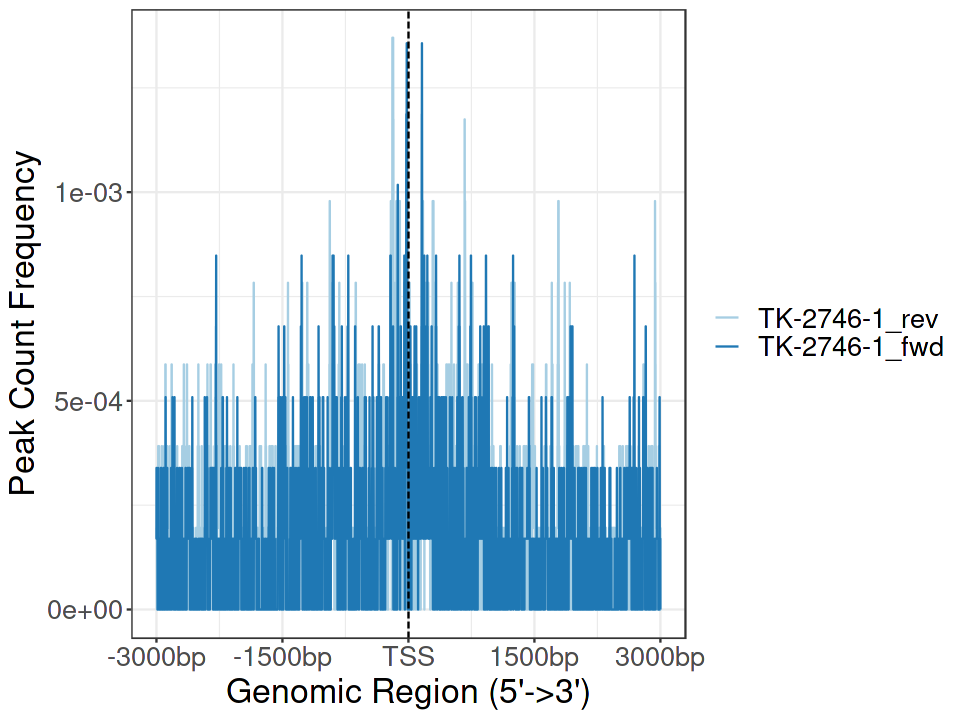

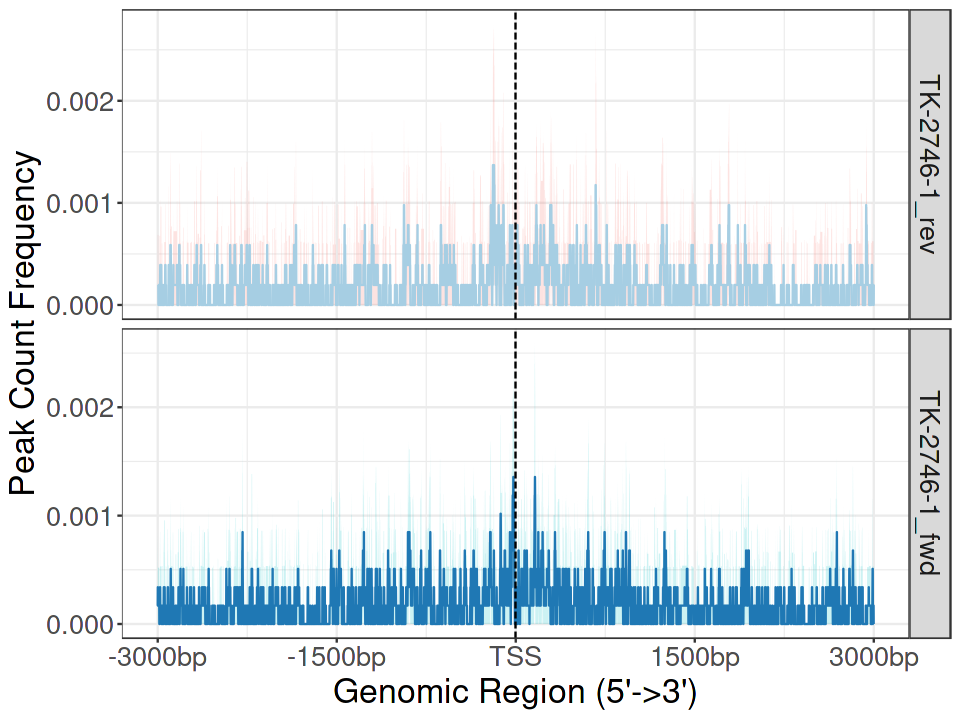

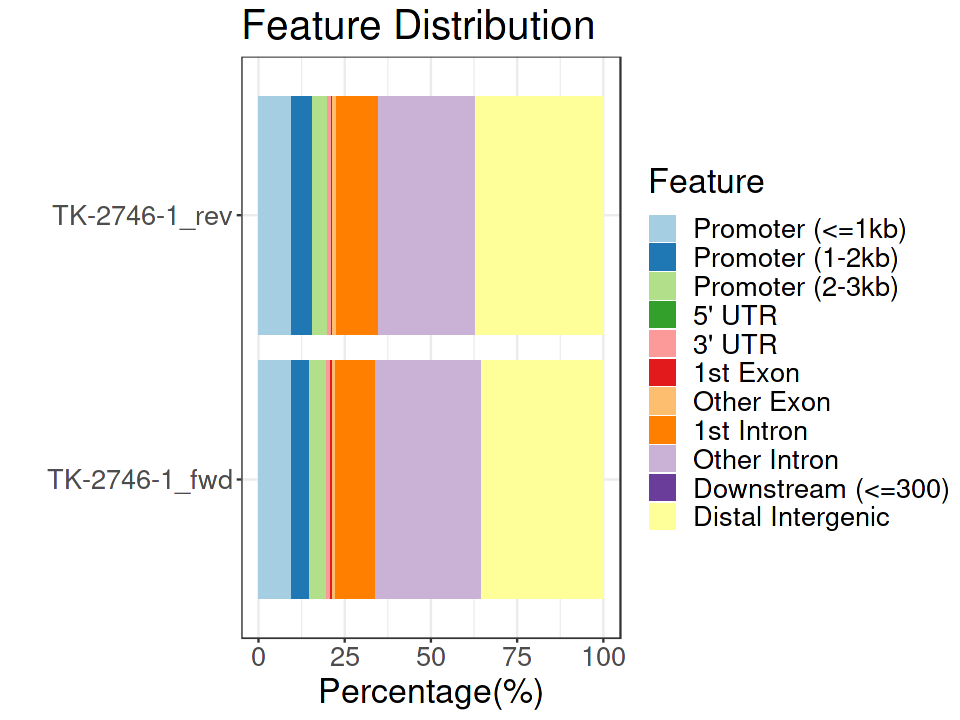

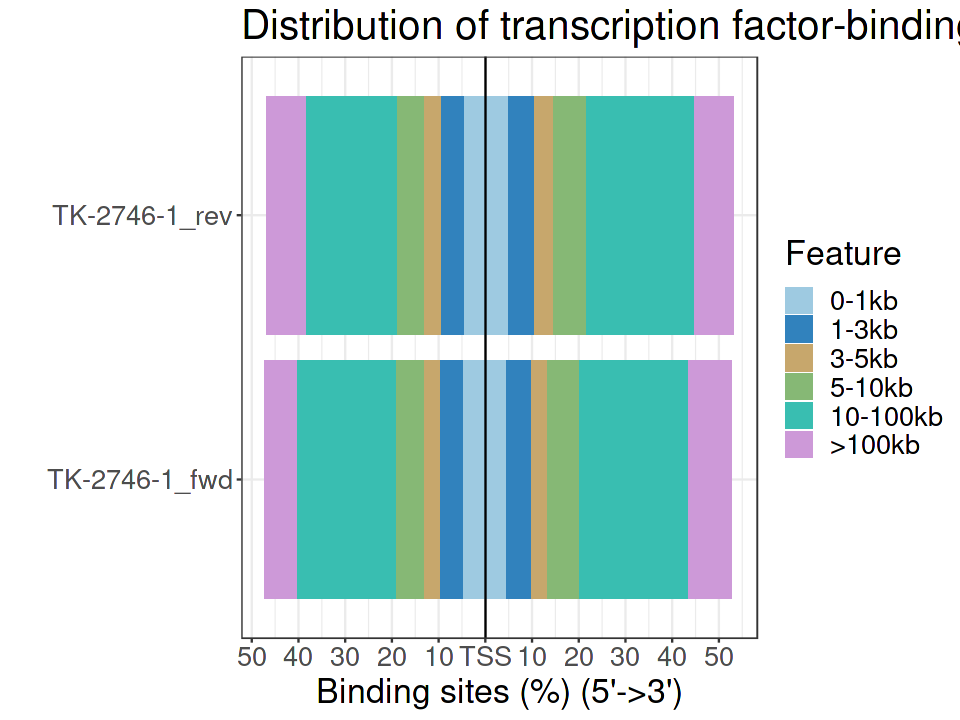

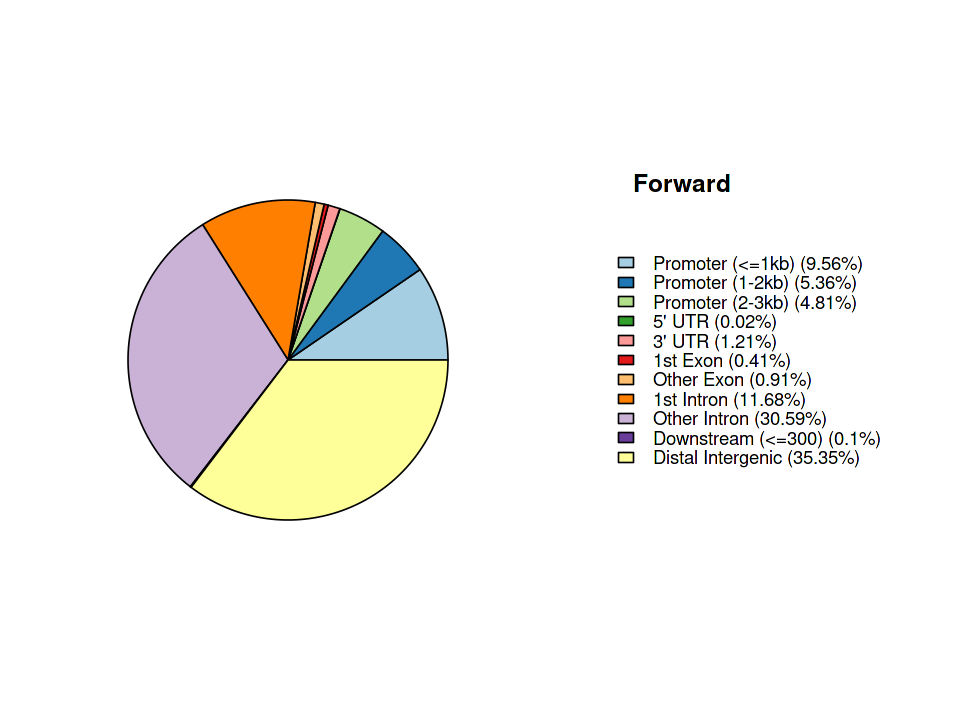

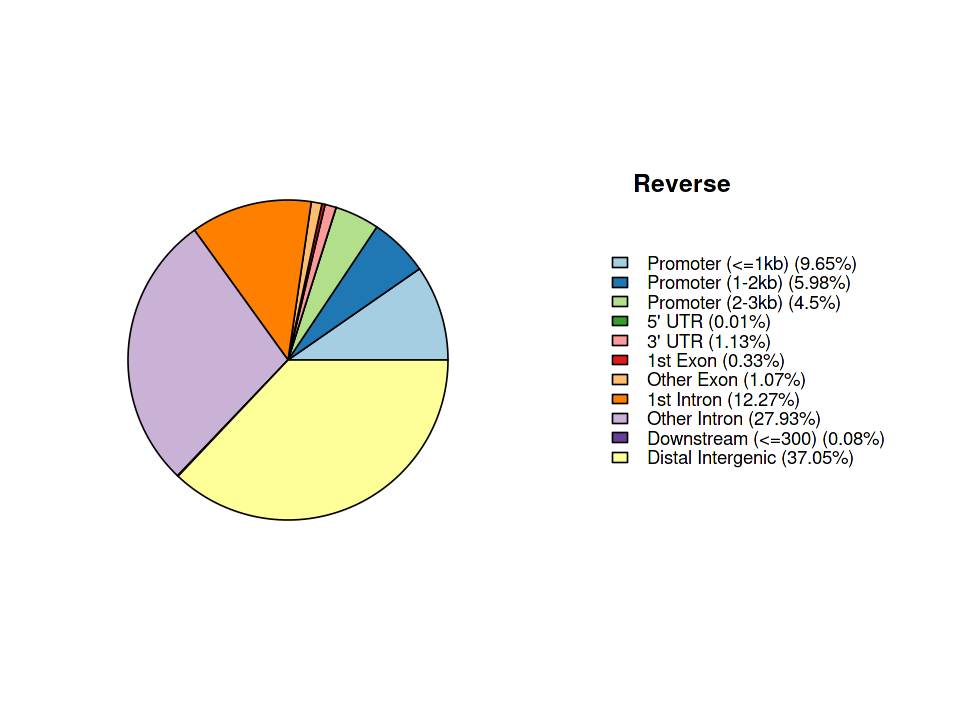

NULL

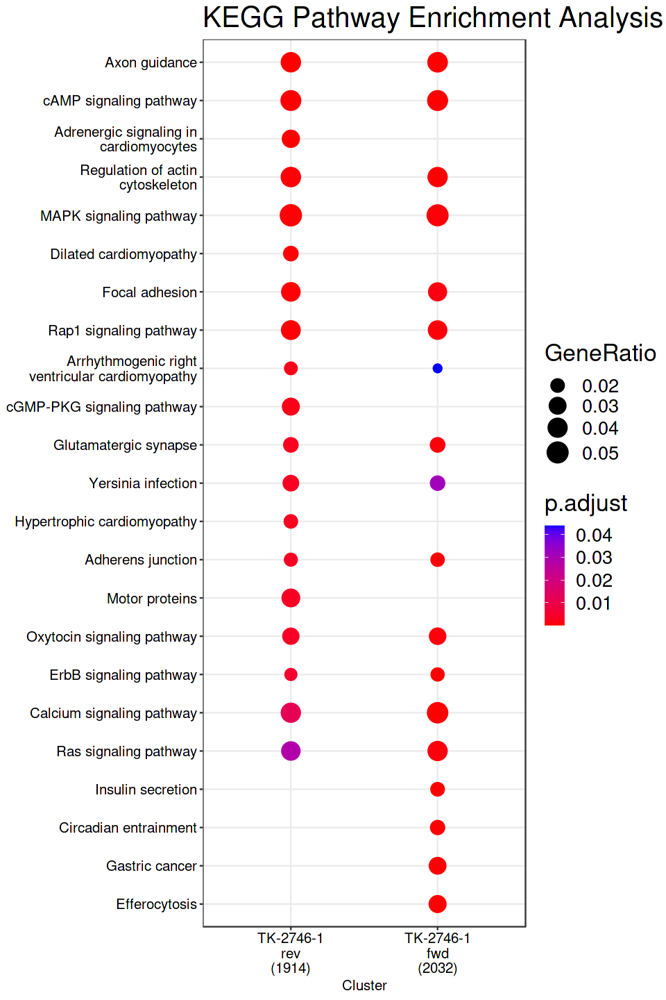

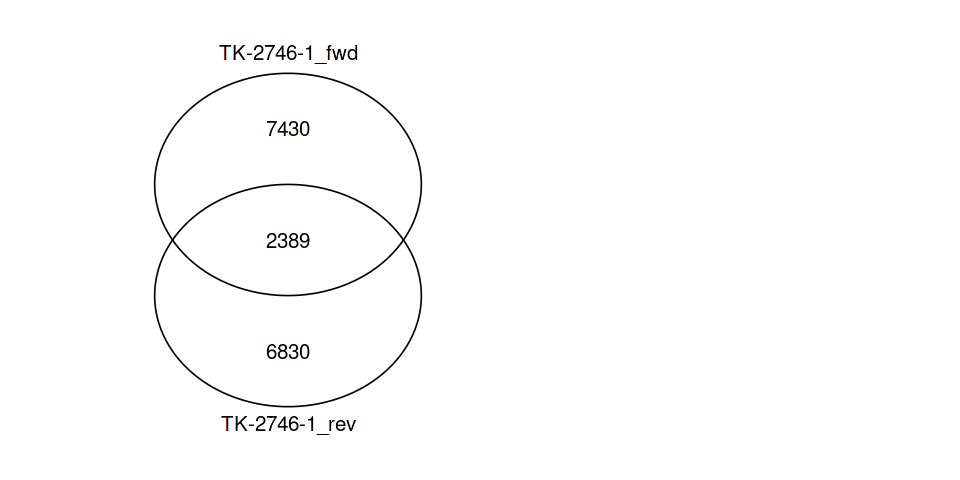

In [69]:
files <- list(
    "TK-2746-1_rev" = "data/stranded/TK-2746-1_S7.breaks.dedup.rev.bed.gz",
    "TK-2746-1_fwd" = "data/stranded/TK-2746-1_S7.breaks.dedup.fwd.bed.gz"
)
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$`TK-2746-1_fwd`
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$`TK-2746-1_rev`
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=12, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## TK-2746-2

>> preparing start_site regions by gene... 2024-05-24 09:08:05 PM
>> preparing tag matrix...  2024-05-24 09:08:05 PM 
>> preparing start_site regions by gene... 2024-05-24 09:08:12 PM
>> preparing tag matrix...  2024-05-24 09:08:12 PM 
>> plotting figure...			 2024-05-24 09:08:19 PM 


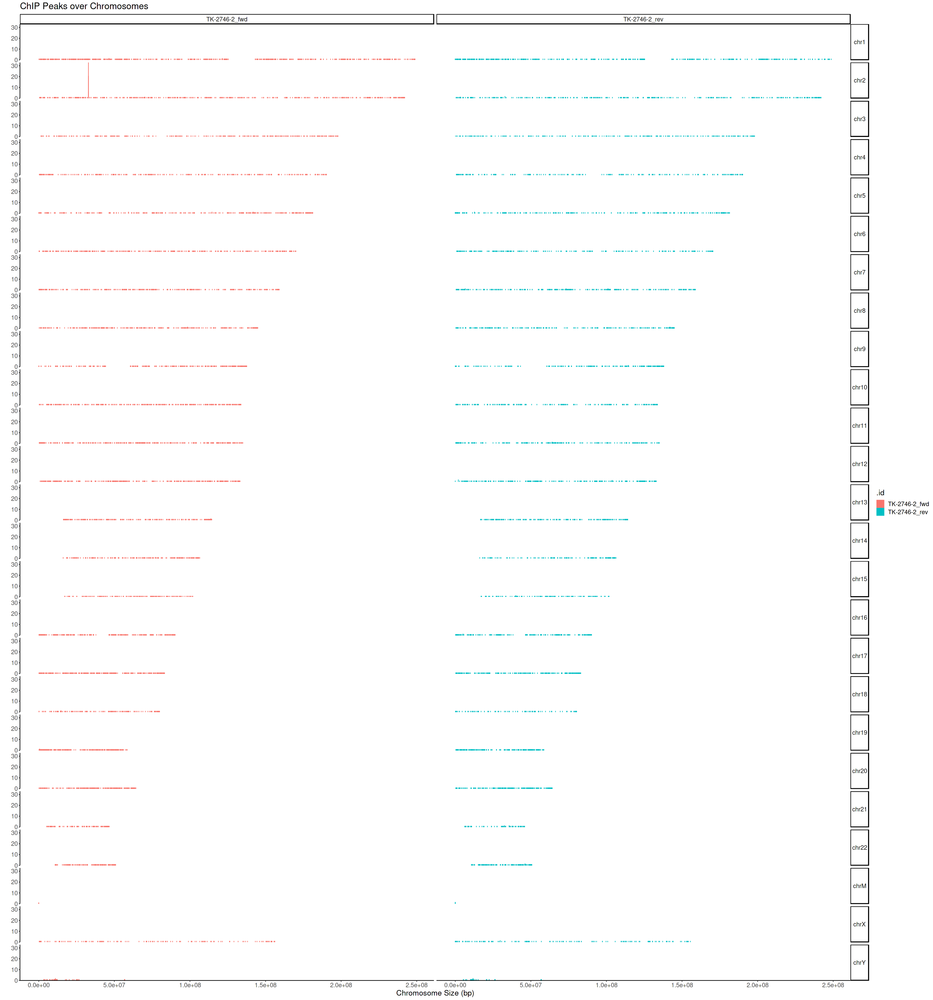

>> plotting figure...			 2024-05-24 09:08:20 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:08:22 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:08:25 PM 


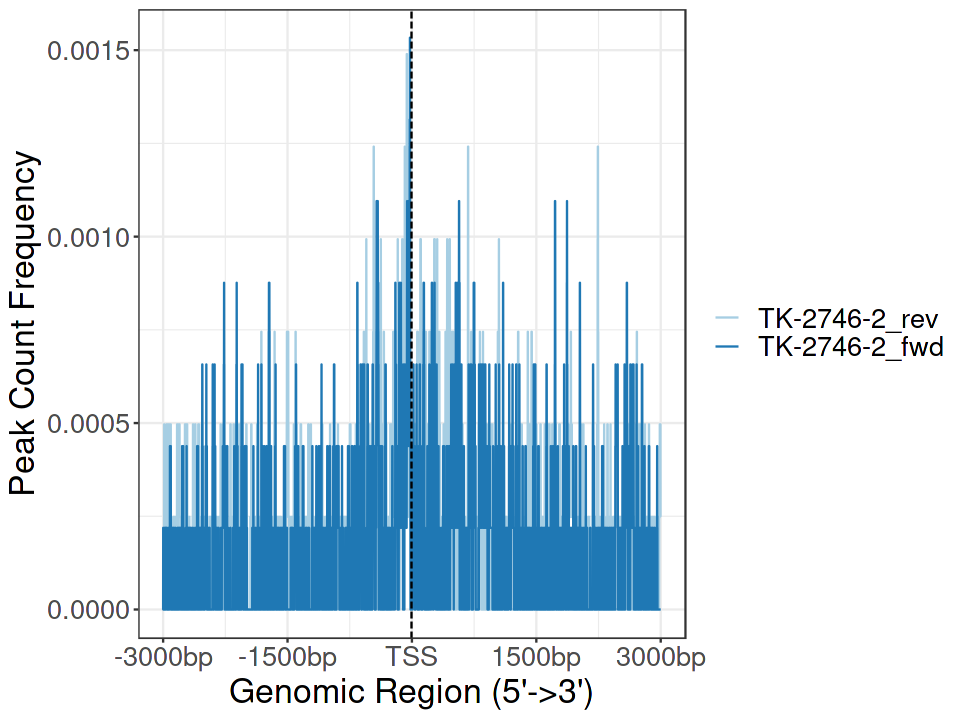

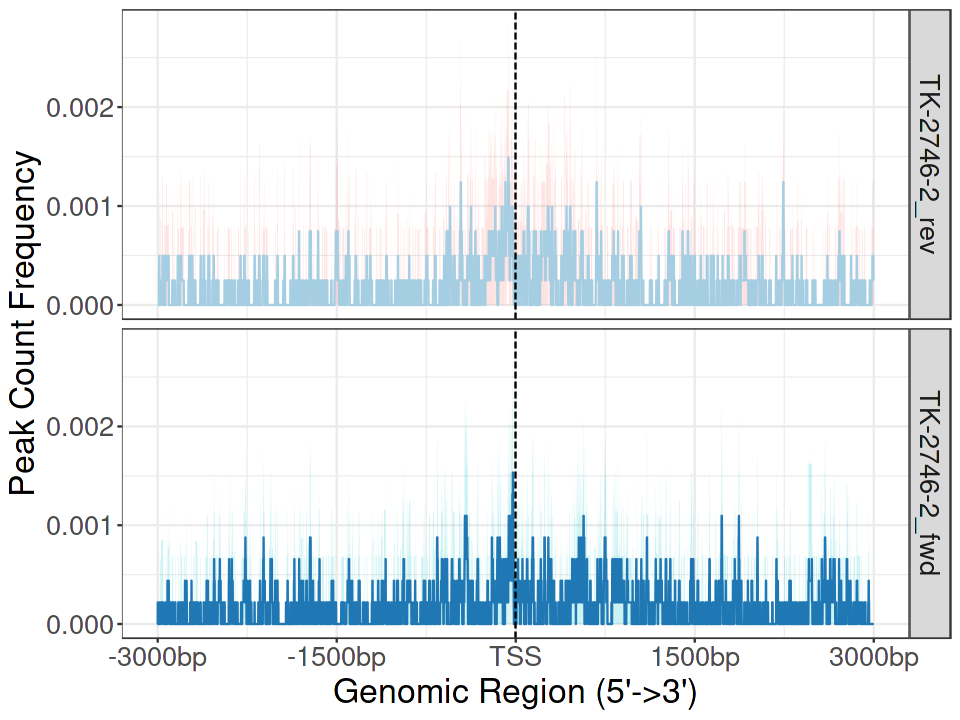

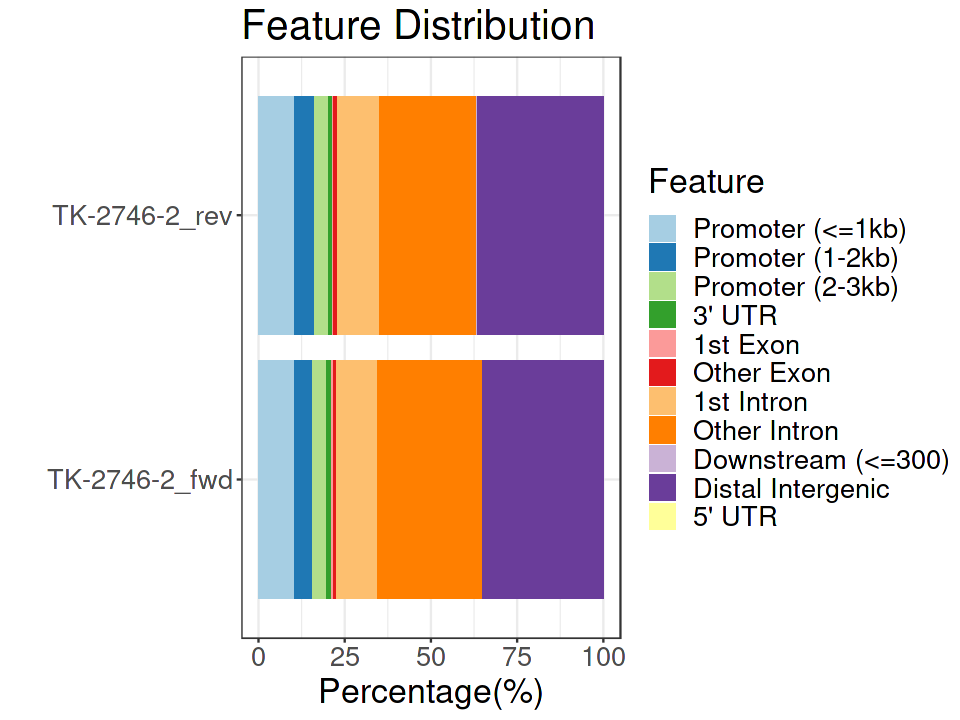

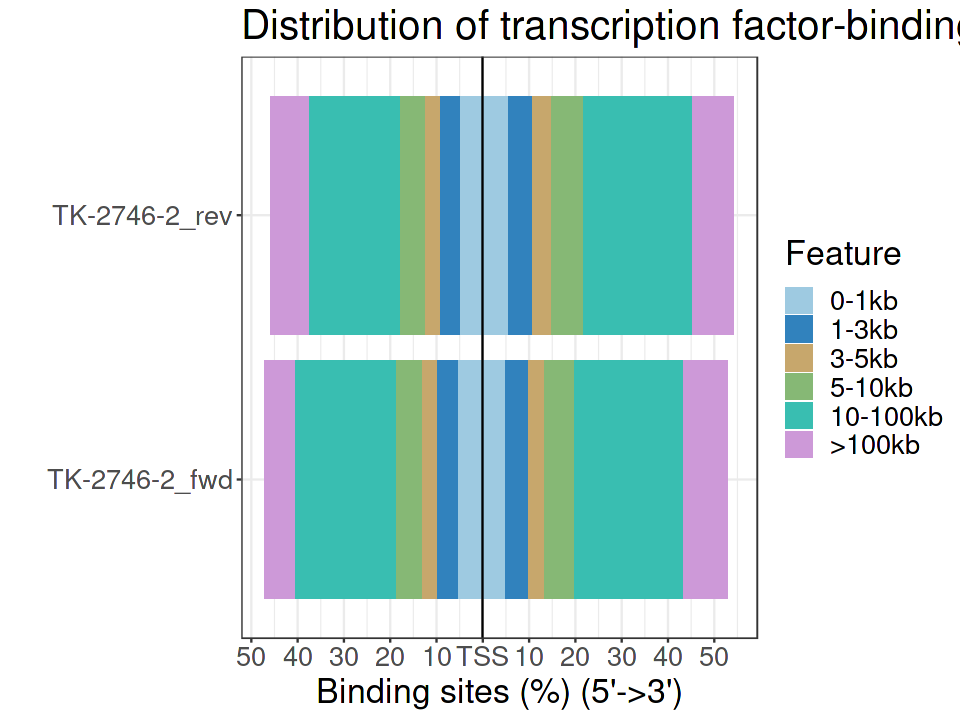

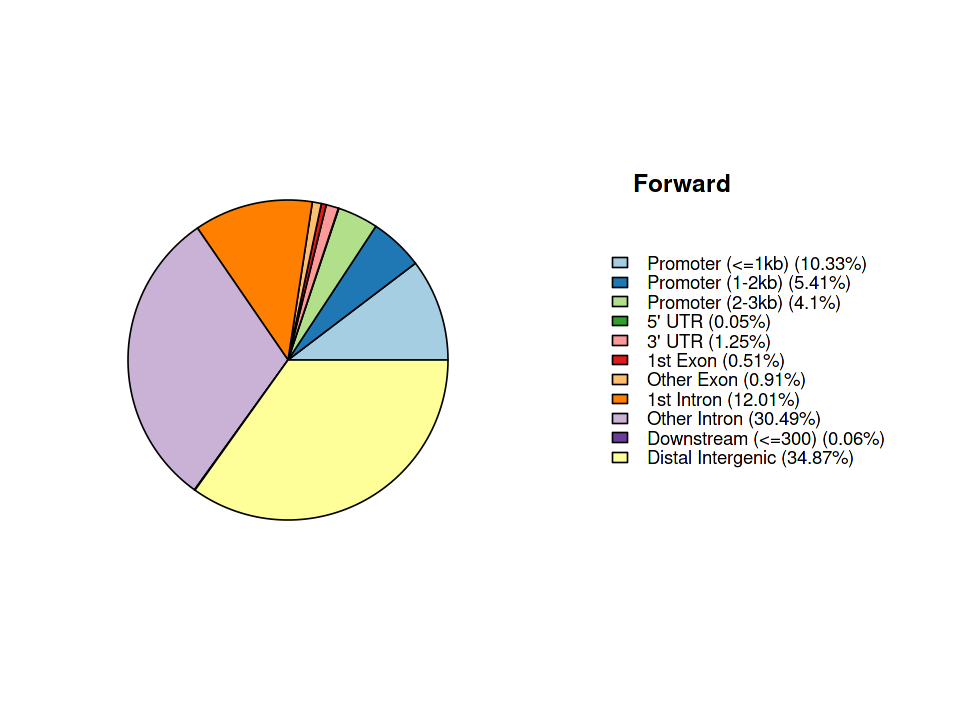

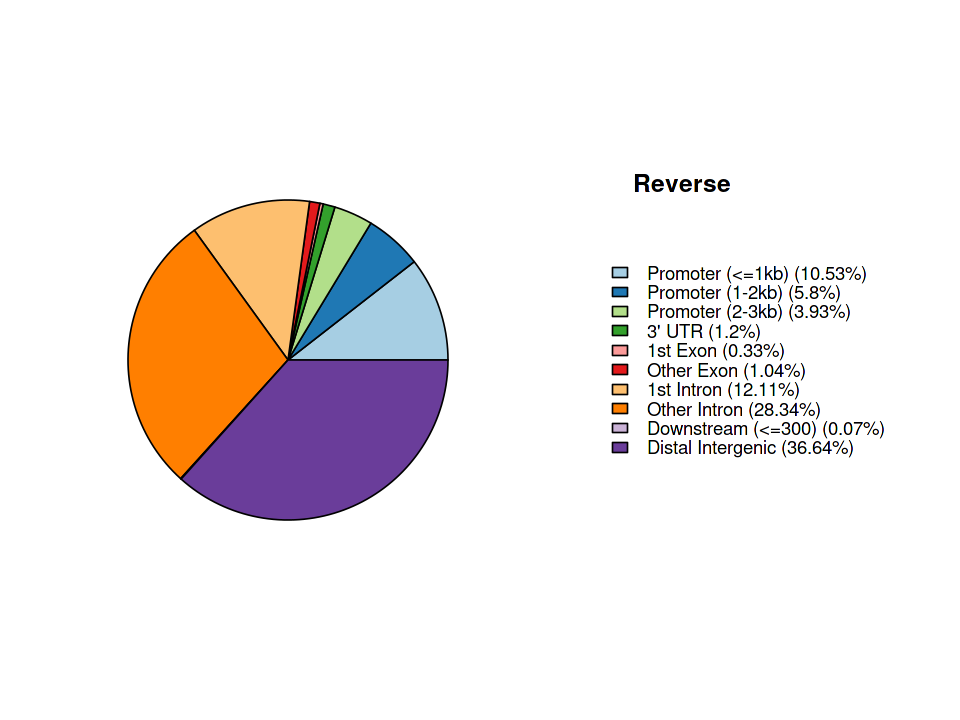

NULL

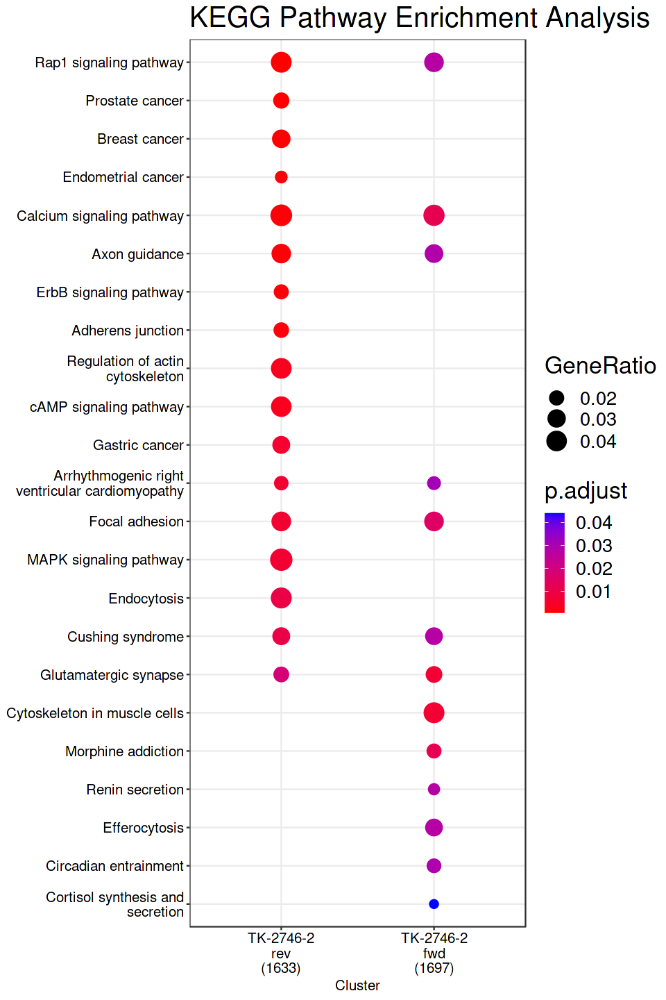

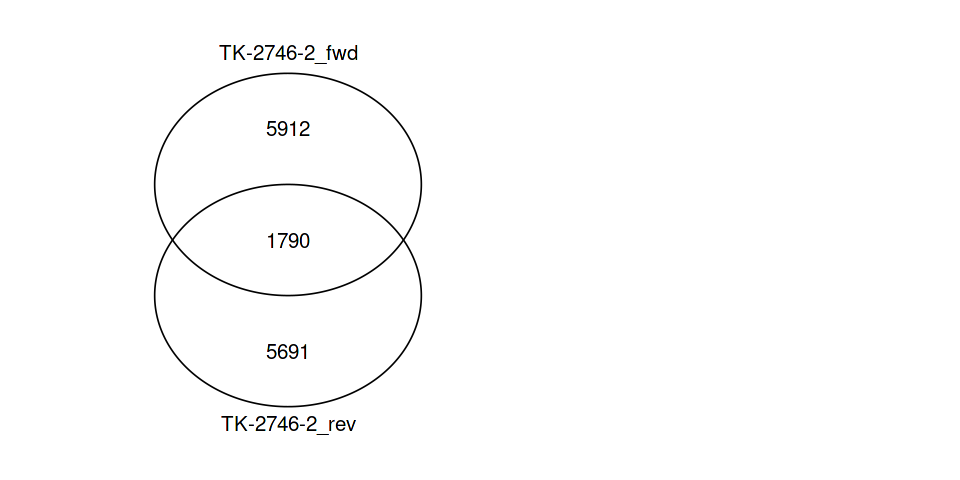

In [70]:
files <- list(
    "TK-2746-2_rev" = "data/stranded/TK-2746-2_S8.breaks.dedup.rev.bed.gz",
    "TK-2746-2_fwd" = "data/stranded/TK-2746-2_S8.breaks.dedup.fwd.bed.gz"
)
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$`TK-2746-2_fwd`
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$`TK-2746-2_rev`
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=12, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## TK-2746-5

>> preparing start_site regions by gene... 2024-05-24 09:08:57 PM
>> preparing tag matrix...  2024-05-24 09:08:57 PM 
>> preparing start_site regions by gene... 2024-05-24 09:09:03 PM
>> preparing tag matrix...  2024-05-24 09:09:03 PM 
>> plotting figure...			 2024-05-24 09:09:09 PM 


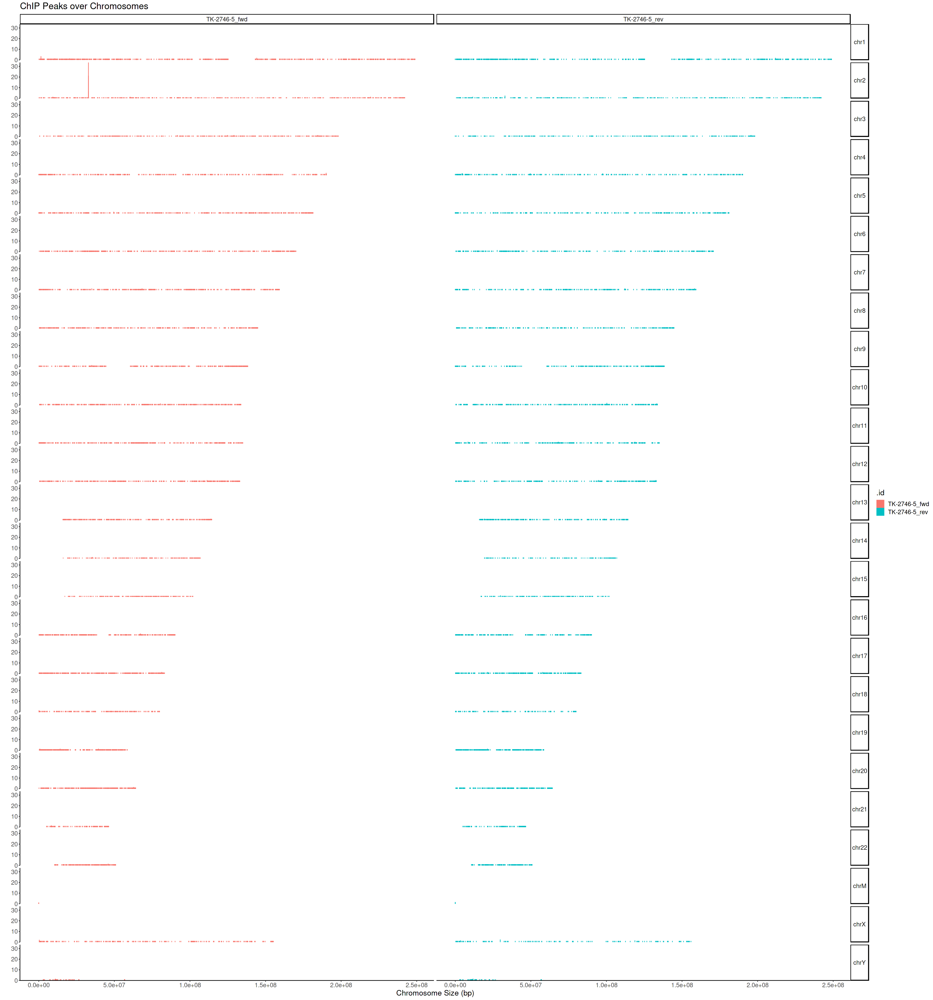

>> plotting figure...			 2024-05-24 09:09:10 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:09:12 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:09:17 PM 


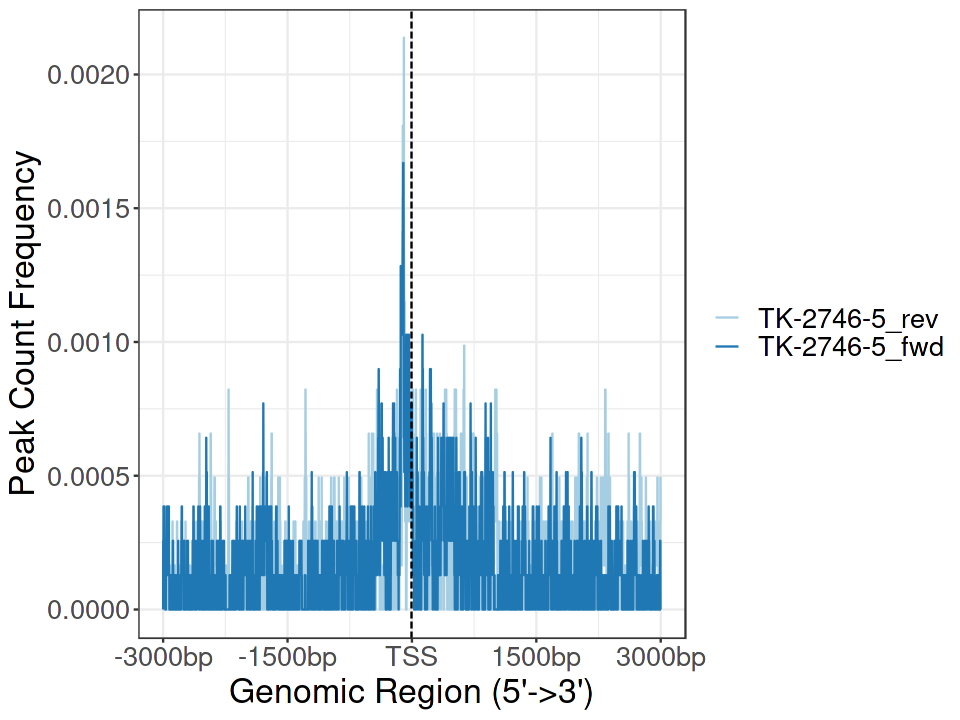

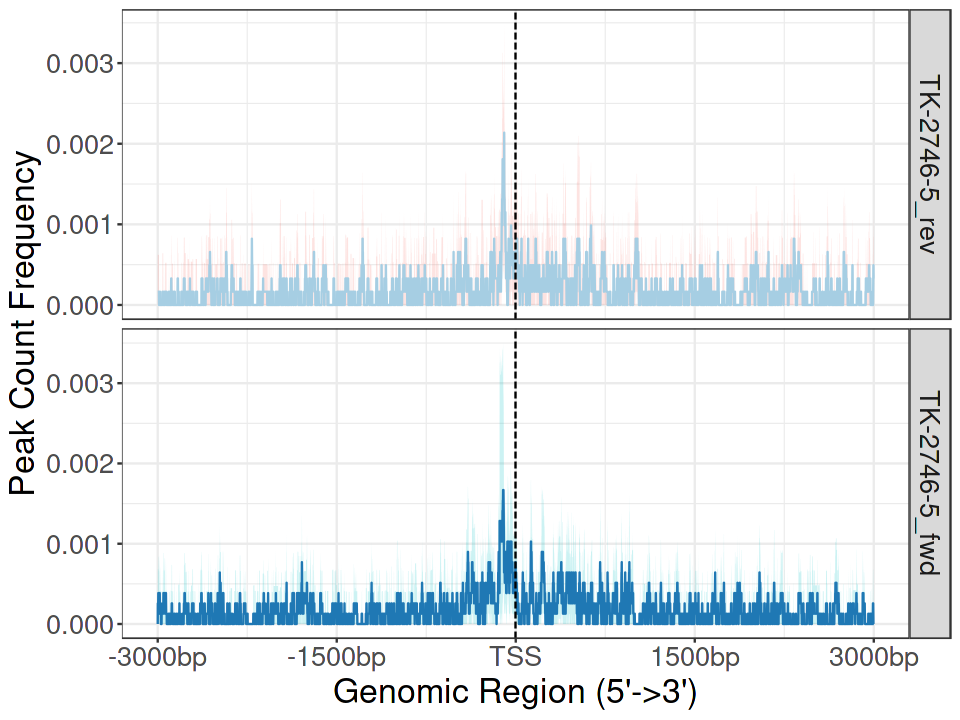

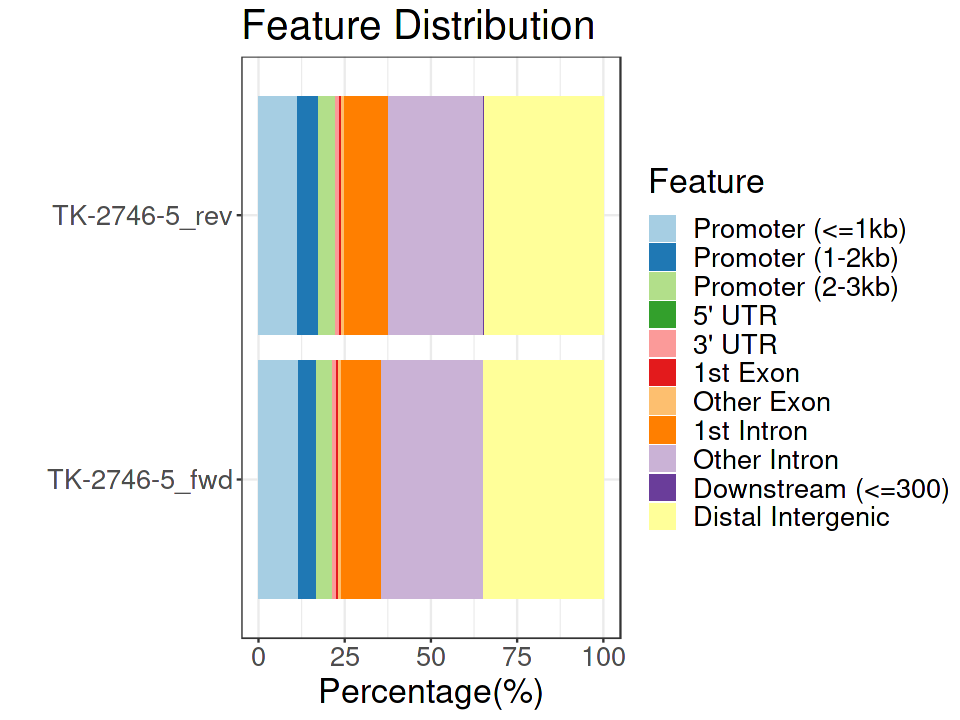

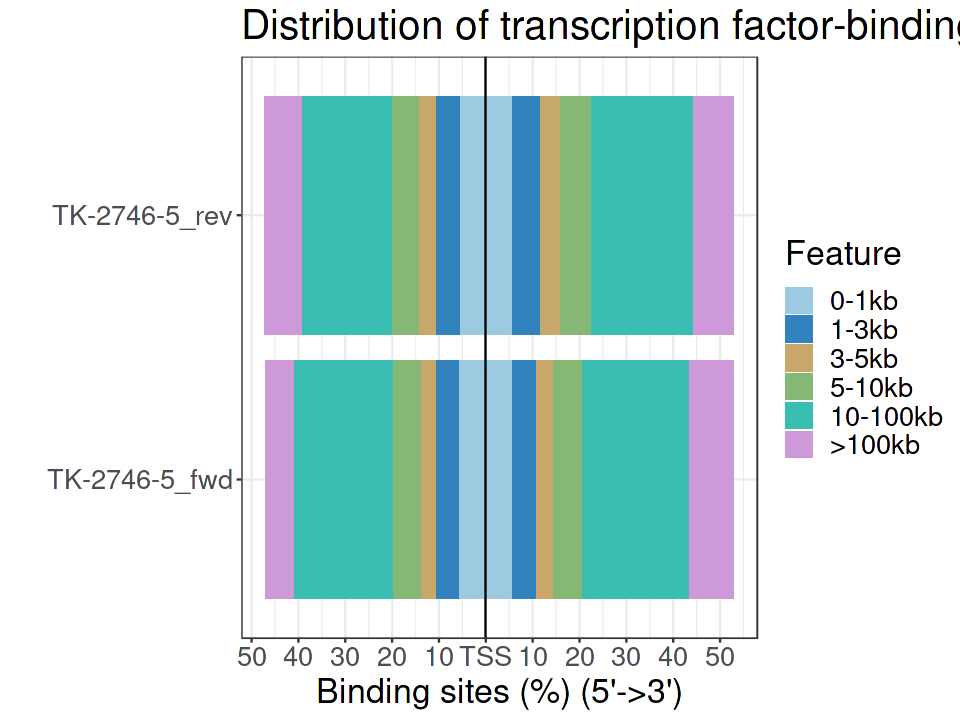

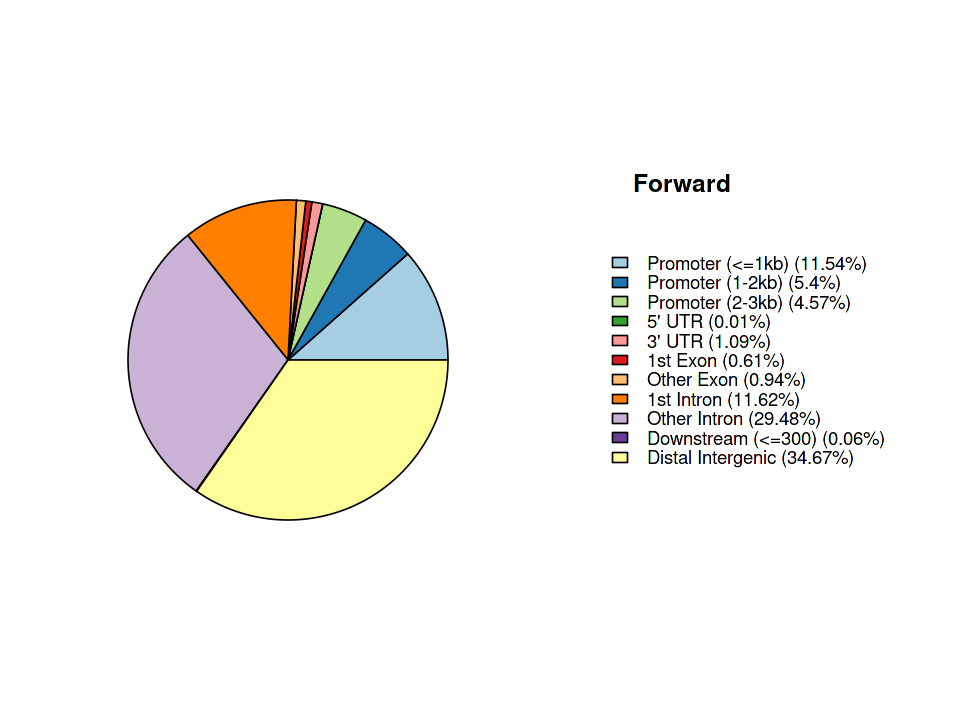

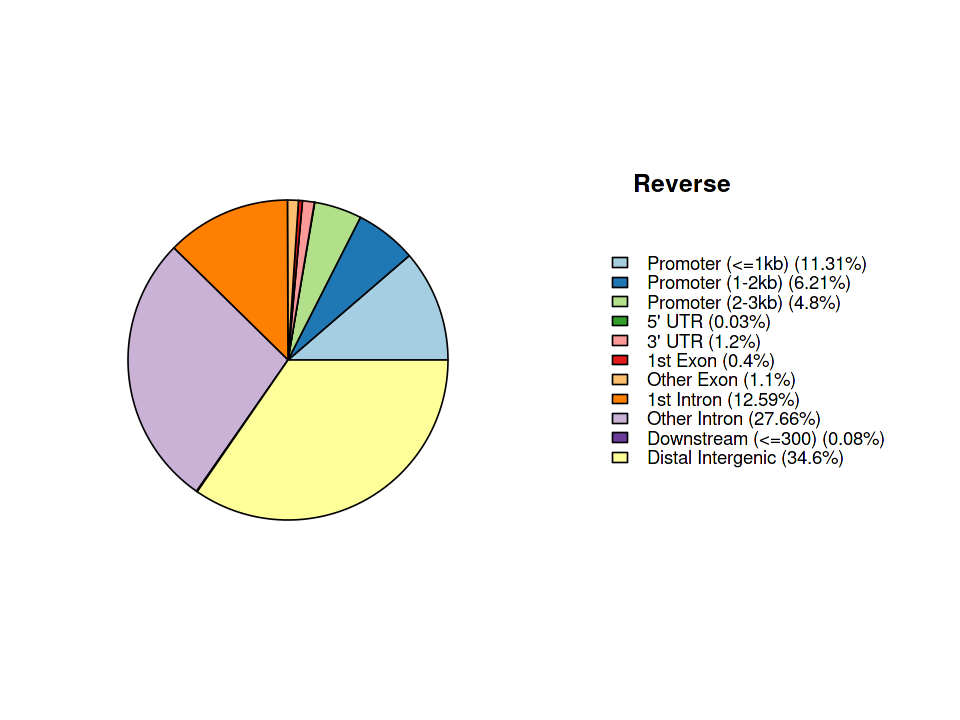

NULL

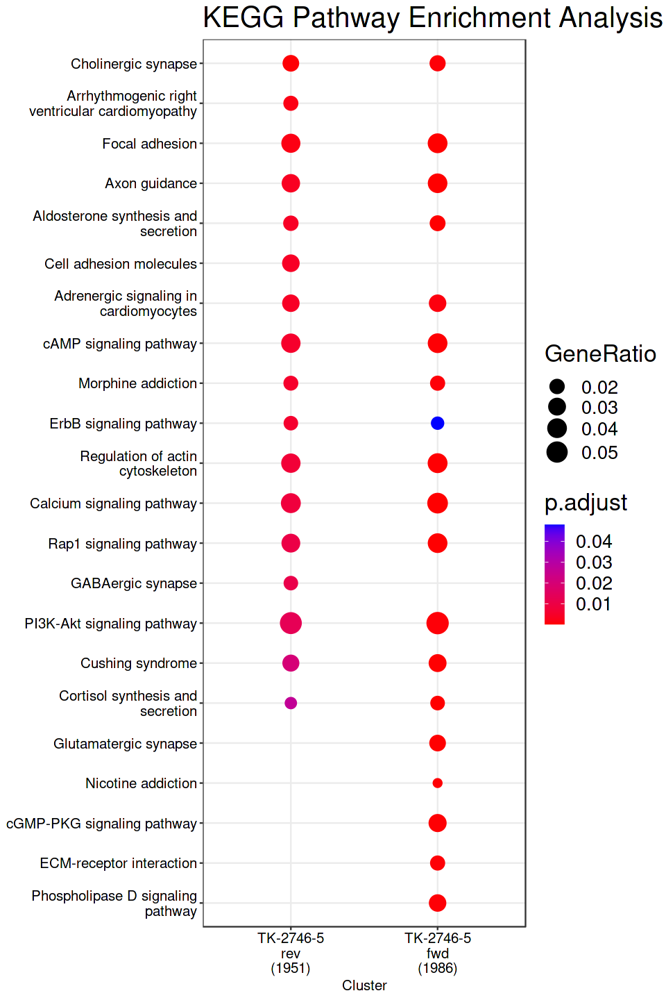

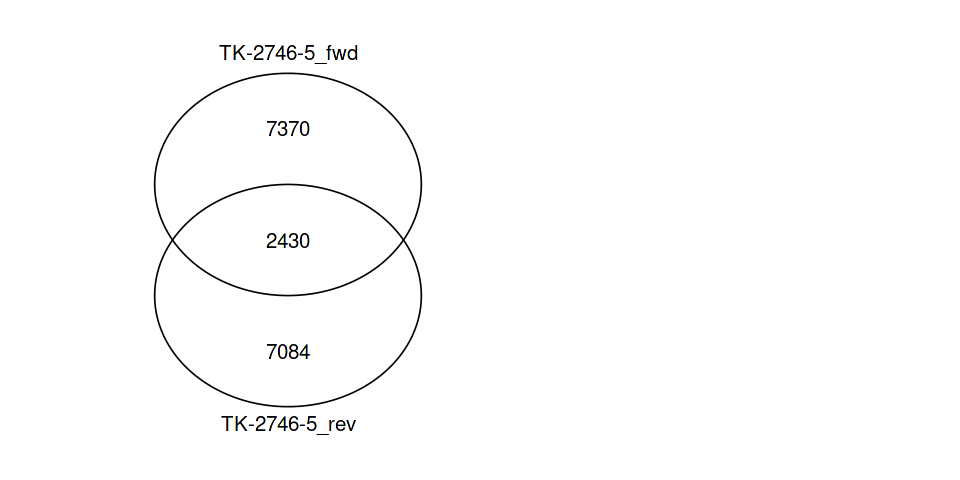

In [71]:
files <- list(
    "TK-2746-5_rev" = "data/stranded/TK-2746-5_S11.breaks.dedup.rev.bed.gz",
    "TK-2746-5_fwd" = "data/stranded/TK-2746-5_S11.breaks.dedup.fwd.bed.gz"
)
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$`TK-2746-5_fwd`
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$`TK-2746-5_rev`
)
title("Reverse", line = -8, adj = 0.2)


genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=12, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## TK-2746-6

>> preparing start_site regions by gene... 2024-05-24 09:10:03 PM
>> preparing tag matrix...  2024-05-24 09:10:03 PM 
>> preparing start_site regions by gene... 2024-05-24 09:10:10 PM
>> preparing tag matrix...  2024-05-24 09:10:10 PM 
>> plotting figure...			 2024-05-24 09:10:17 PM 


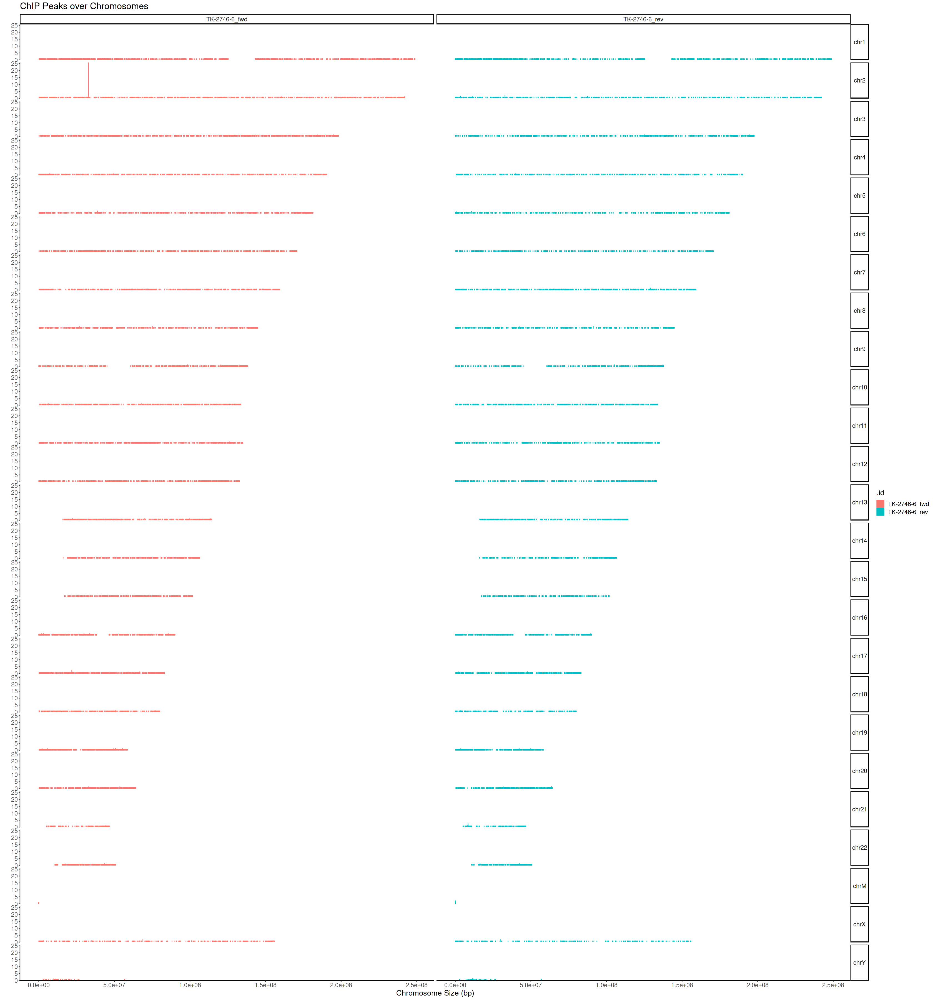

>> plotting figure...			 2024-05-24 09:10:18 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:10:24 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:10:40 PM 


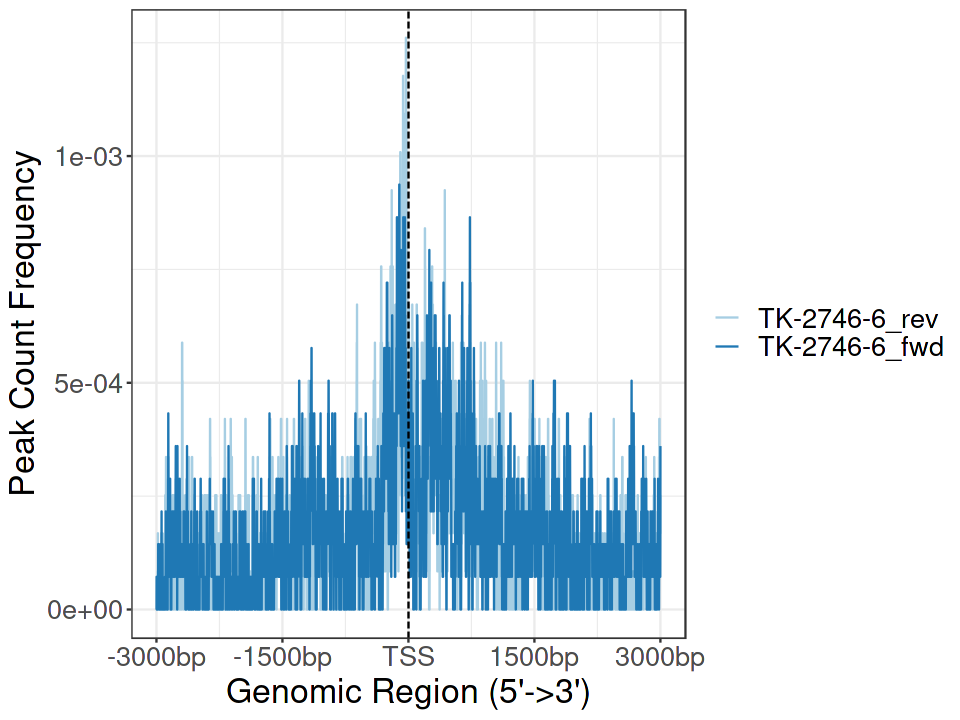

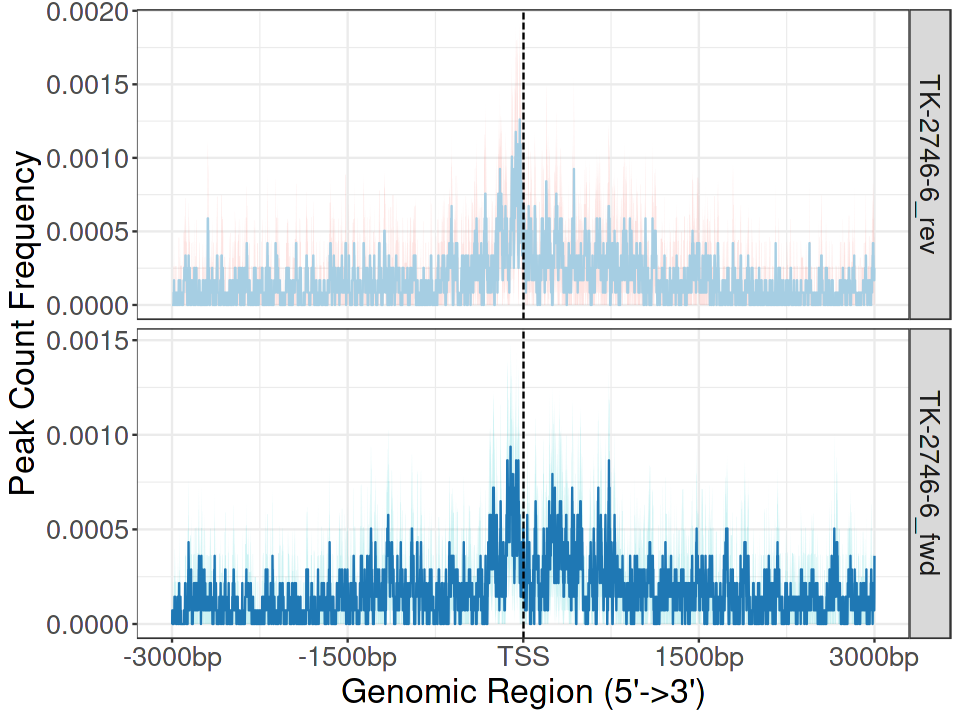

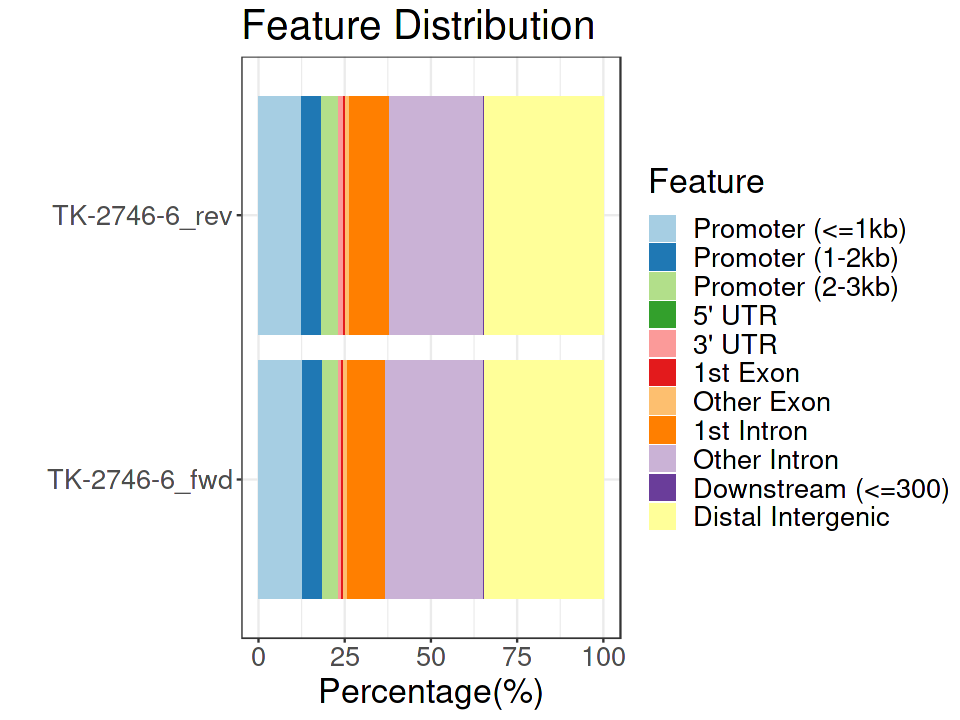

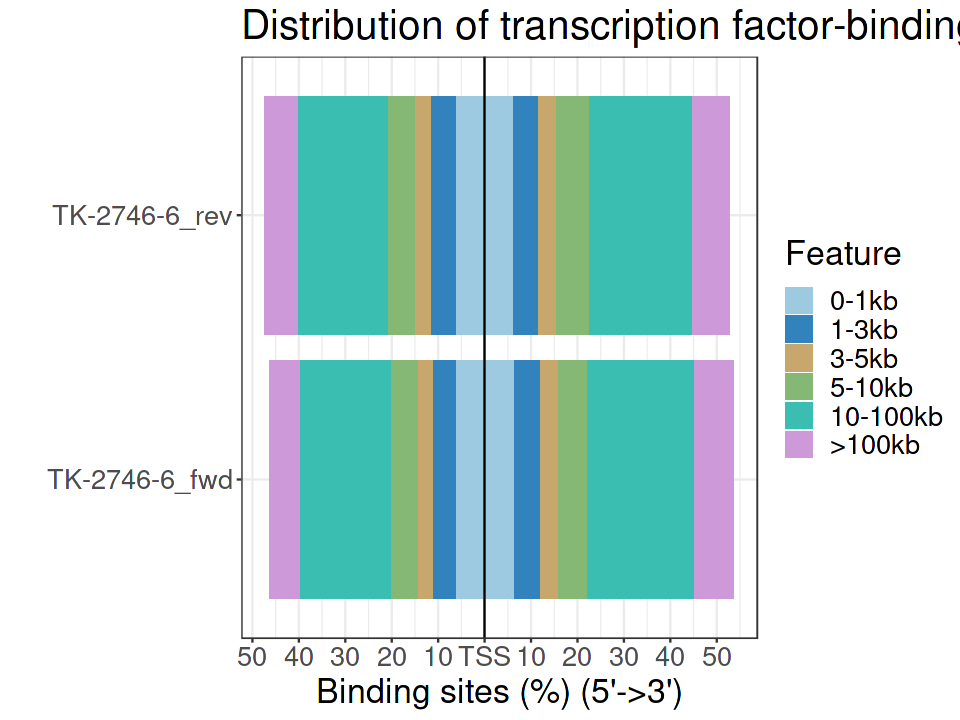

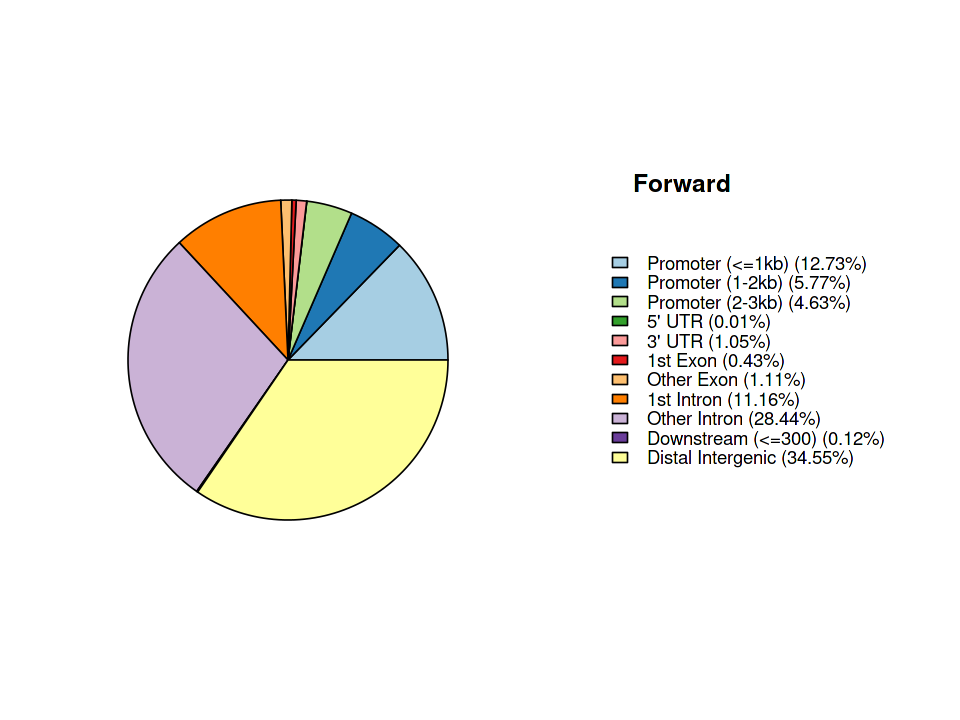

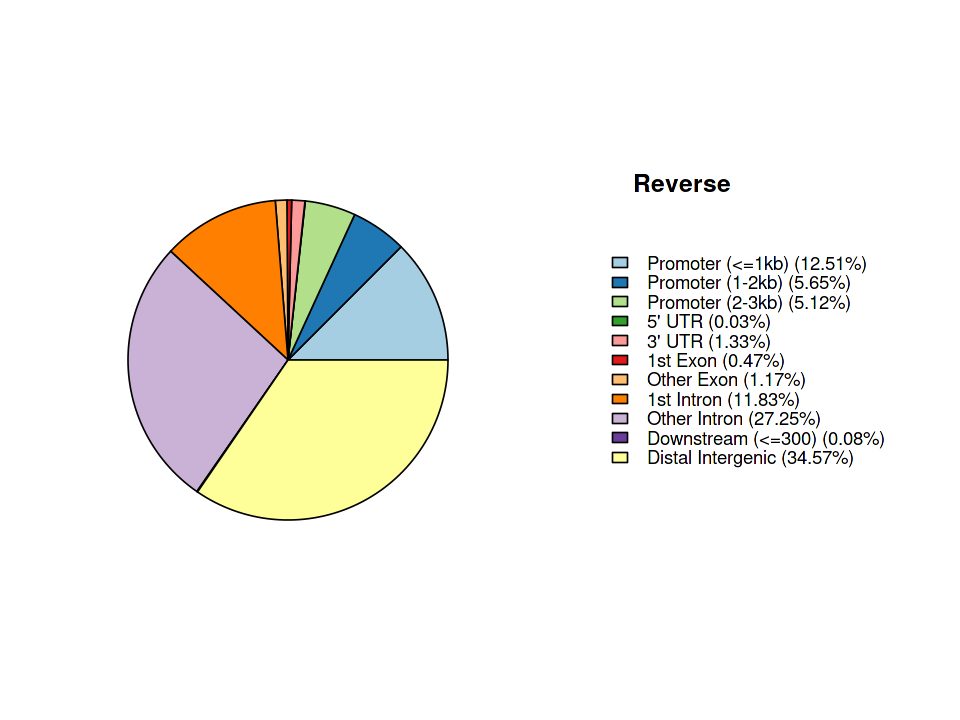

NULL

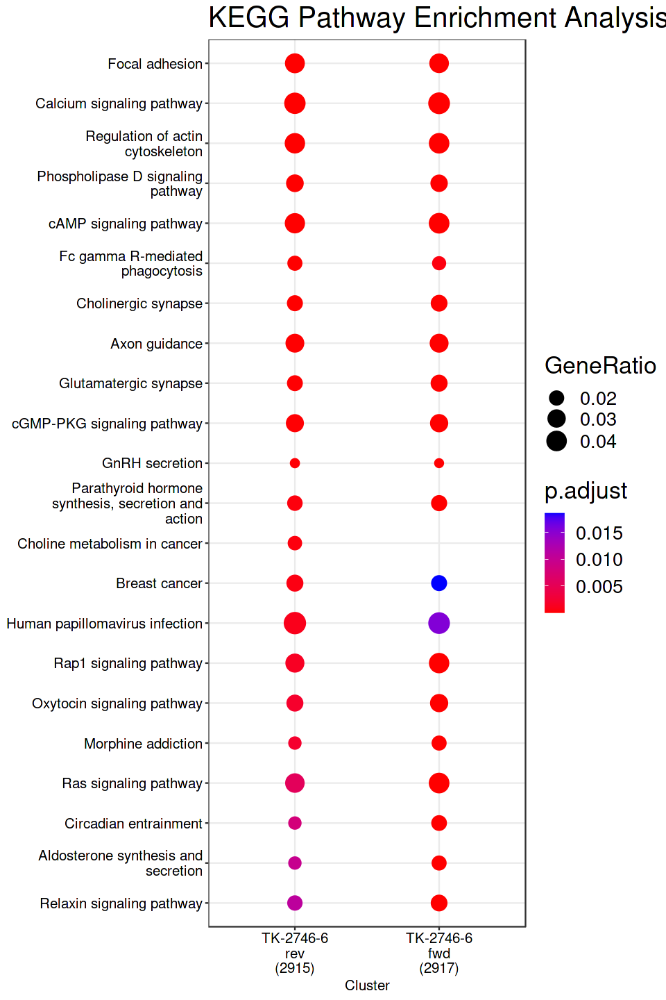

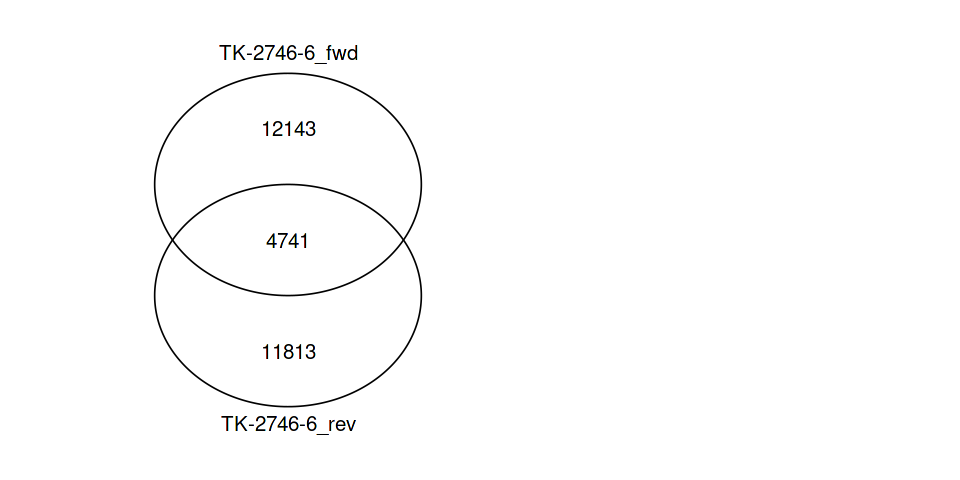

In [72]:
files <- list(
    "TK-2746-6_rev" = "data/stranded/TK-2746-6_S12.breaks.dedup.rev.bed.gz",
    "TK-2746-6_fwd" = "data/stranded/TK-2746-6_S12.breaks.dedup.fwd.bed.gz"
)
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$`TK-2746-6_fwd`
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$`TK-2746-6_rev`
)
title("Reverse", line = -8, adj = 0.2)


genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=12, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## TK-2746-7

>> preparing start_site regions by gene... 2024-05-24 09:11:32 PM
>> preparing tag matrix...  2024-05-24 09:11:32 PM 
>> preparing start_site regions by gene... 2024-05-24 09:11:41 PM
>> preparing tag matrix...  2024-05-24 09:11:41 PM 
>> plotting figure...			 2024-05-24 09:11:49 PM 


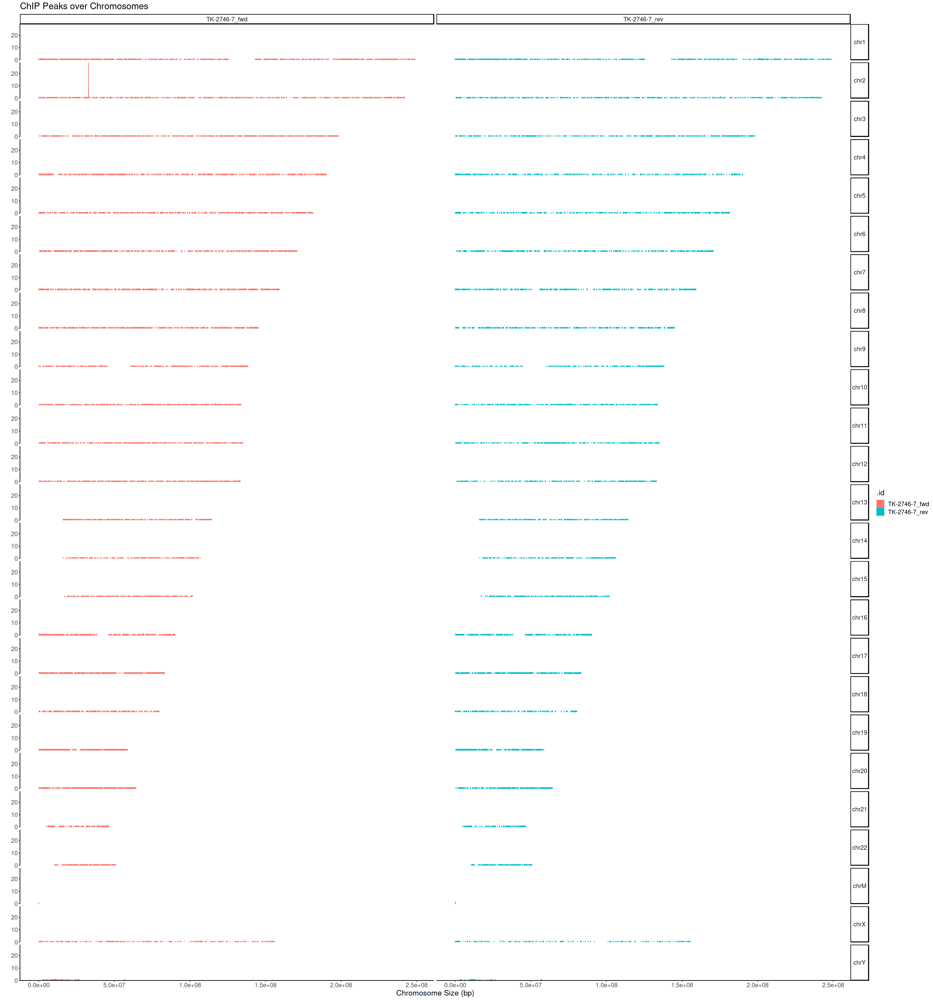

>> plotting figure...			 2024-05-24 09:11:50 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:11:53 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:11:58 PM 


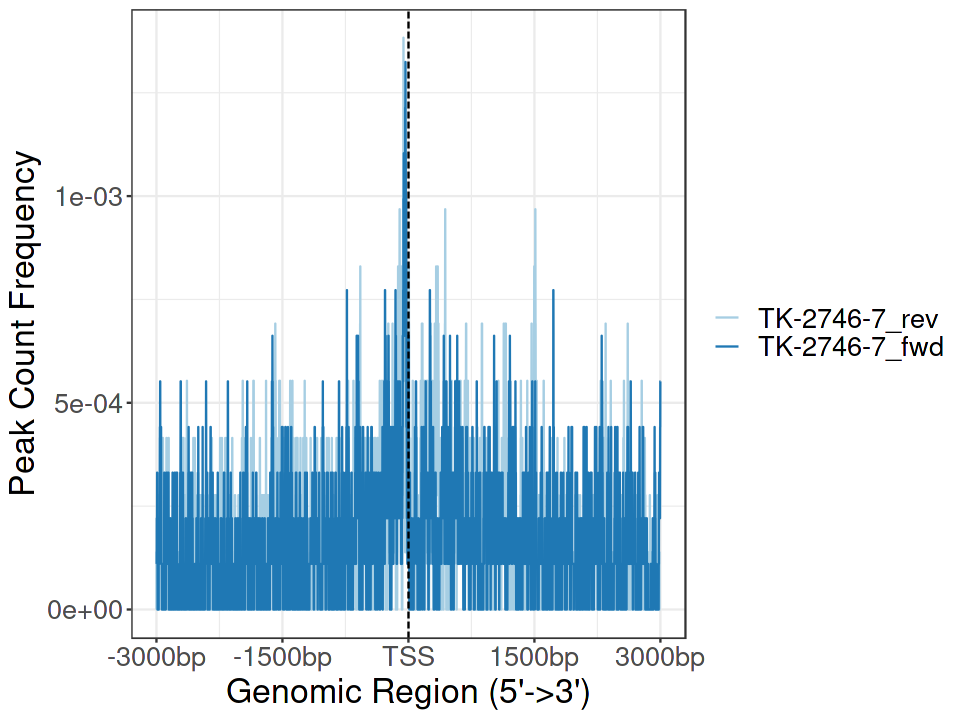

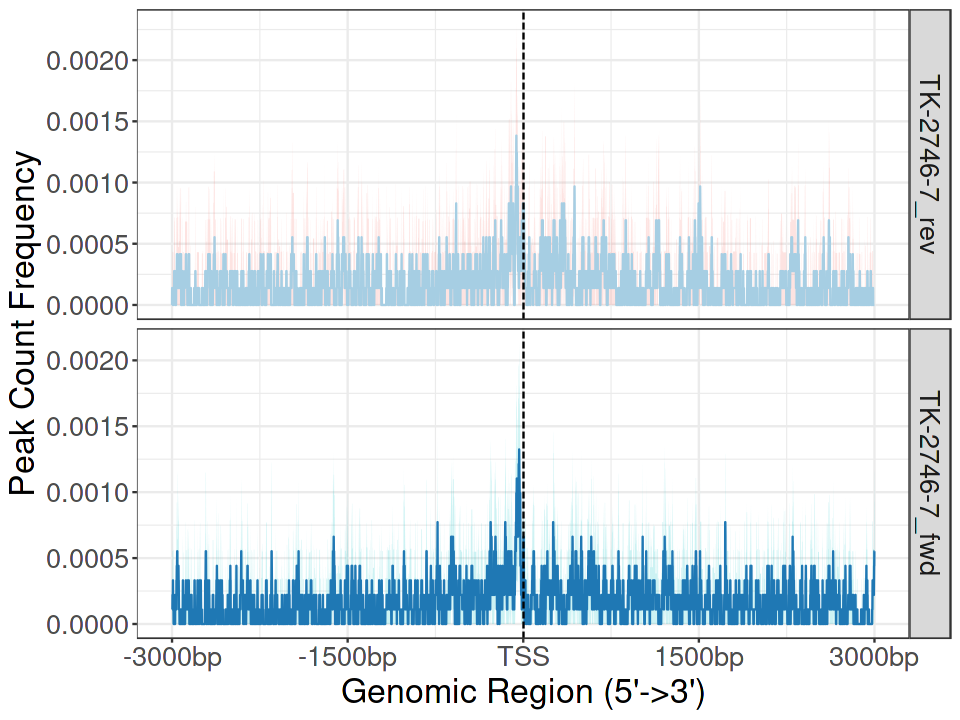

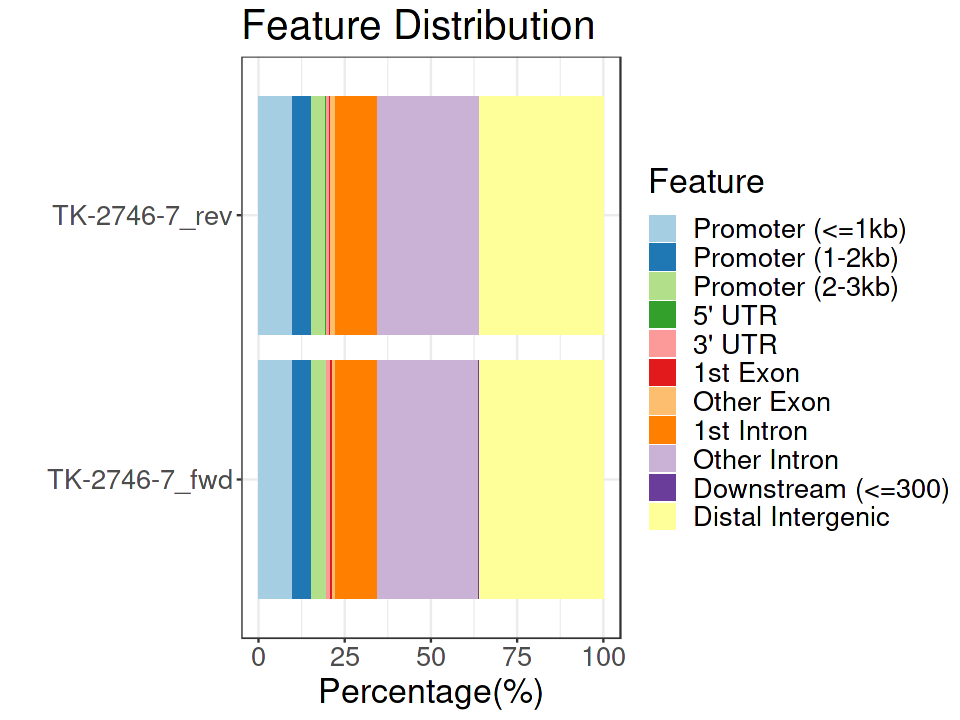

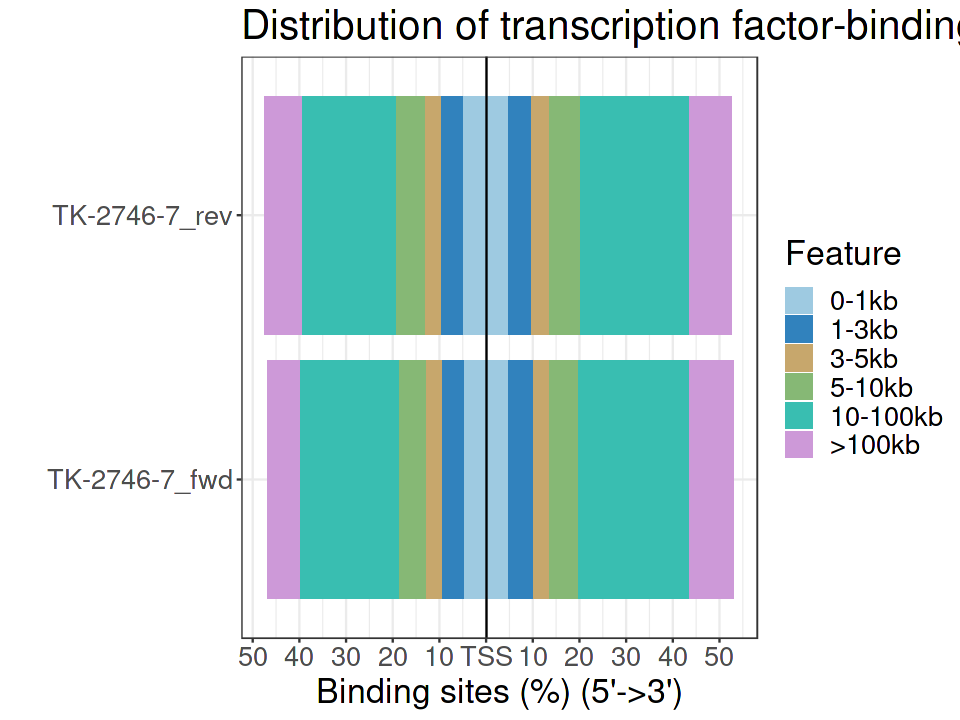

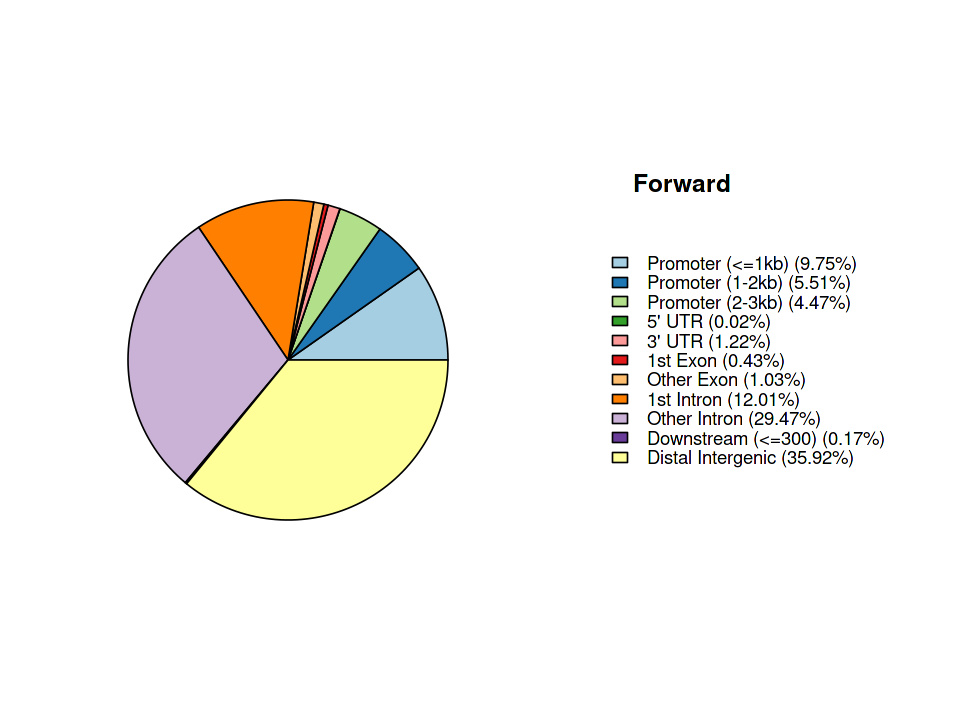

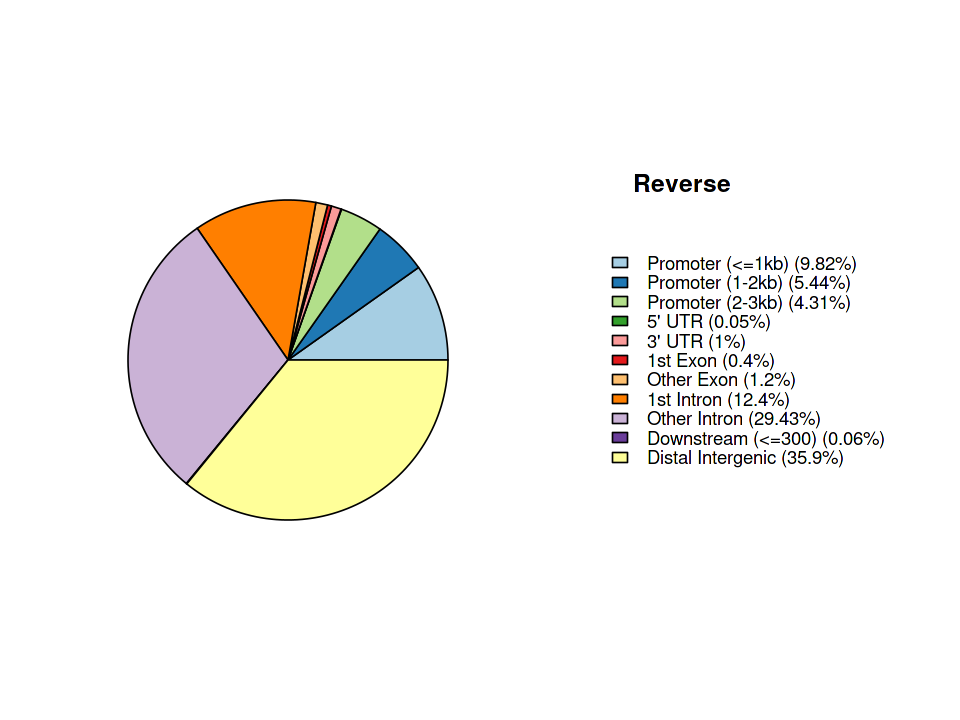

NULL

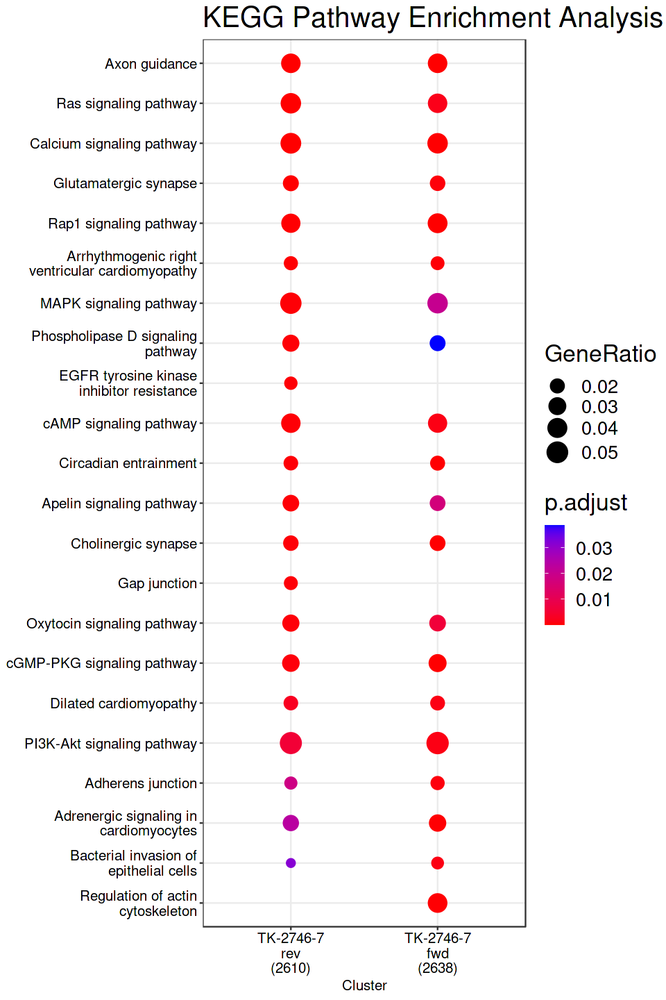

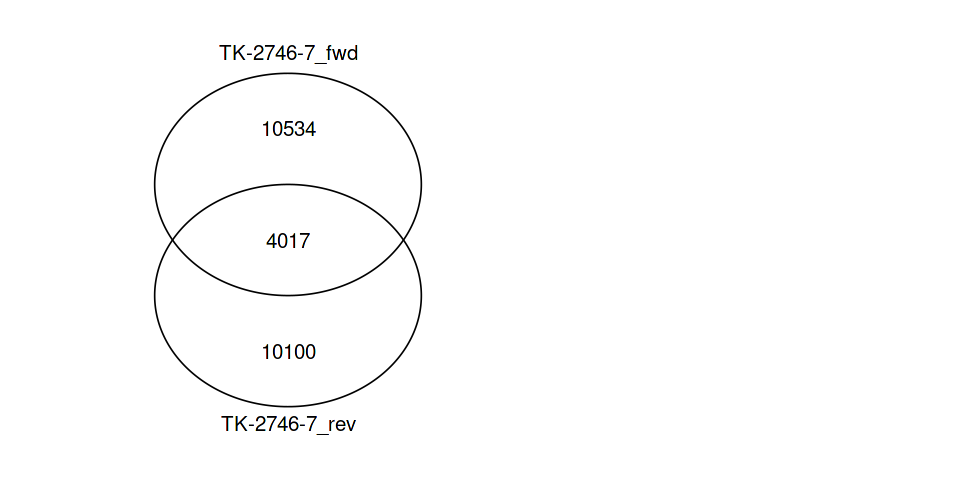

In [73]:
files <- list(
    "TK-2746-7_rev" = "data/stranded/TK-2746-7_S13.breaks.dedup.rev.bed.gz",
    "TK-2746-7_fwd" = "data/stranded/TK-2746-7_S13.breaks.dedup.fwd.bed.gz"
)
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$`TK-2746-7_fwd`
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$`TK-2746-7_rev`
)
title("Reverse", line = -8, adj = 0.2)

genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=12, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))

## TK-2746-8

>> preparing start_site regions by gene... 2024-05-24 09:12:50 PM
>> preparing tag matrix...  2024-05-24 09:12:50 PM 
>> preparing start_site regions by gene... 2024-05-24 09:12:58 PM
>> preparing tag matrix...  2024-05-24 09:12:58 PM 
>> plotting figure...			 2024-05-24 09:13:06 PM 


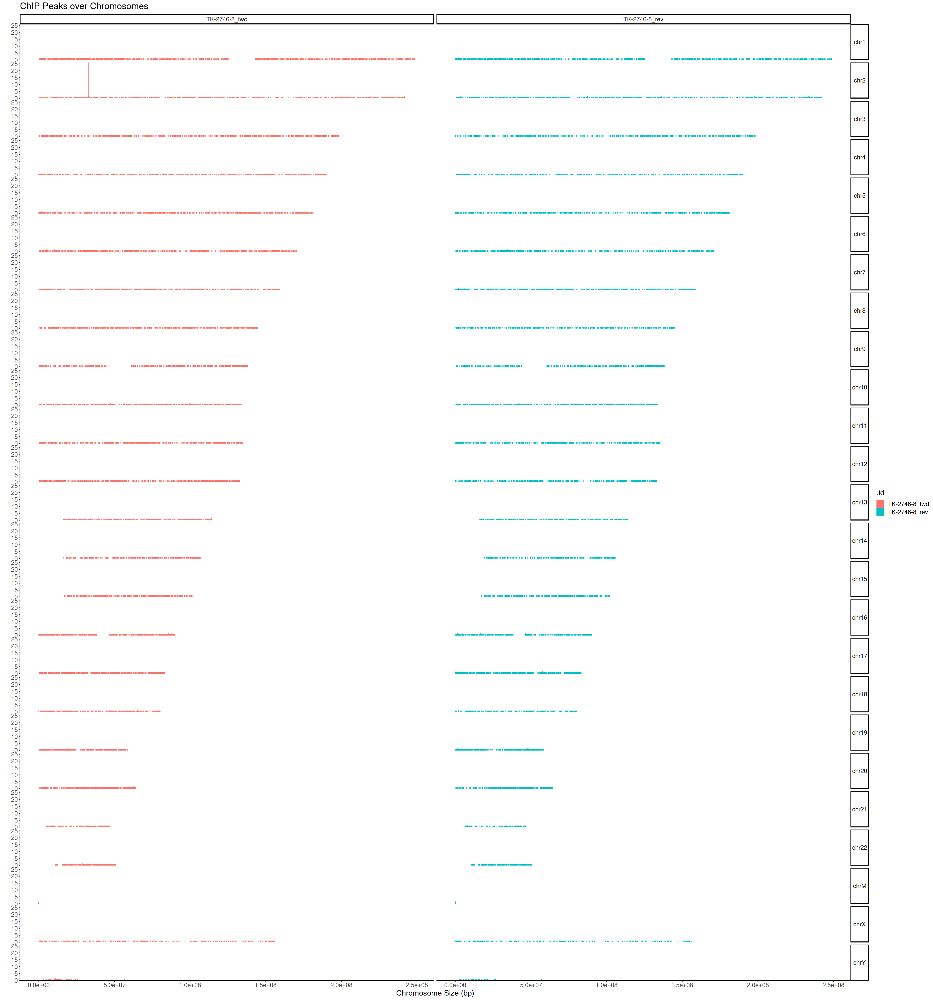

>> plotting figure...			 2024-05-24 09:13:07 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:13:10 PM 
>> Running bootstrapping for tag matrix...		 2024-05-24 09:13:15 PM 


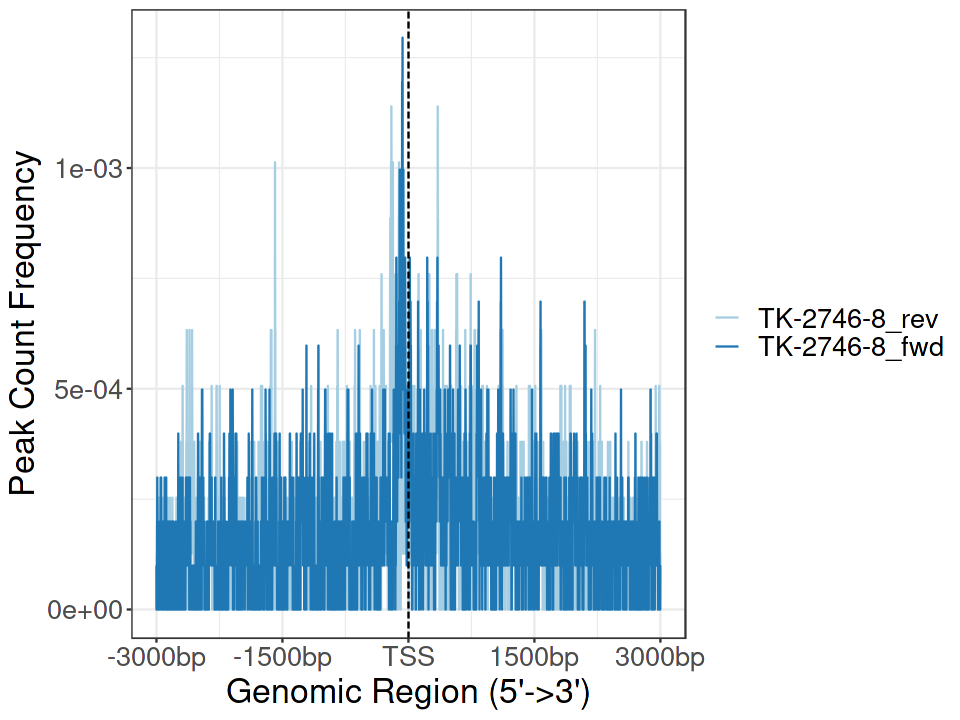

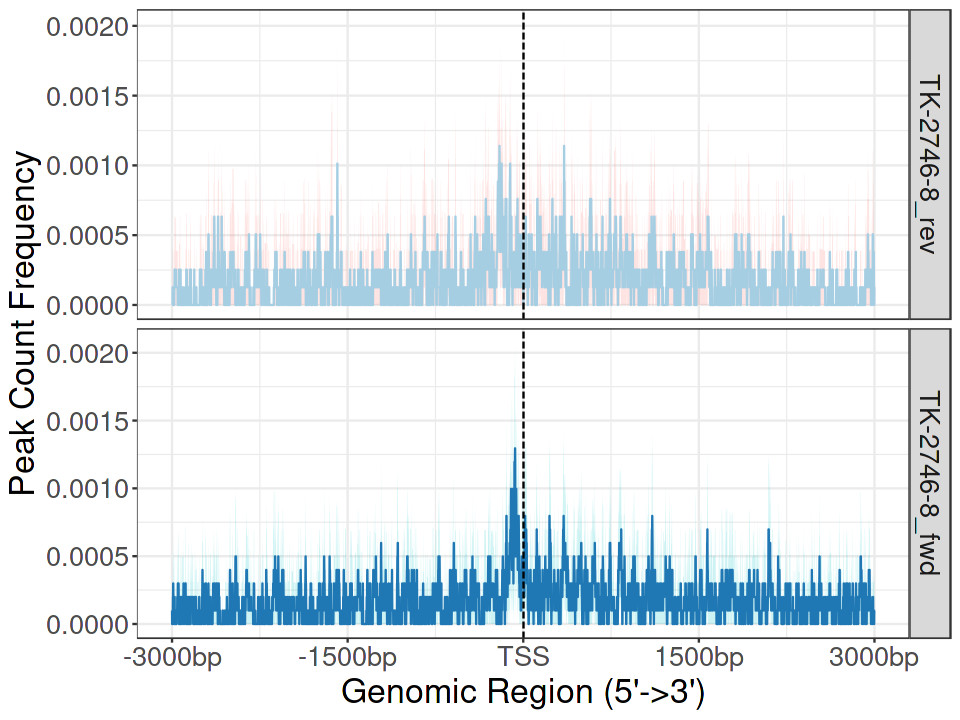

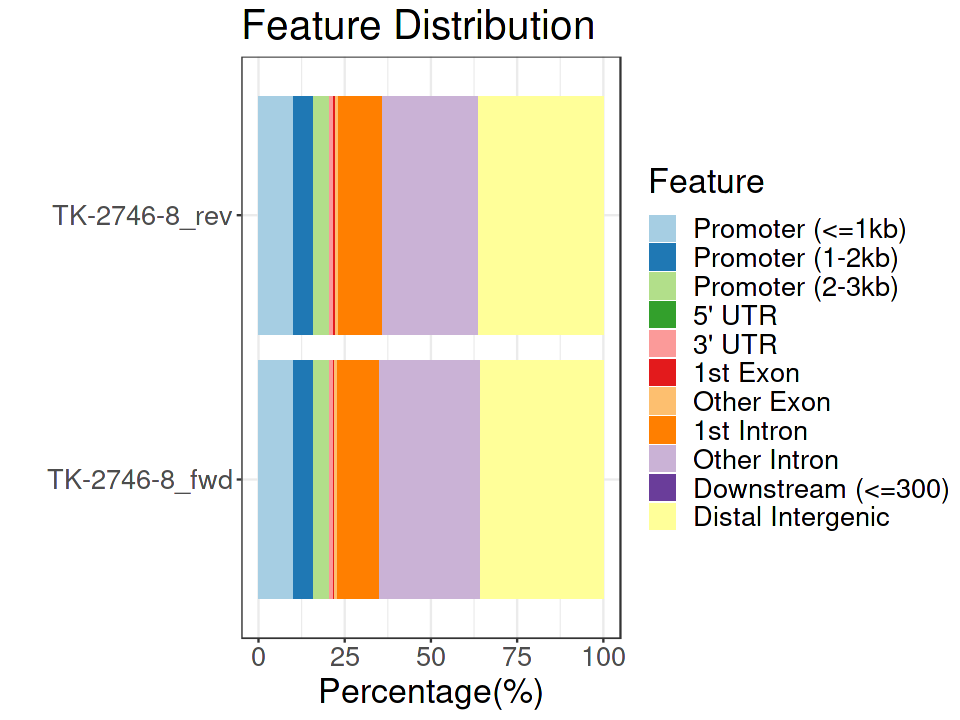

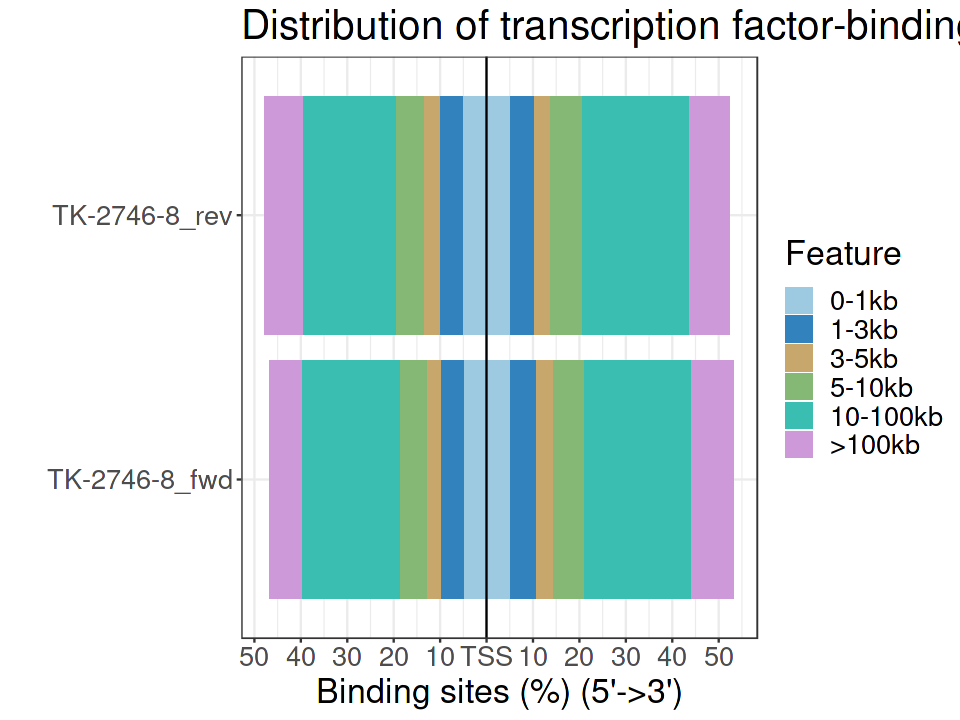

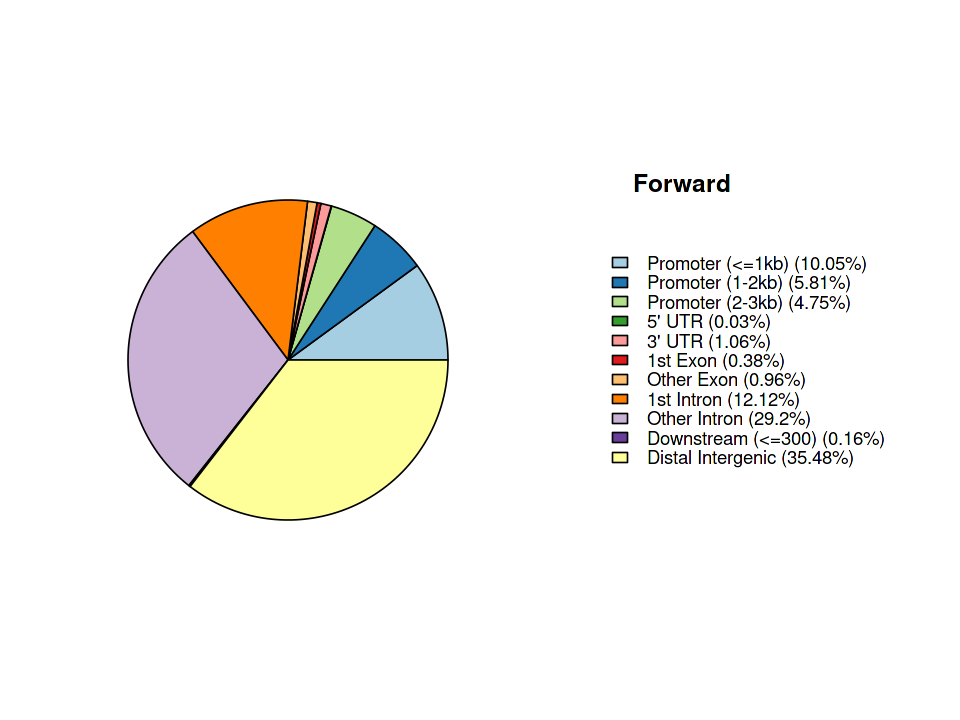

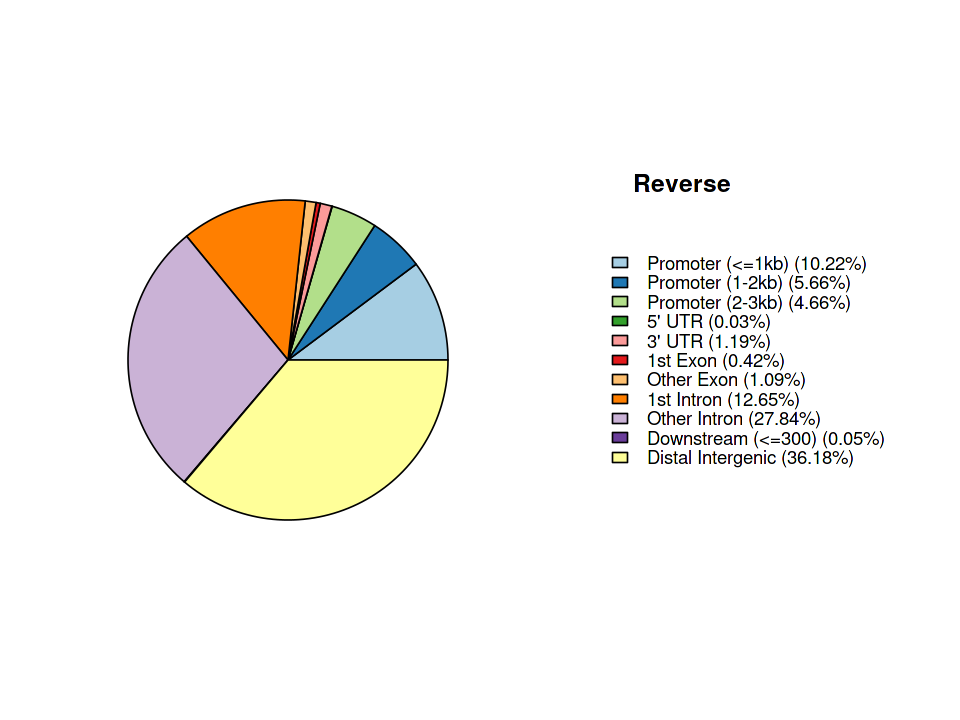

NULL

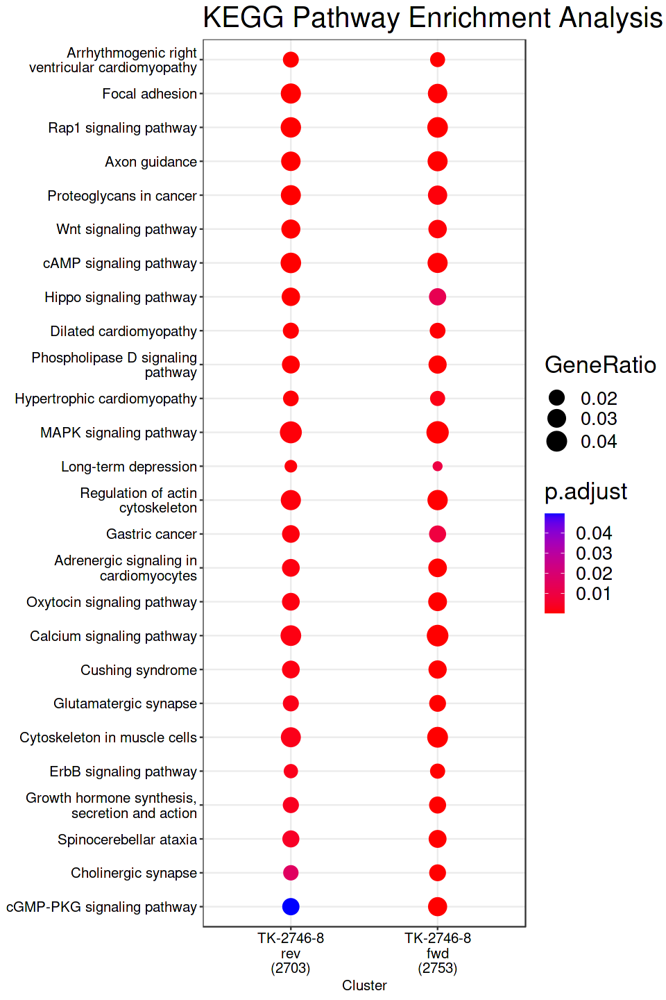

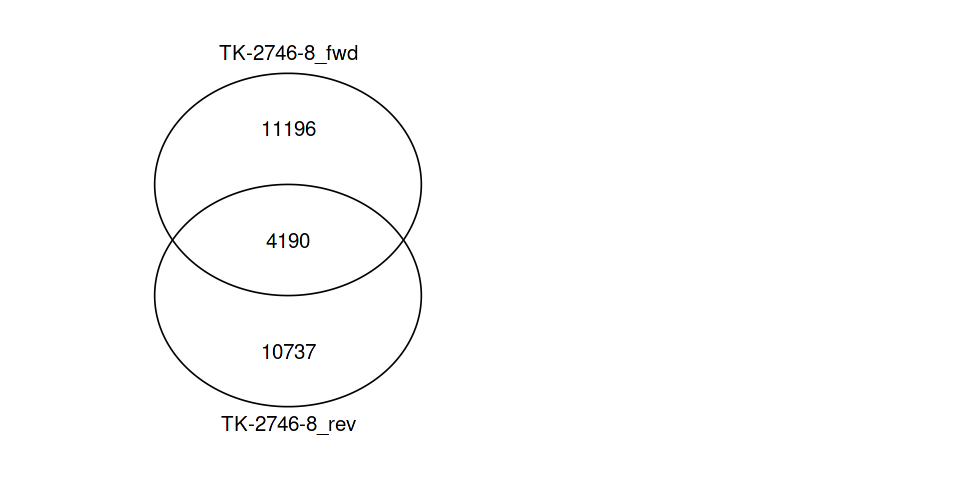

In [74]:
files <- list(
    "TK-2746-8_rev" = "data/stranded/TK-2746-8_S14.breaks.dedup.rev.bed.gz",
    "TK-2746-8_fwd" = "data/stranded/TK-2746-8_S14.breaks.dedup.fwd.bed.gz"
)
options(repr.plot.height=30, repr.plot.width=28)
p <- covplot(files)
p + facet_grid(chr ~ .id) + theme(text=element_text(size=16))
options(repr.plot.height=6, repr.plot.width=8)



promoter <- getPromoters(TxDb=txdb, upstream=3000, downstream=3000)
tagMatrixList <- lapply(files, getTagMatrix, windows=promoter)
##
## to speed up the compilation of this vigenette, we load a precaculated tagMatrixList
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000)) + theme(text=element_text(size=20))
plotAvgProf(tagMatrixList, xlim=c(-3000, 3000), conf=0.95,resample=500, facet="row") + theme(text=element_text(size=20))
peakAnnoList <- lapply(files, annotatePeak, TxDb=txdb,
                       tssRegion=c(-3000, 3000), verbose=FALSE)
plotAnnoBar(peakAnnoList) + theme(text=element_text(size=20))
plotDistToTSS(peakAnnoList) + theme(text=element_text(size=20))

plotAnnoPie(
    peakAnnoList$`TK-2746-8_fwd`
)
title("Forward", line = -8, adj = 0.2)
plotAnnoPie(
    peakAnnoList$`TK-2746-8_rev`
)
title("Reverse", line = -8, adj = 0.2)


genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
names(genes) = sub("_", "\n", names(genes))
compKEGG <- compareCluster(geneCluster   = genes,
                         fun           = "enrichKEGG",
                         pvalueCutoff  = 0.05,
                         pAdjustMethod = "BH")
options(repr.plot.height=12, repr.plot.width=8)
dotplot(compKEGG, showCategory = 15, title = "KEGG Pathway Enrichment Analysis") + theme(text=element_text(size=20))
options(repr.plot.height=4, repr.plot.width=8)
genes = lapply(peakAnnoList, function(i) as.data.frame(i)$geneId)
vennplot(genes) + theme(text=element_text(size=20))